# GravNet Comparison Studies

In [1]:
# System imports
import os
import sys
from pprint import pprint as pp
from time import time as tt
import inspect

# External imports
import matplotlib.pyplot as plt
import matplotlib.colors
from sklearn.decomposition import PCA
from sklearn.metrics import auc
import numpy as np
import pandas as pd
import seaborn as sns
import torch
from torch_geometric.data import Data
from torch_geometric.data import DataLoader
from mpl_toolkits.mplot3d import Axes3D
from itertools import permutations
from itertools import chain

from torch.nn import Linear
from torch_scatter import scatter, segment_csr, scatter_add
from torch_geometric.nn.conv import MessagePassing
from torch_cluster import knn_graph, radius_graph
import trackml.dataset
import torch_geometric

import ipywidgets as widgets
from ipywidgets import interact, interact_manual

# Limit CPU usage on Jupyter
os.environ['OMP_NUM_THREADS'] = '4'

# Pick up local packages
sys.path.append('..')

# Local imports
from prepare import select_hits
from toy_utils import *
%matplotlib inline

# Get rid of RuntimeWarnings, gross
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [2]:
import wandb

## Load Data

In [3]:
def build_event(event_file, pt_min, feature_scale):
    hits, particles, truth = trackml.dataset.load_event(
        event_file, parts=['hits', 'particles', 'truth'])
    hits = select_hits(hits, truth, particles, pt_min=pt_min).assign(evtid=int(event_file[-9:]))
    return hits[['r', 'phi', 'z']].to_numpy() / feature_scale, hits.particle_id.to_numpy()

In [4]:
def prepare_event(event_file, pt_min, feature_scale):
    print("Preparing",event_file)
    X, pid = build_event(event_file, pt_min, feature_scale)
    data = Data(x = torch.from_numpy(X).float(), pid = torch.from_numpy(pid))
    return data

In [5]:
input_dir = "/global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/"
all_events = os.listdir(input_dir)
all_events = [input_dir + event[:14] for event in all_events]
np.random.shuffle(all_events)

In [6]:
train_dataset = [prepare_event(event_file, 0.5, [1000, np.pi, 1000]) for event_file in all_events[:100]]
test_dataset = [prepare_event(event_file, 0.5, [1000, np.pi, 1000]) for event_file in all_events[-10:]]
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000007179
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000007437
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000001476
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000009075
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000005988
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000007297
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000001124
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000001054
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000003408
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000007579
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000008890
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000002512
Preparing /global/cscratch1/

Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000008401
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000009687
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000006756
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000007716
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000004506
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000003187
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000006242
Preparing /global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000009319


In [7]:
def save_model(epoch, model, optimizer, scheduler, running_loss, config, PATH):
    torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'loss': running_loss,
                'config': config
                }, os.path.join('model_comparisons/', PATH))

# Clustering

## No Learning

Let's first look at what the ROC curve is of simply taking the nearest neighbours in (r,phi,z)

In [74]:
# model.eval()

pur, eff = [], []
r_min, r_max, r_step = 0.1, 1.8, 0.1


for r in np.arange(r_min, r_max, r_step):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    for batch in test_loader:
            data = batch.to(device)
#             emb_feats = model(data)

            e = radius_graph(data.x, r=r, batch=batch.batch, loop=False, max_num_neighbors=10000)

#             reference = emb_feats.index_select(0, e[1])
#             neighbors = emb_feats.index_select(0, e[0])

#             d = torch.sum((reference - neighbors)**2, dim=-1)

            y = batch.pid[e[0]] == batch.pid[e[1]]
#             hinge = y.float()
#             hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1 

#             loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs['margin'])
# #             print("Loss:", loss.item())
#             total_loss += loss.item()

            batch_cpu = batch.pid.cpu()
            pids, counts = np.unique(batch_cpu, return_counts=True)
            true = (counts * (counts -1)).sum()

            true_positive = (y.float()).sum().item()
            positive = len(e[0])

            total_positive += max(positive, 1)
            total_true += true
            correct += true_positive


    #         print("True positive:", true_positive, "Positive", positive, "True", true)

    pur.append(correct / total_positive)
    eff.append(correct / total_true)
    # print("Accuracy:", acc, "Efficiency:", eff)
pur, eff = np.array(pur), np.array(eff)

In [75]:
pur, eff

(array([0.02458922, 0.01358847, 0.00849905, 0.0059513 , 0.00458054,
        0.00374606, 0.00317166, 0.00277102, 0.00243801, 0.00219245,
        0.00198045, 0.00180599, 0.0016694 , 0.00156164, 0.00147822,
        0.0014156 , 0.00136943]),
 array([0.09129108, 0.26847558, 0.40926768, 0.51829957, 0.61384285,
        0.6981829 , 0.77088944, 0.83875708, 0.887582  , 0.93264084,
        0.96161841, 0.97701798, 0.98534917, 0.98853413, 0.98916554,
        0.98916554, 0.98916554]))

Text(0.5, 1.0, 'No Learning')

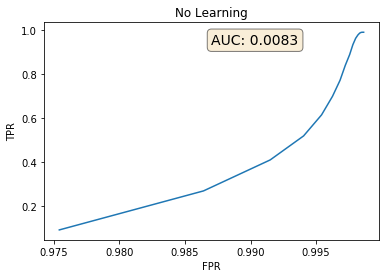

In [77]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-pur, eff)
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-pur, eff)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("No Learning")

## Vanilla Embedding

Train based on datasets drawn around each point

In [8]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        emb_feats = model(data)
        
#         e = knn_graph(emb_feats, k=m_configs['k'], batch=batch.batch, loop=False)
        e = radius_graph(emb_feats, r=m_configs['r_train'], batch=batch.batch, loop=False)
#         print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, reduction=m_configs['reduction'], margin=m_configs['margin'])
        
        if ~(loss != loss):
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            
        correct += (y.float()).sum().item()
        total += len(e[0])
        
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 0, 0, 0, 0, 0
    
    for batch in test_loader:
        data = batch.to(device)
        emb_feats = model(data)
        
        e = radius_graph(emb_feats, r=m_configs['r_val'], batch=batch.batch, loop=False)
#         print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1  
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, reduction=m_configs['reduction'], margin=m_configs['margin'])
        print("Loss:", loss.item())
        if ~(loss != loss):
            total_loss += loss.item()
        
        
        true = (y.float()).sum().item()
        positive = len(e[0])
        
#         true_positive += (true & positive).sum().item()
        
        total_positive += max(positive, 1)
        correct += true
        
        
        print("True:", true, "Positive", positive)

    acc = correct/total_positive
#     eff = (true_positive / total_true)
#     pur = (true_positive / total_positive)
        
    return acc, total_loss

Or based on an enforced contribution of real edges and fake edges

In [20]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        emb_feats = model(data)
        
#         e = radius_graph(emb_feats, r=m_configs['r_train'], batch=batch.batch, loop=False)
        
        # Get true edge list
        records_array = batch.pid.cpu()
        idx_sort = np.argsort(records_array)
        sorted_records_array = records_array[idx_sort]
        _, idx_start, _ = np.unique(sorted_records_array, return_counts=True,
                                return_index=True)

        # sets of indices
        res = np.split(idx_sort, idx_start[1:])
        true_list = torch.cat([torch.tensor(list(permutations(i, r=2))) for i in res if len(list(permutations(i, r=2))) > 0])
        
#         print(batch.pid[true_list.T[0]] == batch.pid[true_list.T[1]])
        
        # Get fake edge list
        candidates = radius_graph(emb_feats, r=m_configs['r_train'], batch=batch.batch, loop=False, max_num_neighbors=100)
#         candidates = knn_graph(emb_feats, k=m_configs['k'], batch=batch.batch, loop=False)
        fake_list = candidates[:,batch.pid[candidates[0]] != batch.pid[candidates[1]]]
        
#         print(batch.pid[fake_list[0]] == batch.pid[fake_list[1]])
        
        # Concatenate all candidates
        e = torch.cat([fake_list, true_list.T.to(device)], axis=-1)
#         print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, reduction=m_configs['reduction'], margin=m_configs['margin'])
        
        if ~(loss != loss):
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            
        correct += (y.float()).sum().item()
        total += len(e[0])
        
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    total_true_positive, total_positive, total_true, total_loss = 0, 0, 0, 0
    
    for batch in test_loader:
        data = batch.to(device)
        emb_feats = model(data)
        
        e = radius_graph(emb_feats, r=m_configs['r_val'], batch=batch.batch, loop=False, max_num_neighbors=100)
#         e = knn_graph(emb_feats, k=m_configs['k'], batch=batch.batch, loop=False)
#         print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1  
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, reduction=m_configs['reduction'], margin=m_configs['margin'])
        print("Loss:", loss.item())
        if ~(loss != loss):
            total_loss += loss.item()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        true = (counts * (counts - 1)).sum()
        total_true += true
        
        true_positive = (y.float()).sum().item()
        total_true_positive += true_positive

        positive = len(e[0])
        total_positive += max(positive, 1)
        
        print("True positive:", true_positive, "True:", true, "Positive", positive)

    eff = (total_true_positive / total_true)
    pur = (total_true_positive / total_positive)
        
    return eff, pur, total_loss

In [21]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class Embedding(torch.nn.Module):
    def __init__(self, in_channels, nb_hidden, nb_layer, emb_dim=3):
        super(Embedding, self).__init__()
        layers = [Linear(in_channels, nb_hidden)]
        ln = [Linear(nb_hidden, nb_hidden) for _ in range(nb_layer-1)]
        layers.extend(ln)
        self.layers = nn.ModuleList(layers)
        self.emb_layer = nn.Linear(nb_hidden, emb_dim)
        self.norm = torch.nn.LayerNorm(nb_hidden)
        self.act = nn.Tanh()
        # self.dropout = nn.Dropout(p=0.7)
#         self.mean = torch.FloatTensor(mean).to(torch.float)
#         self.std = torch.FloatTensor(std).to(torch.float)

    def forward(self, inputs):
        x = inputs.x
#         hits = self.normalize(hits)
        for l in self.layers:
            x = l(x)
            x = self.act(x)
            # hits = self.dropout(hits)
        x = self.norm(x) #Option of LayerNorm
        x = self.emb_layer(x)
        return x

    def normalize(self, hits):
        try:
            hits = (hits-self.mean) / (self.std + 10**-9)
        except:
            self.mean = self.mean.to(device=hits.device)
            self.std  = self.std.to(device=hits.device)
            hits = (hits-self.mean) / (self.std + 10**-9)
        return hits

In [24]:
m_configs = {"in_channels": 3, "nb_hidden": 64, "nb_layer": 4, "emb_dim": 8}
other_configs = {"k": 30, "r_train": 1, "r_val": 1, "margin": 0.5, 'reduction':'mean'}
model = Embedding(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="GravNet", group="Embedding", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=15)
ep = 0

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [25]:
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    acc, train_loss = train(model, train_loader, optimizer)
    print('Training loss: {:.4f}'.format(train_loss))

    model.eval()
    eff, pur, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "val_eff": eff, "val_pur": pur, "train_loss": train_loss, "lr": scheduler._last_lr[0]})

    save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'embedding/'+model_name._name+'.tar')
        

    print('Epoch: {}, Eff: {:.4f}, Pur: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, eff, pur, val_loss, scheduler._last_lr[0], tt()-tic))

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Training loss: 18.8804
Loss: 0.09481962025165558
True positive: 13560.0 True: 33680 Positive 438056
Loss: 0.09576445072889328
True positive: 13199.0 True: 28104 Positive 352415
Loss: 0.0884319394826889
True positive: 15111.0 True: 42252 Positive 586591
Loss: 0.09246646612882614
True positive: 14921.0 True: 37268 Positive 504246
Loss: 0.08919509500265121
True positive: 14893.0 True: 39712 Positive 531990
Loss: 0.09037452191114426
True positive: 14701.0 True: 39706 Positive 528055
Loss: 0.08809303492307663
True positive: 15195.0 True: 44996 Positive 639451
Loss: 0.0914548709988594
True positive: 14278.0 True: 32480 Positive 417455
Loss: 0.09103868156671524
True positive: 13818.0 True: 30946 Positive 387568
Loss: 0.09013073891401291
True positive: 14958.0 True: 44280 Positive 624958
Epoch: 1, Eff: 0.3873, Pur: 0.0289, Loss: 0.9118, LR: 0.001 in time 13.71491289138794
Training loss: 15.9352
Loss: 0.08991711586713791
True positive: 20485.0 True: 37268 Positive 443371
Loss: 0.086427167057991

Loss: 0.09817152470350266
True positive: 34069.0 True: 42252 Positive 355598
Loss: 0.101016104221344
True positive: 32855.0 True: 39706 Positive 311064
Loss: 0.11098955571651459
True positive: 26722.0 True: 32480 Positive 215069
Epoch: 10, Eff: 0.8140, Pur: 0.1061, Loss: 1.0439, LR: 0.001 in time 15.064459323883057
Training loss: 13.9169
Loss: 0.1022854745388031
True positive: 34894.0 True: 42252 Positive 324588
Loss: 0.1104675903916359
True positive: 28007.0 True: 33680 Positive 224076
Loss: 0.10460001975297928
True positive: 32591.0 True: 39712 Positive 278140
Loss: 0.10837283730506897
True positive: 30309.0 True: 37268 Positive 257221
Loss: 0.12257646769285202
True positive: 23562.0 True: 28104 Positive 158284
Loss: 0.1017744168639183
True positive: 36630.0 True: 44280 Positive 349377
Loss: 0.1208961084485054
True positive: 26302.0 True: 30946 Positive 169048
Loss: 0.10061883926391602
True positive: 37114.0 True: 44996 Positive 363553
Loss: 0.11659146100282669
True positive: 27064.0

Training loss: 14.4684
Loss: 0.11160127073526382
True positive: 38143.0 True: 42252 Positive 264062
Loss: 0.10984091460704803
True positive: 40561.0 True: 44280 Positive 291280
Loss: 0.11847461760044098
True positive: 33096.0 True: 37268 Positive 214829
Loss: 0.11410750448703766
True positive: 35874.0 True: 39712 Positive 229761
Loss: 0.12963445484638214
True positive: 27786.0 True: 30946 Positive 140168
Loss: 0.11006316542625427
True positive: 40186.0 True: 44996 Positive 295409
Loss: 0.12619702517986298
True positive: 29235.0 True: 32480 Positive 163164
Loss: 0.11674538254737854
True positive: 30351.0 True: 33680 Positive 190163
Loss: 0.11389297246932983
True positive: 35778.0 True: 39706 Positive 230534
Loss: 0.13222593069076538
True positive: 25524.0 True: 28104 Positive 135013
Epoch: 20, Eff: 0.9012, Pur: 0.1562, Loss: 1.1828, LR: 0.0003 in time 15.01338505744934
Training loss: 14.3451
Loss: 0.11570331454277039
True positive: 33821.0 True: 37268 Positive 219599
Loss: 0.11131238937

Loss: 0.1152871772646904
True positive: 31335.0 True: 33680 Positive 188622
Loss: 0.11281593888998032
True positive: 36968.0 True: 39712 Positive 229393
Loss: 0.11023326218128204
True positive: 39041.0 True: 42252 Positive 259559
Epoch: 29, Eff: 0.9248, Pur: 0.1613, Loss: 1.1641, LR: 0.0003 in time 15.051267623901367
Training loss: 14.6170
Loss: 0.12916824221611023
True positive: 28576.0 True: 30946 Positive 133874
Loss: 0.11770153045654297
True positive: 33613.0 True: 37268 Positive 203959
Loss: 0.12748540937900543
True positive: 30090.0 True: 32480 Positive 154923
Loss: 0.10951158404350281
True positive: 41597.0 True: 44280 Positive 275841
Loss: 0.1139051765203476
True positive: 36620.0 True: 39706 Positive 219462
Loss: 0.11214929819107056
True positive: 39101.0 True: 42252 Positive 247506
Loss: 0.1331484615802765
True positive: 26238.0 True: 28104 Positive 128057
Loss: 0.11745744943618774
True positive: 31204.0 True: 33680 Positive 180828
Loss: 0.1098412349820137
True positive: 4116

KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aab73ed6dd0> (for post_run_cell):


KeyboardInterrupt: 

### Results

Want to get efficiency also, which is number of particles in batch with same PID, under the number of particles in neighbourhood with same PID. Use neighbours and reference with batch.pid

In [13]:
checkpoint = torch.load('model_comparisons/embedding/daily-planet-278.tar')
checkpoint['config']

{'in_channels': 3,
 'nb_hidden': 64,
 'nb_layer': 4,
 'emb_dim': 8,
 'k': 30,
 'r_train': 1,
 'r_val': 1,
 'margin': 0.5,
 'reduction': 'mean'}

In [14]:
m_configs = {"in_channels": 3, "nb_hidden": 64, "nb_layer": 4, "emb_dim": 8}
other_configs = {"k": 50, "r": 1, "margin": 0.5}
model = Embedding(**m_configs).to(device)
m_configs.update(other_configs)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)

optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [26]:
%%time
model.eval()

r_min, r_max, r_step = 0.1, 1.7, 0.05
total_true_positive, total_positive, total_true = np.zeros(int(np.ceil((r_max - r_min)/r_step)), dtype=np.float), np.zeros(int(np.ceil((r_max - r_min)/r_step)), dtype=np.float), np.zeros(int(np.ceil((r_max - r_min)/r_step)), dtype=np.float)

for batch in test_loader:

    data = batch.to(device)
    emb_feats = model(data)
    
    for i, r in enumerate(np.arange(r_min, r_max, r_step)):    
        e = radius_graph(emb_feats, r=r, batch=batch.batch, loop=False, max_num_neighbors=5000)

#         print(e.shape, i)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y = batch.pid[e[0]] == batch.pid[e[1]]

        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        true = (counts * (counts -1)).sum()

        true_positive = (y.float()).sum().item()
        positive = len(e[0])

        total_positive[i] += max(positive, 1)
        total_true[i] += true
#         print(total_true[i])
        total_true_positive[i] += true_positive


        print("True positive:", true_positive, "Positive", positive, "True", true)

#     pur.append(correct / total_positive)
#     eff.append(correct / total_true)
    # print("Accuracy:", acc, "Efficiency:", eff)
pur, eff = total_true_positive / total_positive, total_true_positive / total_true

(32,)
True positive: 0.0 Positive 390 True 44280
True positive: 214.0 Positive 1094 True 44280
True positive: 1980.0 Positive 3772 True 44280
True positive: 4716.0 Positive 7942 True 44280
True positive: 7056.0 Positive 12546 True 44280
True positive: 9002.0 Positive 17470 True 44280
True positive: 10884.0 Positive 23422 True 44280
True positive: 13098.0 Positive 31084 True 44280
True positive: 15876.0 Positive 41048 True 44280
True positive: 19170.0 Positive 54030 True 44280
True positive: 23294.0 Positive 70864 True 44280
True positive: 27514.0 Positive 90906 True 44280
True positive: 31516.0 Positive 113654 True 44280
True positive: 35028.0 Positive 138024 True 44280
True positive: 37594.0 Positive 163476 True 44280
True positive: 39454.0 Positive 189916 True 44280
True positive: 40800.0 Positive 217242 True 44280
True positive: 41792.0 Positive 246100 True 44280
True positive: 42464.0 Positive 276270 True 44280
True positive: 42910.0 Positive 307776 True 44280
True positive: 43226.

True positive: 13148.0 Positive 33456 True 37268
True positive: 15688.0 Positive 43922 True 37268
True positive: 18992.0 Positive 58024 True 37268
True positive: 22514.0 Positive 74398 True 37268
True positive: 25642.0 Positive 91914 True 37268
True positive: 28276.0 Positive 110296 True 37268
True positive: 30488.0 Positive 129182 True 37268
True positive: 32060.0 Positive 148382 True 37268
True positive: 33244.0 Positive 168130 True 37268
True positive: 34130.0 Positive 188412 True 37268
True positive: 34720.0 Positive 209460 True 37268
True positive: 35200.0 Positive 231574 True 37268
True positive: 35544.0 Positive 254182 True 37268
True positive: 35784.0 Positive 277916 True 37268
True positive: 35974.0 Positive 302602 True 37268
True positive: 36154.0 Positive 328556 True 37268
True positive: 36272.0 Positive 355156 True 37268
True positive: 36432.0 Positive 383028 True 37268
True positive: 36540.0 Positive 412268 True 37268
True positive: 36626.0 Positive 441952 True 37268
True 

In [40]:
srtargs = np.argsort(eff)

In [41]:
pur, eff = pur[srtargs], eff[srtargs]

In [27]:
pur

array([0.00067114, 0.20914397, 0.55930054, 0.62216958, 0.59245807,
       0.54371754, 0.49742137, 0.45662619, 0.41823856, 0.38178149,
       0.3515631 , 0.32360943, 0.29758599, 0.27311514, 0.24947932,
       0.22718371, 0.20682343, 0.18823709, 0.17174251, 0.15698048,
       0.14376731, 0.13190817, 0.12137822, 0.11201676, 0.10360721,
       0.09609296, 0.08935584, 0.08327883, 0.07780303, 0.07283008,
       0.06827975, 0.06411605])

In [28]:
eff

array([5.35584215e-06, 4.60602425e-03, 4.48819572e-02, 1.08311196e-01,
       1.59877244e-01, 2.02397275e-01, 2.46406230e-01, 2.97259951e-01,
       3.57448905e-01, 4.28649471e-01, 5.18402674e-01, 6.10298213e-01,
       6.96816487e-01, 7.70705686e-01, 8.27595441e-01, 8.70468958e-01,
       9.02089850e-01, 9.25553794e-01, 9.42596084e-01, 9.55235871e-01,
       9.64314024e-01, 9.70746390e-01, 9.75743391e-01, 9.79835254e-01,
       9.83139809e-01, 9.85732037e-01, 9.87836882e-01, 9.89497194e-01,
       9.91061099e-01, 9.92383992e-01, 9.93396247e-01, 9.94242470e-01])

Text(0.5, 1.0, 'Vanilla Embedding')

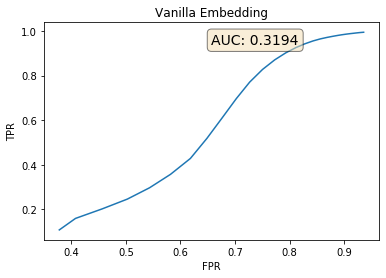

In [29]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-pur[3:], eff[3:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-pur[3:], eff[3:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("Vanilla Embedding")

torch.Size([2, 298260])
298260
Loss: 0.15419428050518036
True positive: 37708.0 Positive 298260 True 38400
torch.Size([2, 186520])
186520
Loss: 0.1855025440454483
True positive: 29572.0 Positive 186520 True 29944
torch.Size([2, 259312])
259312
Loss: 0.1651289016008377
True positive: 34814.0 Positive 259312 True 35638
torch.Size([2, 442452])
442452
Loss: 0.14568683505058289
True positive: 46656.0 Positive 442452 True 47830
torch.Size([2, 280586])
280586
Loss: 0.16201703250408173
True positive: 37400.0 Positive 280586 True 38300
torch.Size([2, 325234])
325234
Loss: 0.15440510213375092
True positive: 39324.0 Positive 325234 True 40118
torch.Size([2, 290088])
290088
Loss: 0.16361072659492493
True positive: 37880.0 Positive 290088 True 38420
torch.Size([2, 378654])
378654
Loss: 0.15241053700447083
True positive: 42430.0 Positive 378654 True 43452
torch.Size([2, 315234])
315234
Loss: 0.16031067073345184
True positive: 38870.0 Positive 315234 True 39962
torch.Size([2, 372694])
372694
Loss: 0.

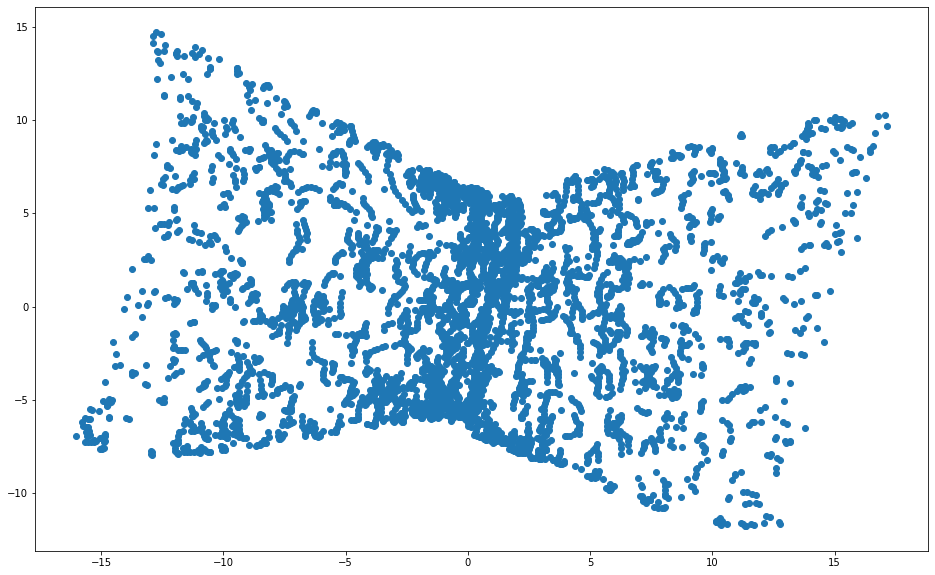

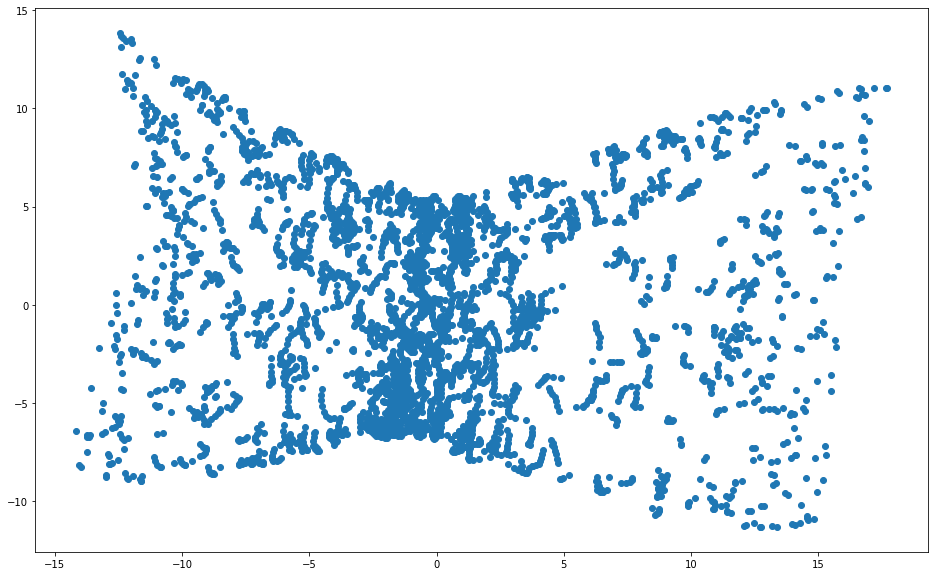

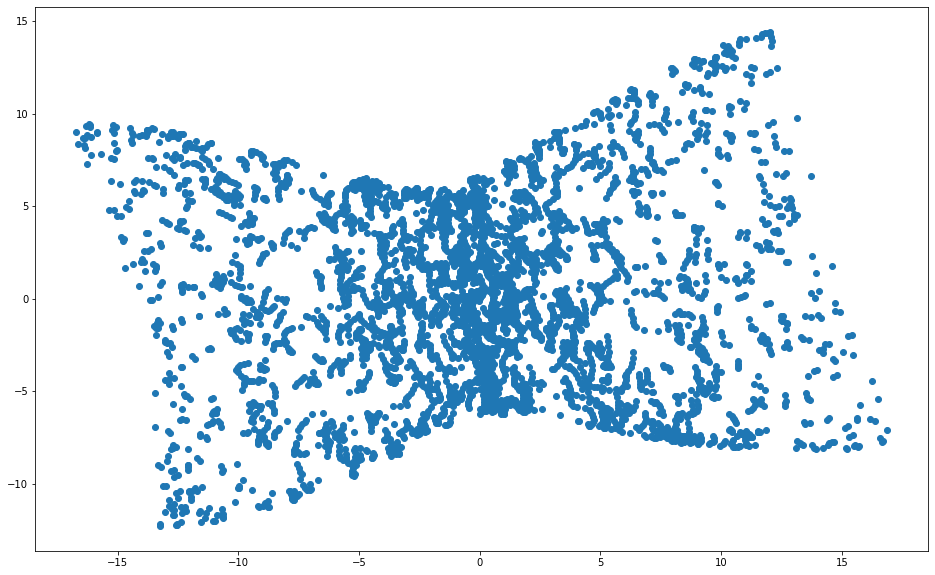

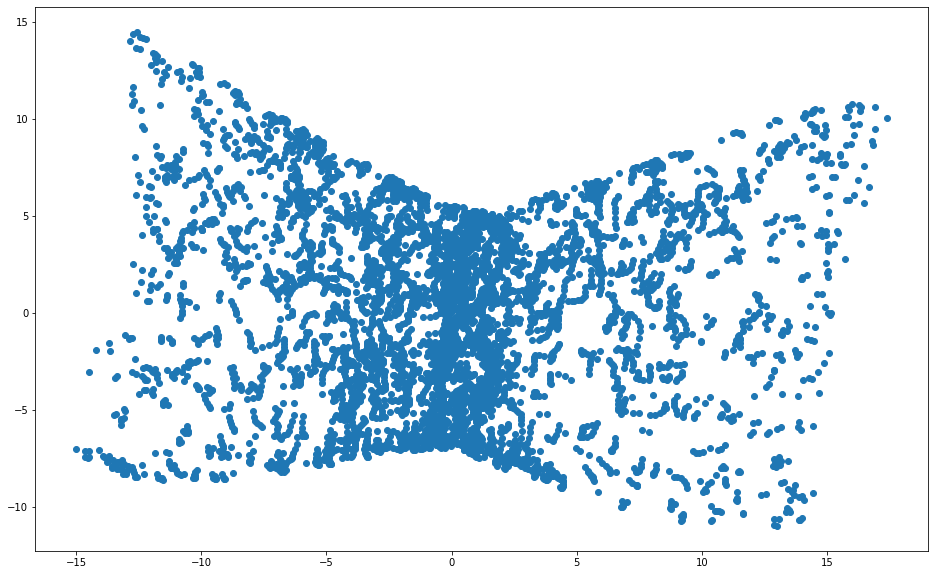

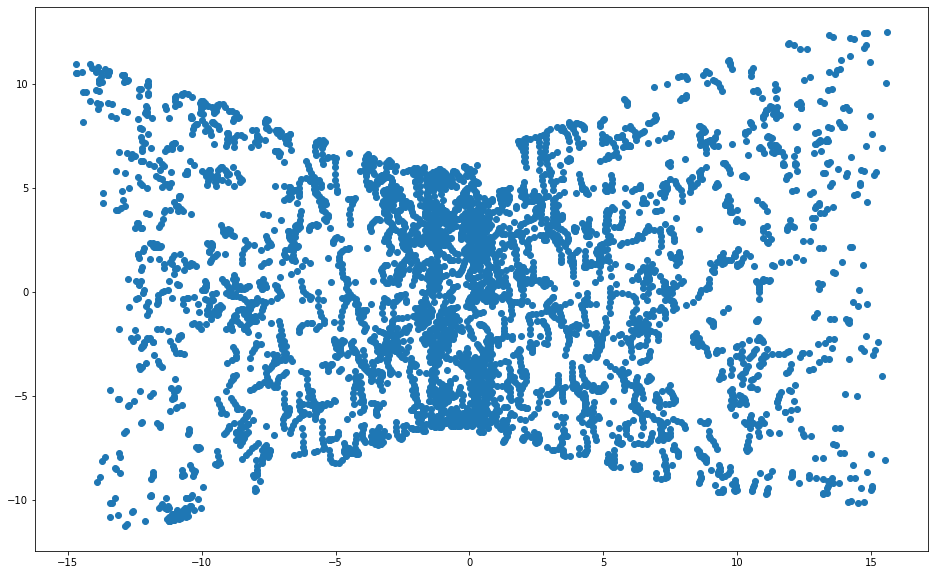

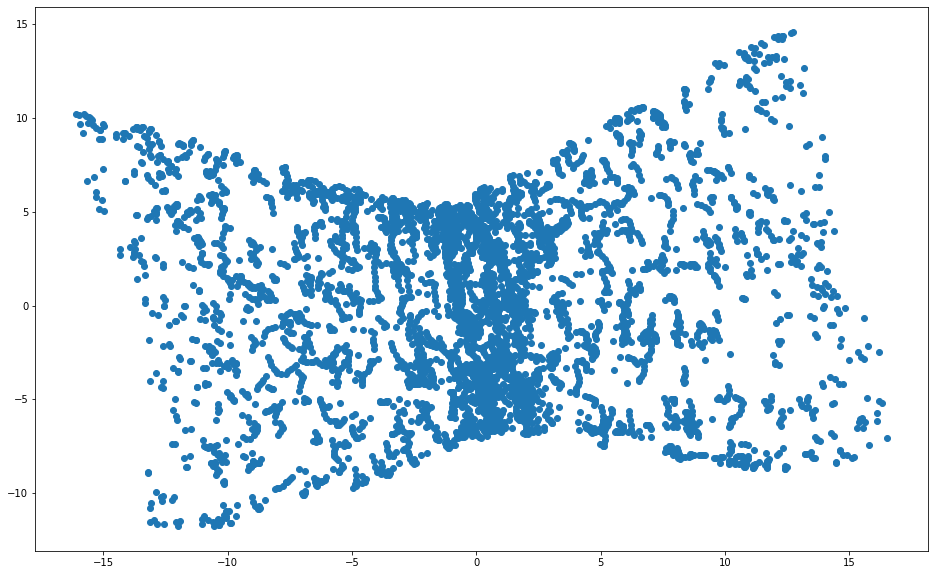

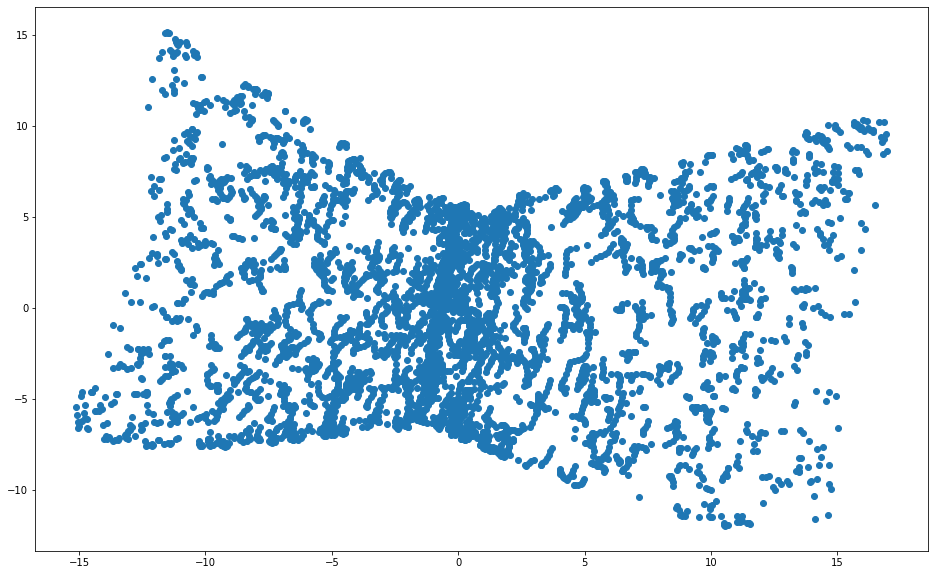

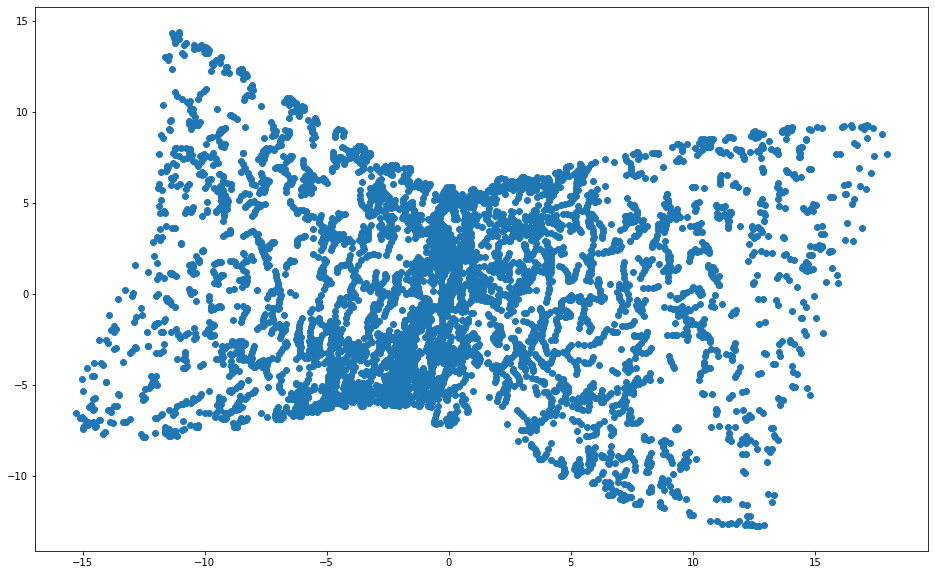

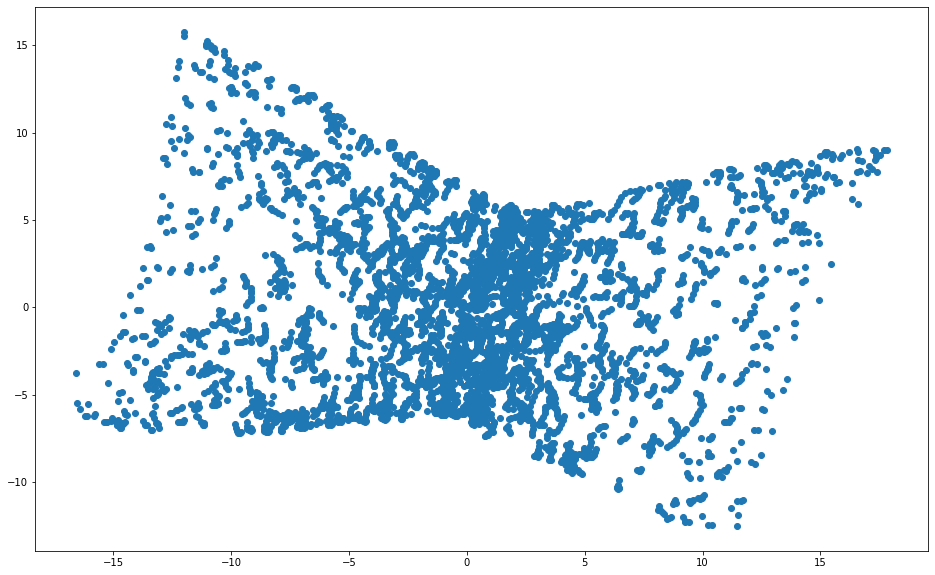

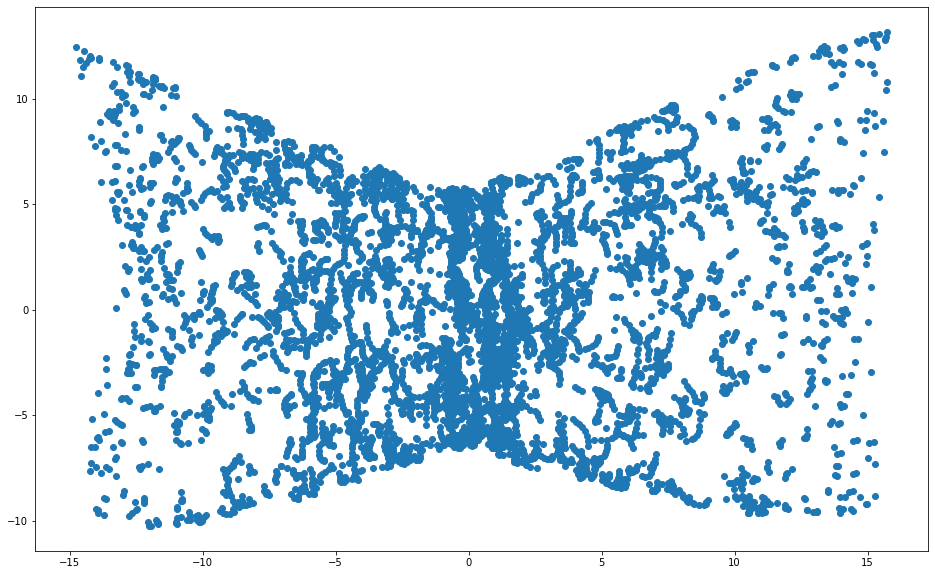

In [27]:
model.eval()
correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0

for batch in test_loader:
        data = batch.to(device)
        emb_feats = model(data)
        
        e = radius_graph(emb_feats, r=1.8, batch=batch.batch, loop=False, max_num_neighbors=1000)
        print(e.shape)
        
        embedded = emb_feats.cpu().detach().numpy()
#         print("Embedded", embedded)
        pca = PCA(n_components=2)
        pca_result = pca.fit_transform(embedded)
        #         print("PCA", pca_result)
        plt.figure(figsize=(16,10))
        plt.scatter(pca_result[:,0], pca_result[:,1])
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        print(len(y))
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1 
#         print(y)
#         print(hinge)
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs['margin'])
        print("Loss:", loss.item())
        total_loss += loss.item()
        
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        true = (counts * (counts -1)).sum()
        
        true_positive = (y.float()).sum().item()
        positive = len(e[0])
        
#         true_positive += (true & positive).sum().item()
        
        total_positive += max(positive, 1)
        total_true += true
        correct += true_positive
        
        
        print("True positive:", true_positive, "Positive", positive, "True", true)

acc = correct / total_positive
eff = correct / total_true
print("Purity:", acc, "Efficiency:", eff)


In [230]:
embedded = emb_feats.cpu().detach().numpy()
pca = PCA(n_components=3)
px = pca.fit_transform(embedded)

In [231]:
P = batch.pid.unique()[0]
Pmask = (batch.pid == P).cpu()
x = batch.x.cpu()

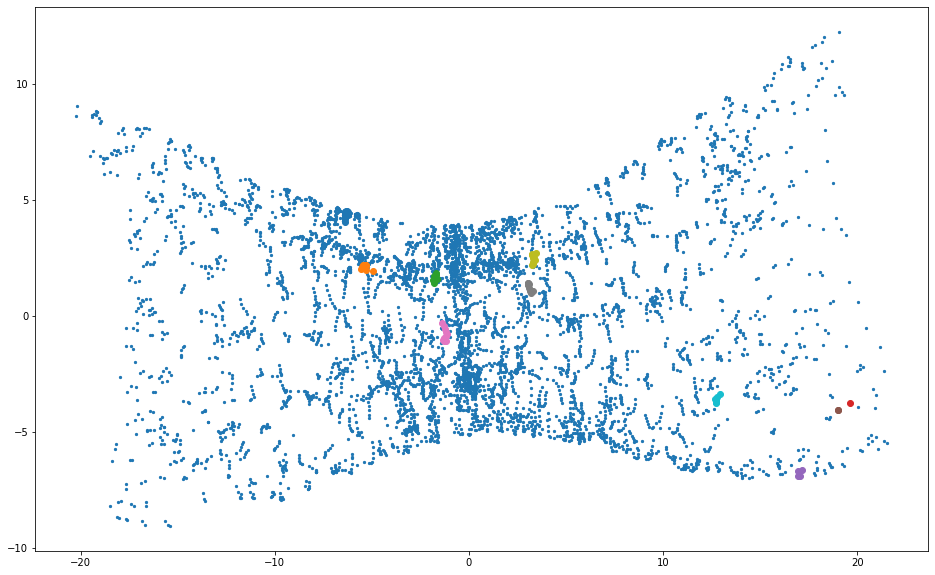

In [232]:
plt.figure(figsize=(16,10))
plt.scatter(px[:,0], px[:,1], s=5)
for P in batch.pid.unique()[10:20]:
    Pmask = (batch.pid == P).cpu()
    plt.scatter(px[Pmask,0], px[Pmask,1])

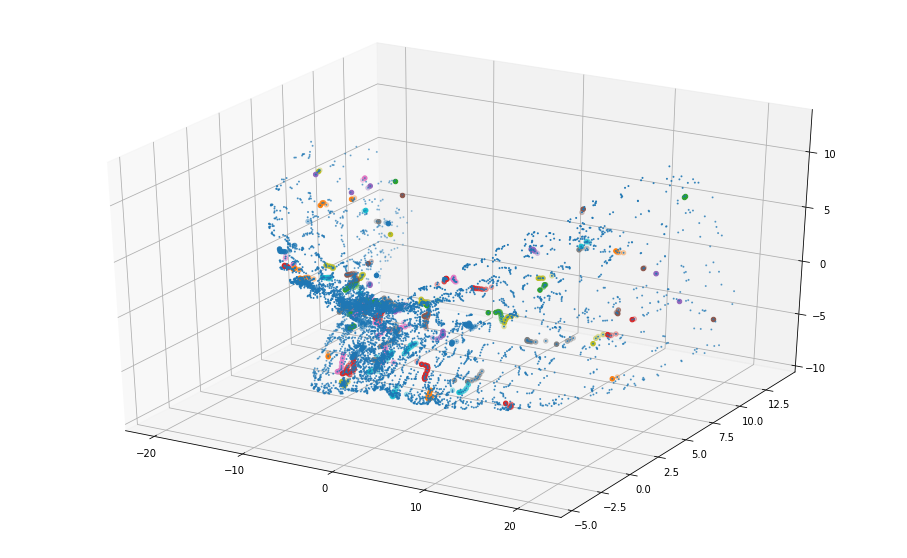

In [233]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(px[:,0], px[:,2], px[:,1], s=1)
for P in batch.pid.unique()[::10]:
    Pmask = (batch.pid == P).cpu()
    ax.scatter(px[Pmask,0], px[Pmask,2], px[Pmask,1])

## Vanilla GravNet

As above, we can train with a set training size around each point...

In [8]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        emb_feats, e = model(data)
        
        e = radius_graph(emb_feats, r=m_configs['r_train'], batch=batch.batch, loop=False)
#         print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge)
#         print(loss)
        
        if ~(loss != loss):
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            
        correct += (y.float()).sum().item()
        total += len(e[0])
        
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 0, 0, 0, 0, 0
    
    for batch in test_loader:
        data = batch.to(device)
        emb_feats, e = model(data)
        
#         e = knn_graph(emb_feats, k=m_configs['k'], batch=batch.batch, loop=False)
        e = radius_graph(emb_feats, r=m_configs['r_val'], batch=batch.batch, loop=False, max_num_neighbors=1000)
        print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1  
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge)
        print("Loss:", loss.item())
        if ~(loss != loss):
            total_loss += loss.item()
        
        
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        true = (counts * (counts -1)).sum()
        
        true_positive = (y.float()).sum().item()
        positive = len(e[0])
        
#         true_positive += (true & positive).sum().item()
        
        total_positive += max(positive, 1)
        total_true += true
        correct += true_positive
        
        
        print("True positive:", true_positive, "Positive", positive, "True", true)

    acc = correct / total_positive
    eff = correct / total_true
        
    return acc, eff, total_loss

Or with enforced balancing of true and fake edges

In [57]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        emb_feats = model(data)
        
#         e = radius_graph(emb_feats, r=m_configs['r_train'], batch=batch.batch, loop=False)
        
        # Get true edge list
        records_array = batch.pid.cpu()
        idx_sort = np.argsort(records_array)
        sorted_records_array = records_array[idx_sort]
        _, idx_start, _ = np.unique(sorted_records_array, return_counts=True,
                                return_index=True)

        # sets of indices
        res = np.split(idx_sort, idx_start[1:])
        true_list = torch.cat([torch.tensor(list(permutations(i, r=2))) for i in res if len(list(permutations(i, r=2))) > 0])
        
#         print(batch.pid[true_list.T[0]] == batch.pid[true_list.T[1]])
        
        # Get fake edge list
        candidates = radius_graph(emb_feats, r=m_configs['r_train'], batch=batch.batch, loop=False)
        fake_list = candidates[:,batch.pid[candidates[0]] != batch.pid[candidates[1]]]
        
#         print(batch.pid[fake_list[0]] == batch.pid[fake_list[1]])
        
        # Concatenate all candidates
        e = torch.cat([fake_list, true_list.T.to(device)], axis=-1)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, reduction=m_configs['reduction'], margin=m_configs['margin'])
        
        if ~(loss != loss):
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            
        correct += (y.float()).sum().item()
        total += len(e[0])
        
        
        
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 0, 0, 0, 0, 0
    
    for batch in test_loader:
        data = batch.to(device)
        emb_feats = model(data)
        
        e = radius_graph(emb_feats, r=m_configs['r_val'], batch=batch.batch, loop=False)
#         print(e.shape)
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1  
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, reduction=m_configs['reduction'], margin=m_configs['margin'])
        print("Loss:", loss.item())
        if ~(loss != loss):
            total_loss += loss.item()
        
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        true = (counts * (counts -1)).sum()
        
        true_positive = (y.float()).sum().item()
        positive = len(e[0])
        
#         true_positive += (true & positive).sum().item()
        
        total_positive += max(positive, 1)
        total_true += true
        correct += true_positive
        
        
        print("True positive:", true_positive, "Positive", positive, "True", true)

    acc = correct / total_positive
    eff = correct / total_true
        
    return acc, eff, total_loss

In [58]:
class GravNet(MessagePassing):

    def __init__(self, in_channels, out_channels, space_dimensions,
                 propagate_dimensions, k=None, r=None, **kwargs):
        super(GravNet, self).__init__(**kwargs)

        if knn_graph is None:
            raise ImportError('`GravNetConv` requires `torch-cluster`.')

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.k = k
        self.r = r

#         self.mlp = make_mlp(out_channels, [out_channels]*3,
#                                 hidden_activation=torch.nn.Tanh,
#                                 output_activation=torch.nn.Tanh,
#                                 layer_norm=True)
        
        self.lin_s = Linear(in_channels, space_dimensions)
        self.lin_flr = Linear(in_channels, propagate_dimensions)
        self.lin_fout = Linear(in_channels + 2*propagate_dimensions,
                               out_channels)

        self.reset_parameters()

    def reset_parameters(self):
        self.lin_s.reset_parameters()
        self.lin_flr.reset_parameters()
        self.lin_fout.reset_parameters()


    def forward(self, x, batch=None):
        """"""
        spatial = self.lin_s(x)
        to_propagate = self.lin_flr(x)

        edge_index = knn_graph(spatial, self.k, batch, loop=False, 
                               flow=self.flow) if self.k is not None else radius_graph(spatial,
                            self.r, batch, loop=False, flow=self.flow)
        
        reference = spatial.index_select(0, edge_index[1])
        neighbors = spatial.index_select(0, edge_index[0])

        distancessq = torch.sum((reference - neighbors)**2, dim=-1)
        
        # Factor 10 gives a better initial spread
        distance_weight = torch.exp(-10. * distancessq)

        prop_feat = self.propagate(edge_index, x=to_propagate,
                                   edge_weight=distance_weight)
        
        combine_linout = self.lin_fout(torch.cat([prop_feat, x], dim=-1))
        
        return combine_linout, spatial, edge_index


    def message(self, x_j, edge_weight):
        return x_j * edge_weight.unsqueeze(1)

    def update(self, aggr_out):
        # aggr_out has shape [N, out_channels]        
        # Step 6: Return new node embeddings.
        return aggr_out
    
    def aggregate(self, inputs, index, ptr=None, dim_size=None):
        if ptr is not None:
            for _ in range(self.node_dim):
                ptr = ptr.unsqueeze(0)
            aggr_mean = segment_csr(inputs, ptr, reduce='mean')
            aggr_max = segment_csr(inputs, ptr, reduce='max')
        else:
            aggr_mean = scatter(inputs, index, dim=self.node_dim,
                                dim_size=dim_size, reduce='mean')
            aggr_max = scatter(inputs, index, dim=self.node_dim,
                               dim_size=dim_size, reduce='max')
        return torch.cat([aggr_mean, aggr_max], dim=-1)

    def __repr__(self):
        if self.k is not None:
            return '{}({}, {}, k={})'.format(self.__class__.__name__,
                                         self.in_channels, self.out_channels,
                                         self.k)
        elif self.r is not None:
            return '{}({}, {}, r={})'.format(self.__class__.__name__,
                                         self.in_channels, self.out_channels,
                                         self.r)

In [59]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class GravEmbedding(torch.nn.Module):
    def __init__(self, in_channels, out_channels, nb_hidden, nb_layer, nb_blocks, space_dimensions, propagate_dimensions, r):
        super(GravEmbedding, self).__init__()
        layers_1 = [Linear(nb_hidden, nb_hidden)]
#         layers_2 = [Linear(nb_hidden, nb_hidden)]
        ln_1 = [Linear(nb_hidden, nb_hidden) for _ in range(nb_layer-1)]
#         ln_2 = [Linear(nb_hidden, nb_hidden) for _ in range(nb_layer-1)]
        layers_1.extend(ln_1)
#         layers_2.extend(ln_2)
        self.layers_1 = nn.ModuleList(layers_1)
#         self.layers_2 = nn.ModuleList(layers_2)
#         self.nb_blocks = nb_blocks
        self.act = nn.Tanh()
        self.gravnet_1 = GravNet(nb_hidden, nb_hidden, space_dimensions, propagate_dimensions, r=r)
#         self.gravnet_2 = GravNet(nb_hidden, nb_hidden, space_dimensions, propagate_dimensions, k)
        self.in_feats = Linear(in_channels, nb_hidden)
        self.fc = Linear(nb_hidden, 256)
        self.norm = torch.nn.LayerNorm(256)
        self.out_feats = Linear(256, out_channels)
        # self.dropout = nn.Dropout(p=0.7)
#         self.mean = torch.FloatTensor(mean).to(torch.float)
#         self.std = torch.FloatTensor(std).to(torch.float)

    def forward(self, inputs):
        x = inputs.x
        x = self.in_feats(x)
#         for b in range(self.nb_blocks):
        for l in self.layers_1:
            x = l(x)
            x = self.act(x)
        x, spatial, e = self.gravnet_1(x)
#         x = x_1
# #         x = self.act(x_1)
#         for l in self.layers_2:
#             x = l(x)
#             x = self.act(x)
#             # hits = self.dropout(hits)
#         x_2, _, e = self.gravnet_2(x)
            
#         x = torch.cat([x, spatial], dim=-1)
#         x = self.act(x)
        x = self.act(x)
        x = self.norm(self.act(self.fc(x)))
        x = self.out_feats(x)
        return x

    def normalize(self, hits):
        try:
            hits = (hits-self.mean) / (self.std + 10**-9)
        except:
            self.mean = self.mean.to(device=hits.device)
            self.std  = self.std.to(device=hits.device)
            hits = (hits-self.mean) / (self.std + 10**-9)
        return hits

In [60]:
m_configs = {"in_channels": 3, "out_channels": 8, "nb_hidden": 256, "nb_layer": 3, "nb_blocks": 2, "space_dimensions": 8, "propagate_dimensions": 22, "r": 1}
other_configs = {"k_loss": 50, "r_train": 1, "r_val": 1, "margin": 1, "seed": 0, "reduction": "sum"}
torch.manual_seed(other_configs["seed"])
model = GravEmbedding(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="GravNet", group="GravNet", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=20)
ep = 0
best_loss = None

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [61]:
weight = 1
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    acc, train_loss = train(model, train_loader, optimizer)
    print('Training loss: {:.4f}'.format(train_loss))

    model.eval()
    acc, eff, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "val_acc": acc, "train_loss": train_loss, "lr": scheduler._last_lr[0]})
    
    if (best_loss is None) or val_loss < best_loss: 
        best_loss = val_loss
        save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'gravnet/'+model_name._name+'.tar')
        

    print('Epoch: {}, Accuracy: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, acc, val_loss, scheduler._last_lr[0], tt()-tic))

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Training loss: 13426111.0000
Loss: 20193.22265625
True positive: 11721.0 Positive 52287 True 23724
Loss: 50401.8515625
True positive: 20152.0 Positive 134016 True 43708
Loss: 52113.90234375
True positive: 19491.0 Positive 138584 True 44296
Loss: 44370.765625
True positive: 18719.0 Positive 115481 True 39780
Loss: 44650.4765625
True positive: 19264.0 Positive 119305 True 41288
Loss: 41605.84375
True positive: 18355.0 Positive 109195 True 39436
Loss: 40474.875
True positive: 16881.0 Positive 104008 True 36728
Loss: 48307.1484375
True positive: 18991.0 Positive 127936 True 41484
Loss: 34135.140625
True positive: 15896.0 Positive 88763 True 34632
Loss: 35492.9609375
True positive: 15535.0 Positive 92510 True 33590
Epoch: 1, Accuracy: 0.1617, Loss: 411746.1875, LR: 0.001 in time 15.197318315505981
Training loss: 7557278.0508
Loss: 38181.0703125
True positive: 26155.0 Positive 100235 True 43708
Loss: 30659.1328125
True positive: 21807.0 Positive 79743 True 36728
Loss: 31524.845703125
True po

Loss: 25486.748046875
True positive: 24631.0 Positive 67610 True 34632
Loss: 15017.04296875
True positive: 17330.0 Positive 40497 True 23724
Loss: 31153.6484375
True positive: 28781.0 Positive 83537 True 39780
Loss: 32933.23046875
True positive: 29444.0 Positive 88568 True 41484
Loss: 25229.220703125
True positive: 24403.0 Positive 67358 True 33590
Loss: 28572.75
True positive: 27525.0 Positive 76946 True 39436
Loss: 31361.015625
True positive: 30095.0 Positive 85687 True 41288
Loss: 36471.3671875
True positive: 31440.0 Positive 96742 True 44296
Epoch: 11, Accuracy: 0.3491, Loss: 287786.6367, LR: 0.001 in time 18.116623163223267
Training loss: 5009289.5059
Loss: 30630.66796875
True positive: 28410.0 Positive 83131 True 41484
Loss: 26619.271484375
True positive: 25210.0 Positive 72149 True 36728
Loss: 34086.03125
True positive: 31559.0 Positive 90930 True 43708
Loss: 34312.171875
True positive: 31408.0 Positive 92091 True 44296
Loss: 29254.7109375
True positive: 28249.0 Positive 77563 T

Loss: 26356.99609375
True positive: 29618.0 Positive 70870 True 41288
Loss: 29744.63671875
True positive: 31260.0 Positive 79941 True 43708
Loss: 26492.3671875
True positive: 27849.0 Positive 71069 True 39780
Loss: 21736.341796875
True positive: 24241.0 Positive 58088 True 33590
Loss: 13856.521484375
True positive: 16981.0 Positive 36662 True 23724
Epoch: 21, Accuracy: 0.3972, Loss: 249699.2148, LR: 0.001 in time 17.765990495681763
Training loss: 4736188.4258
Loss: 30635.091796875
True positive: 30814.0 Positive 84722 True 41288
Loss: 35130.1171875
True positive: 32652.0 Positive 96767 True 43708
Loss: 24700.646484375
True positive: 24510.0 Positive 66145 True 33590
Loss: 27552.8046875
True positive: 26752.0 Positive 75133 True 36728
Loss: 35631.47265625
True positive: 32307.0 Positive 98640 True 44296
Loss: 32592.3671875
True positive: 30078.0 Positive 88595 True 41484
Loss: 30134.638671875
True positive: 29287.0 Positive 81863 True 39780
Loss: 15538.3916015625
True positive: 17724.0 

Loss: 14585.435546875
True positive: 17507.0 Positive 38637 True 23724
Loss: 28015.68359375
True positive: 28629.0 Positive 76599 True 39780
Loss: 30922.734375
True positive: 30012.0 Positive 83995 True 41484
Epoch: 31, Accuracy: 0.3743, Loss: 269687.2949, LR: 0.001 in time 17.814176559448242
Training loss: 4593213.8105
Loss: 12898.173828125
True positive: 16212.0 Positive 33397 True 23724
Loss: 24504.97265625
True positive: 26685.0 Positive 65591 True 39780
Loss: 26812.8359375
True positive: 27484.0 Positive 71600 True 41484
Loss: 21080.076171875
True positive: 23223.0 Positive 55543 True 33590
Loss: 24332.51171875
True positive: 26226.0 Positive 64596 True 39436
Loss: 20510.314453125
True positive: 22998.0 Positive 54259 True 34632
Loss: 25125.458984375
True positive: 28466.0 Positive 68116 True 41288
Loss: 29404.69140625
True positive: 29689.0 Positive 78744 True 44296
Loss: 28710.564453125
True positive: 30510.0 Positive 76510 True 43708
Loss: 23049.708984375
True positive: 24834.0

Training loss: 4473183.7949
Loss: 25078.630859375
True positive: 26184.0 Positive 67799 True 36728
Loss: 27794.1015625
True positive: 30464.0 Positive 76346 True 41288
Loss: 25887.8515625
True positive: 27998.0 Positive 70076 True 39436
Loss: 22186.80859375
True positive: 24671.0 Positive 59173 True 34632
Loss: 30757.25
True positive: 32464.0 Positive 83931 True 43708
Loss: 30065.6796875
True positive: 30023.0 Positive 81865 True 41484
Loss: 26953.267578125
True positive: 28904.0 Positive 73334 True 39780
Loss: 32396.404296875
True positive: 32317.0 Positive 88087 True 44296
Loss: 22663.64453125
True positive: 24519.0 Positive 60701 True 33590
Loss: 14098.244140625
True positive: 17497.0 Positive 37616 True 23724
Epoch: 42, Accuracy: 0.3935, Loss: 257881.8828, LR: 0.001 in time 18.008451223373413
Training loss: 4476814.7266
Loss: 28867.919921875
True positive: 29848.0 Positive 78647 True 39780
Loss: 26785.5078125
True positive: 26686.0 Positive 72484 True 36728
Loss: 31908.28515625
Tru

Loss: 21853.998046875
True positive: 24274.0 Positive 58511 True 33590
Loss: 27733.76171875
True positive: 31711.0 Positive 75751 True 43708
Loss: 24737.953125
True positive: 27155.0 Positive 65816 True 39436
Loss: 29416.58984375
True positive: 31461.0 Positive 79673 True 44296
Loss: 24944.8203125
True positive: 29368.0 Positive 67922 True 41288
Loss: 12779.140625
True positive: 16564.0 Positive 33940 True 23724
Loss: 25705.1171875
True positive: 28121.0 Positive 68621 True 39780
Loss: 20738.40234375
True positive: 24140.0 Positive 55485 True 34632
Epoch: 52, Accuracy: 0.4154, Loss: 239093.5234, LR: 0.001 in time 17.702316999435425
Training loss: 4353049.7754
Loss: 13236.59765625
True positive: 17289.0 Positive 35734 True 23724
Loss: 23484.203125
True positive: 26253.0 Positive 64142 True 36728
Loss: 22185.580078125
True positive: 24602.0 Positive 59736 True 33590
Loss: 30561.724609375
True positive: 32242.0 Positive 83646 True 44296
Loss: 29542.884765625
True positive: 32553.0 Positiv

Loss: 28968.22265625
True positive: 30473.0 Positive 79052 True 39780
Loss: 27510.2734375
True positive: 31492.0 Positive 77704 True 41288
Loss: 33110.6953125
True positive: 33425.0 Positive 92012 True 44296
Loss: 22830.064453125
True positive: 25961.0 Positive 62040 True 34632
Loss: 27756.638671875
True positive: 29126.0 Positive 74821 True 39436
Epoch: 62, Accuracy: 0.3912, Loss: 265225.1113, LR: 0.0003 in time 17.301161289215088
Training loss: 4180180.0332
Loss: 27539.361328125
True positive: 31916.0 Positive 77503 True 41288
Loss: 32319.80078125
True positive: 33688.0 Positive 90385 True 44296
Loss: 31375.70703125
True positive: 34171.0 Positive 87044 True 43708
Loss: 22785.39453125
True positive: 25992.0 Positive 62219 True 34632
Loss: 14093.7109375
True positive: 18027.0 Positive 38820 True 23724
Loss: 28840.1796875
True positive: 30735.0 Positive 79645 True 39780
Loss: 25269.04296875
True positive: 27375.0 Positive 70399 True 36728
Loss: 30834.021484375
True positive: 31353.0 Po

KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aaba3280ef0> (for post_run_cell):


KeyboardInterrupt: 

### Results

Want to get efficiency also, which is number of particles in batch with same PID, under the number of particles in neighbourhood with same PID. Use neighbours and reference with batch.pid

In [70]:
m_configs = {"in_channels": 3, "out_channels": 8, "nb_hidden": 256, "nb_layer": 3, "nb_blocks": 2, "space_dimensions": 8, "propagate_dimensions": 22, "k": 20}
other_configs = {"k_loss": 50, "r": 0.1, "margin": 1, "seed": 0}
torch.manual_seed(other_configs["seed"])
model = GravEmbedding(**m_configs).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)

checkpoint = torch.load('model_comparisons/gravnet.tar')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

In [75]:
model.eval()

pur, eff = [], []
r_min, r_max, r_step = 0.1, 2, 0.05


for r in np.arange(r_min, r_max, r_step):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    for batch in test_loader:
            data = batch.to(device)
            emb_feats = model(data)

            e = radius_graph(emb_feats, r=r, batch=batch.batch, loop=False, max_num_neighbors=5000)

            y = batch.pid[e[0]] == batch.pid[e[1]]
            batch_cpu = batch.pid.cpu()
            pids, counts = np.unique(batch_cpu, return_counts=True)
            true = (counts * (counts -1)).sum()

            true_positive = (y.float()).sum().item()
            positive = len(e[0])

            total_positive += max(positive, 1)
            total_true += true
            correct += true_positive

    pur.append(correct / total_positive)
    eff.append(correct / total_true)
    
pur, eff = np.array(pur), np.array(eff)

In [76]:
pur, eff

(array([0.7935015 , 0.89035966, 0.89839838, 0.8870237 , 0.8626853 ,
        0.83667692, 0.8088856 , 0.78034072, 0.75020272, 0.71826458,
        0.687017  , 0.65393682, 0.62060668, 0.58688048, 0.55282   ,
        0.51871933, 0.4837551 , 0.44902759, 0.41420349, 0.38061473,
        0.34868678, 0.31949246, 0.29263916, 0.26783518, 0.24510492,
        0.22411726, 0.20468196, 0.18658579, 0.17006077, 0.1548392 ,
        0.14087885, 0.12801759, 0.11639099, 0.10580582, 0.09619626,
        0.0875114 , 0.07966426, 0.0725879 ]),
 array([0.00490142, 0.02700005, 0.06680822, 0.11219386, 0.15537703,
        0.19901972, 0.24242472, 0.2870498 , 0.32983157, 0.37109748,
        0.41296023, 0.45347087, 0.49312587, 0.53389531, 0.57477566,
        0.6144465 , 0.6541015 , 0.69380932, 0.73380763, 0.77370031,
        0.81012819, 0.84329198, 0.87172337, 0.89561249, 0.9163326 ,
        0.93335552, 0.94759498, 0.95922528, 0.96824642, 0.97551932,
        0.98111264, 0.98516371, 0.98859681, 0.99126935, 0.99320773,
  

Text(0.5, 1.0, 'Vanilla GravNet')

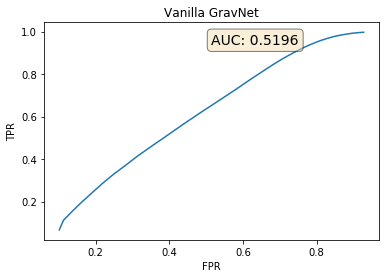

In [80]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-pur[2:], eff[2:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-pur[2:], eff[2:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("Vanilla GravNet")

torch.Size([2, 69022])
69022
Loss: 0.37019553780555725
True positive: 28428.0 Positive 69022 True 39436
torch.Size([2, 71402])
71402
Loss: 0.3683415353298187
True positive: 29358.0 Positive 71402 True 39780
torch.Size([2, 76840])
76840
Loss: 0.372321754693985
True positive: 30164.0 Positive 76840 True 41484
torch.Size([2, 67248])
67248
Loss: 0.3620110750198364
True positive: 26508.0 Positive 67248 True 36728
torch.Size([2, 36080])
36080
Loss: 0.36309200525283813
True positive: 17454.0 Positive 36080 True 23724
torch.Size([2, 70540])
70540
Loss: 0.35734182596206665
True positive: 30664.0 Positive 70540 True 41288
torch.Size([2, 83386])
83386
Loss: 0.36340877413749695
True positive: 32842.0 Positive 83386 True 44296
torch.Size([2, 57818])
57818
Loss: 0.3721063733100891
True positive: 25008.0 Positive 57818 True 34632
torch.Size([2, 59704])
59704
Loss: 0.36724942922592163
True positive: 24880.0 Positive 59704 True 33590
torch.Size([2, 78808])
78808
Loss: 0.35985642671585083
True positive:

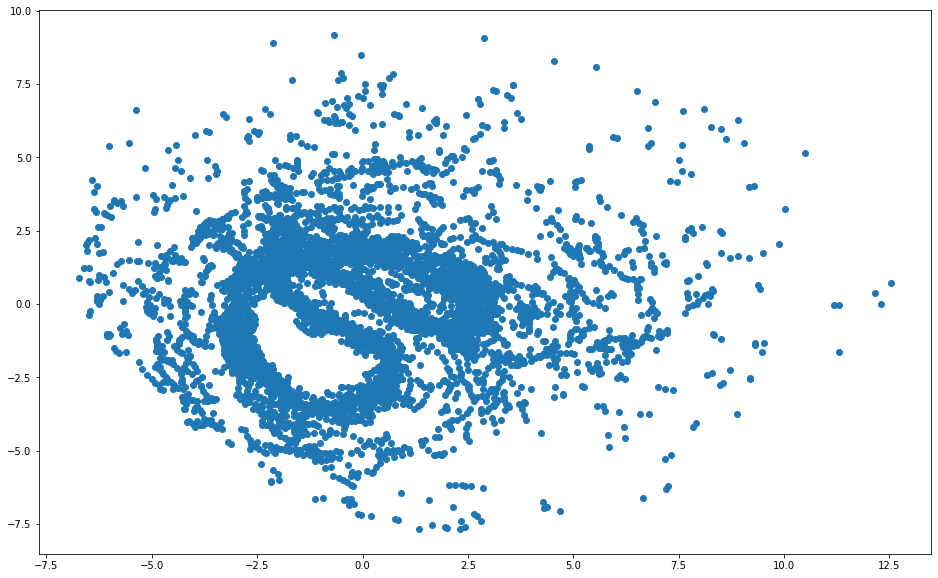

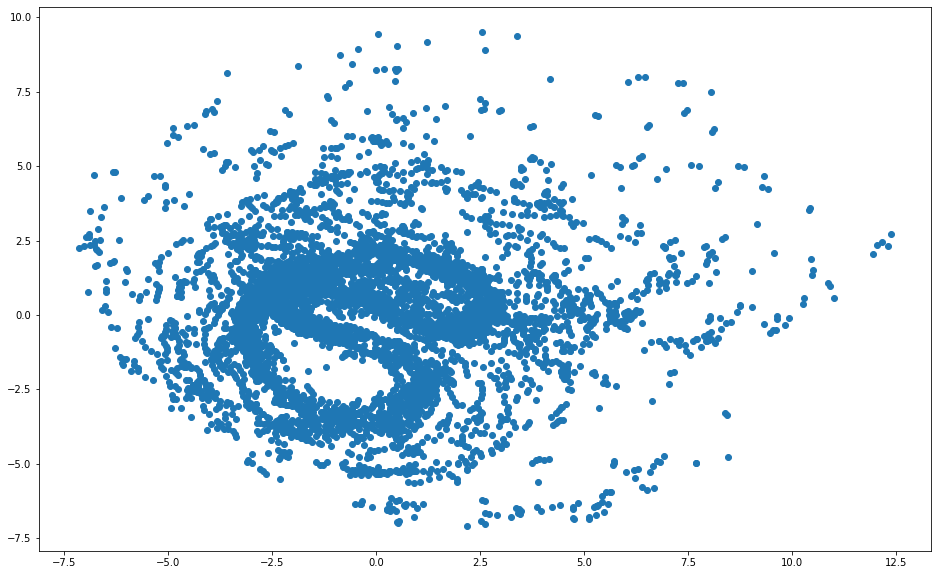

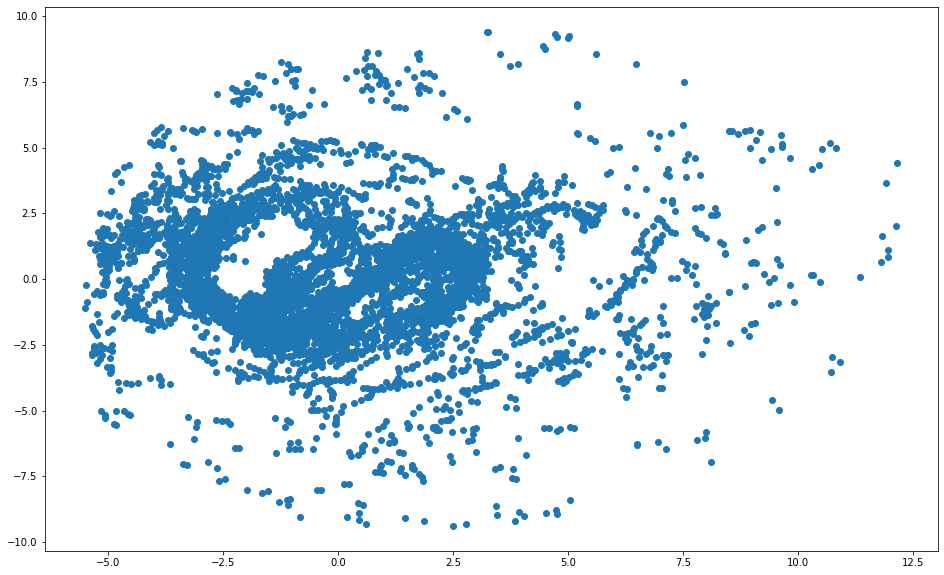

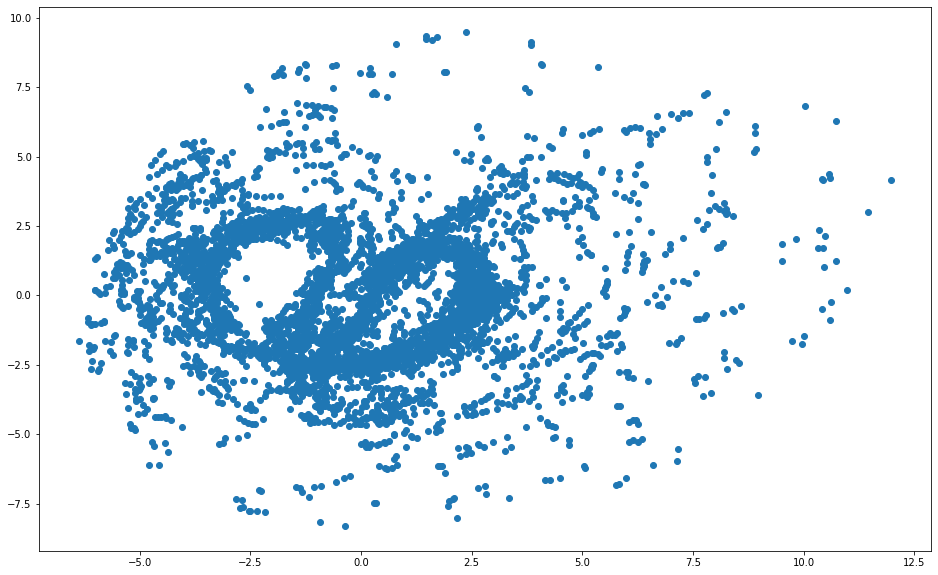

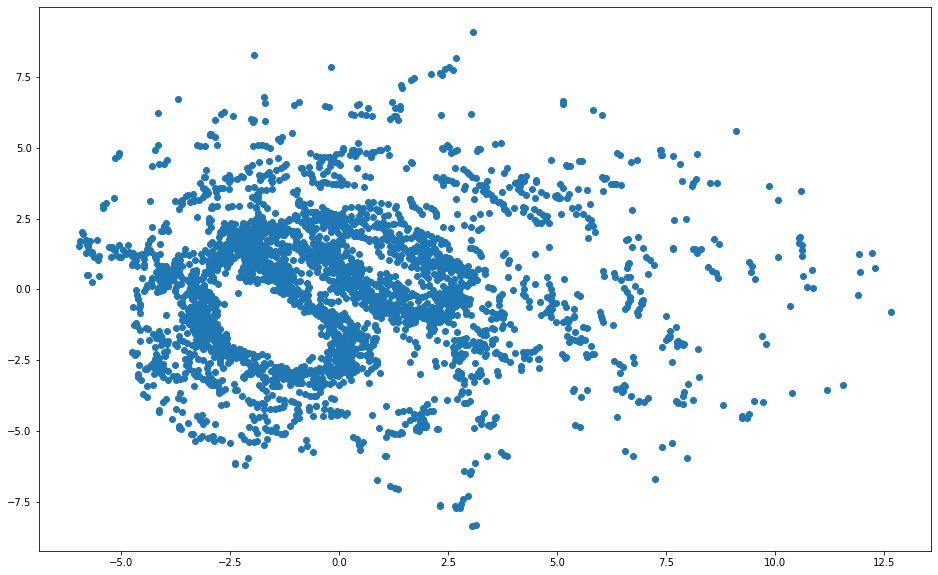

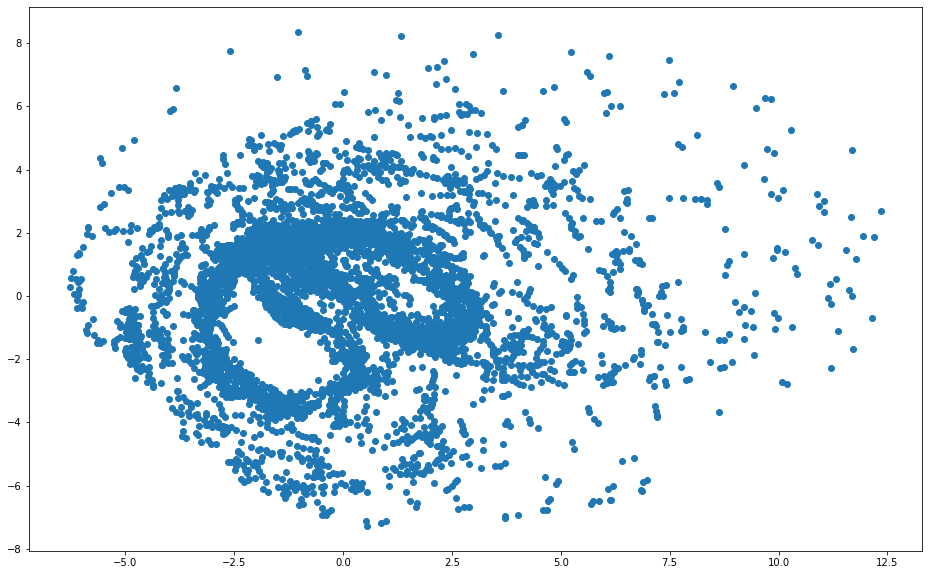

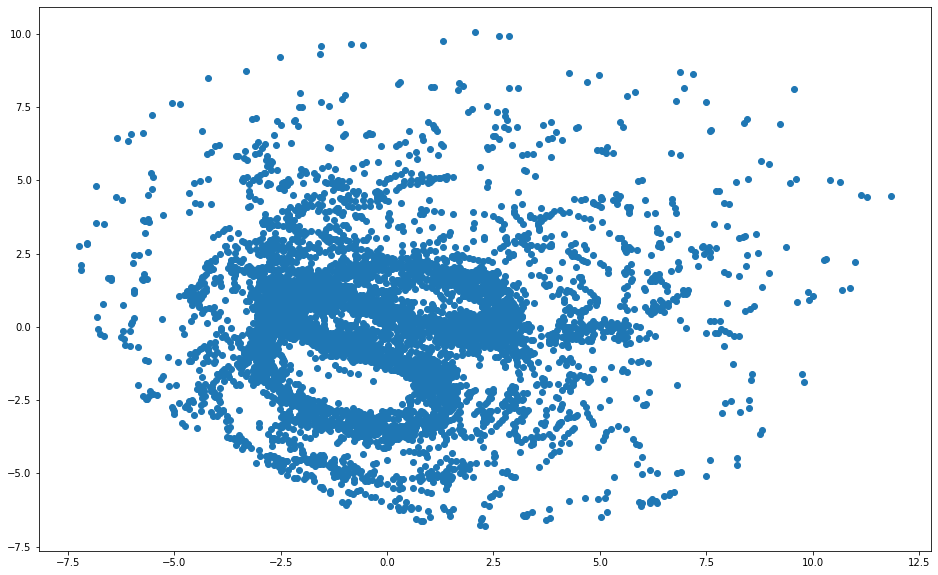

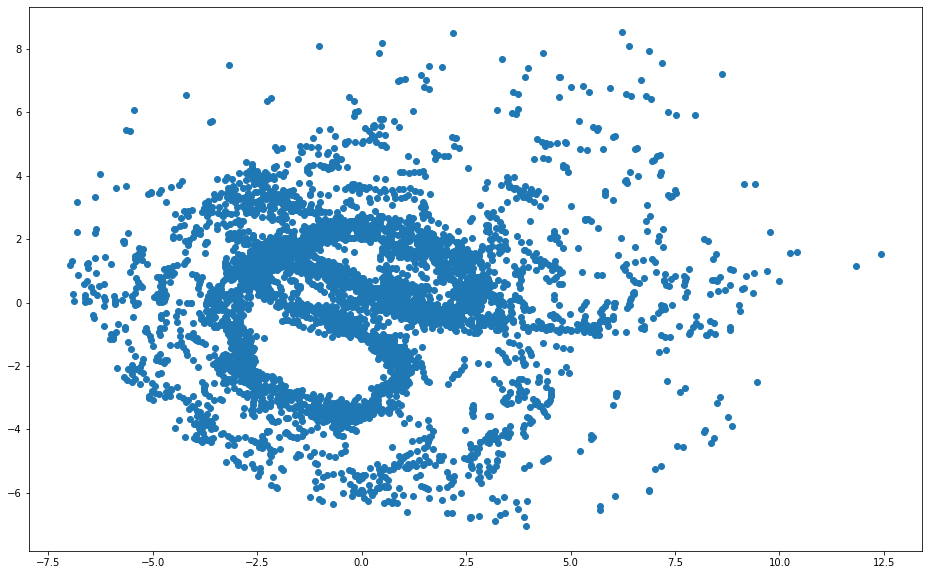

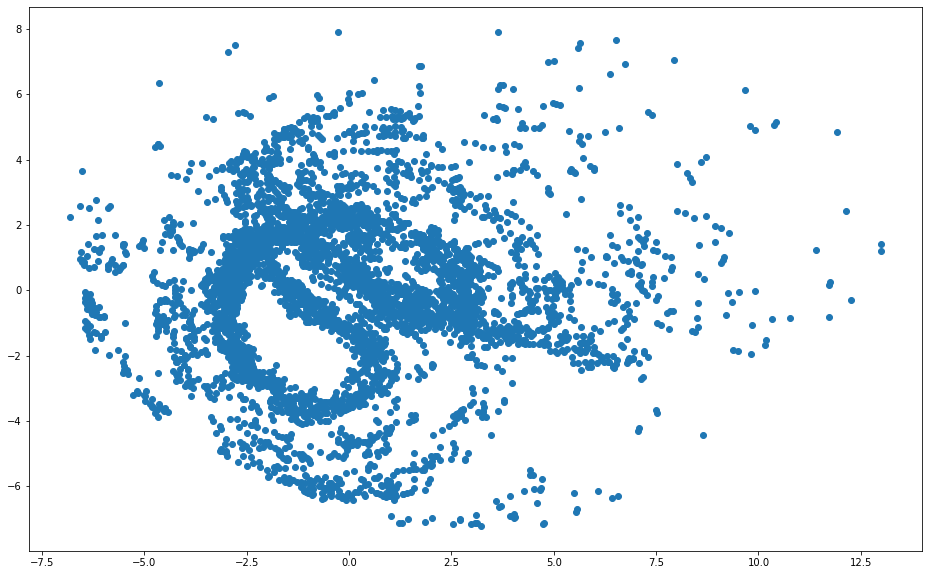

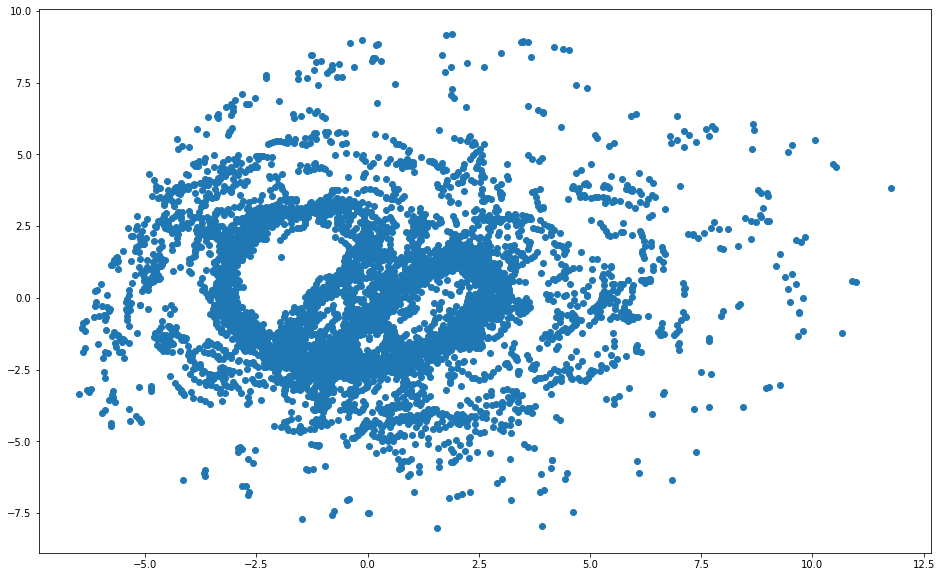

In [63]:
model.eval()
correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0

for batch in test_loader:
        data = batch.to(device)
        emb_feats = model(data)
        
        e = radius_graph(emb_feats, r=1, batch=batch.batch, loop=False, max_num_neighbors=5000)
        print(e.shape)
        
        embedded = emb_feats.cpu().detach().numpy()
#         print("Embedded", embedded)
        pca = PCA(n_components=2)
        pca_result = pca.fit_transform(embedded)
        #         print("PCA", pca_result)
        plt.figure(figsize=(16,10))
        plt.scatter(pca_result[:,0], pca_result[:,1])
        
        reference = emb_feats.index_select(0, e[1])
        neighbors = emb_feats.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        print(len(y))
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1 
#         print(y)
#         print(hinge)
        
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs['margin'])
        print("Loss:", loss.item())
        total_loss += loss.item()
        
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        true = (counts * (counts -1)).sum()
        
        true_positive = (y.float()).sum().item()
        positive = len(e[0])
        
#         true_positive += (true & positive).sum().item()
        
        total_positive += max(positive, 1)
        total_true += true
        correct += true_positive
        
        
        print("True positive:", true_positive, "Positive", positive, "True", true)

acc = correct / total_positive
eff = correct / total_true
print("Accuracy:", acc, "Efficiency:", eff)


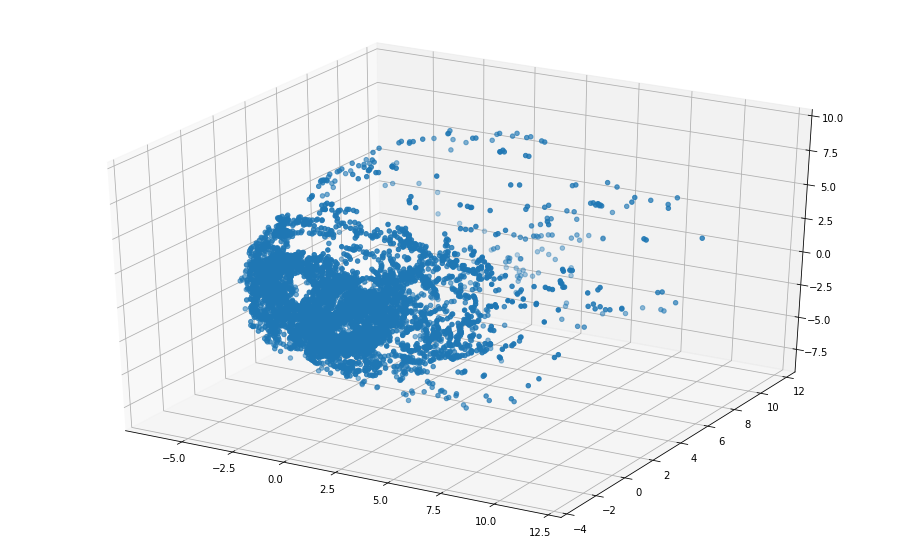

In [64]:
from mpl_toolkits.mplot3d import Axes3D
embedded = emb_feats.cpu().detach().numpy()
#         print("Embedded", embedded)
pca = PCA(n_components=3)
px = pca.fit_transform(embedded)
#         print("PCA", pca_result)
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(px[:,0], px[:,2], px[:,1])

In [65]:
P = batch.pid.unique()[0]

In [66]:
Pmask = (batch.pid == P).cpu()
x = batch.x.cpu()

In [67]:
Pmask

tensor([ True,  True,  True,  ..., False, False, False])

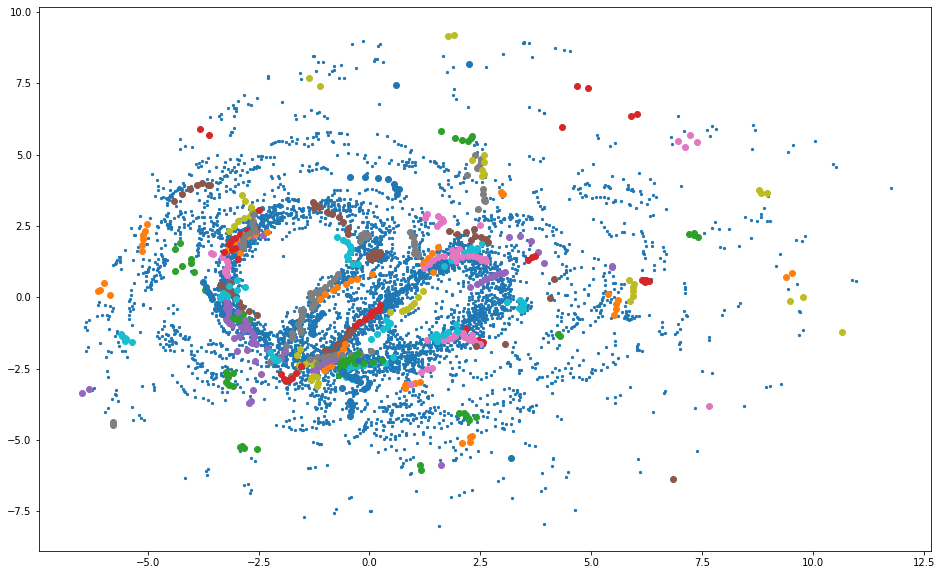

In [68]:
plt.figure(figsize=(16,10))
plt.scatter(px[:,0], px[:,1], s=5)
for P in batch.pid.unique()[::10]:
    Pmask = (batch.pid == P).cpu()
    plt.scatter(px[Pmask,0], px[Pmask,1])

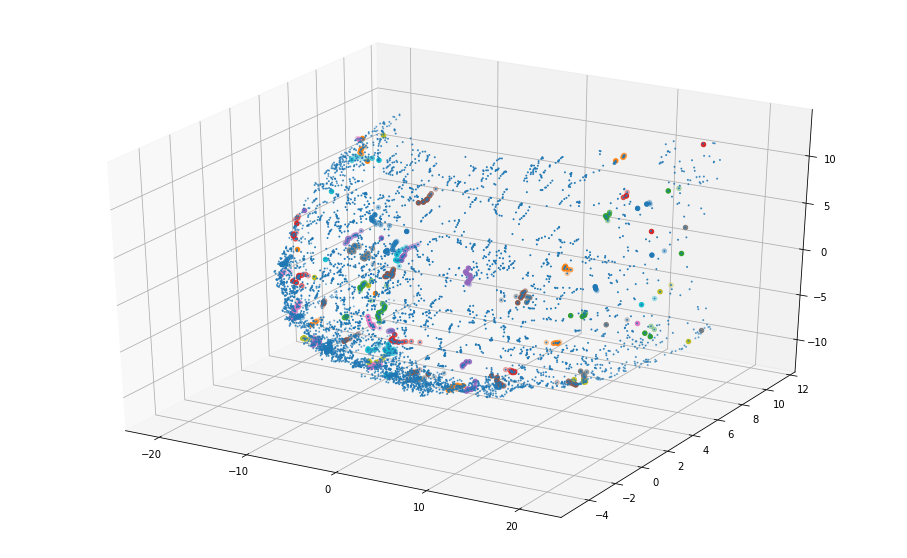

In [125]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(px[:,0], px[:,2], px[:,1], s=1)
for P in batch.pid.unique()[::10]:
    Pmask = (batch.pid == P).cpu()
    ax.scatter(px[Pmask,0], px[Pmask,2], px[Pmask,1])

# Edge Classification

## Vanilla Embedding -> AGNN

### Prepare Edges from Embedding

In [260]:
m_configs = {"in_channels": 3, "nb_hidden": 256, "nb_layer": 4, "emb_dim": 8}
other_configs = {"k": 20, "r_train": 1, "r_val": 0.2, "margin": 1, 'reduction':'sum'}
model = Embedding(**m_configs).to(device)
m_configs.update(other_configs)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)

checkpoint = torch.load('model_comparisons/embedding/apricot-paper-162.tar')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

In [30]:
def prepare_event(batch, r):
    model.eval()
    data = batch.to(device)
    emb_feats = model(data)
        
    e = radius_graph(emb_feats, r=r, batch=batch.batch, loop=False)
    
    data = Data(x = data.x, emb = emb_feats, pid = data.pid, e = e)
    return data

In [31]:
gnn_train_dataset = [prepare_event(batch, r=1.25) for batch in train_loader]
gnn_test_dataset = [prepare_event(batch, r=1.25) for batch in test_loader]

In [32]:
gnn_train_loader = DataLoader(gnn_train_dataset, batch_size=1, shuffle=True)
gnn_test_loader = DataLoader(gnn_test_dataset, batch_size=1, shuffle=True)

### Train

In [33]:
class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation='Tanh',
                 layer_norm=True):
        super(EdgeNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim, hidden_dim, hidden_dim, 1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)

class NodeNetwork(nn.Module):
    """
    A module which computes new node features on the graph.
    For each node, it aggregates the neighbor node features
    (separately on the input and output side), and combines
    them with the node's previous features in a fully-connected
    network to compute the new features.
    """
    def __init__(self, input_dim, output_dim, hidden_activation='Tanh',
                 layer_norm=True):
        super(NodeNetwork, self).__init__()
        self.network = make_mlp(input_dim*3, [output_dim]*4,
                                hidden_activation=hidden_activation,
                                output_activation=hidden_activation,
                                layer_norm=layer_norm)

    def forward(self, x, e, edge_index):
        start, end = edge_index
        # Aggregate edge-weighted incoming/outgoing features
        mi = scatter_add(e[:, None] * x[start], end, dim=0, dim_size=x.shape[0])
        mo = scatter_add(e[:, None] * x[end], start, dim=0, dim_size=x.shape[0])
        node_inputs = torch.cat([mi, mo, x], dim=1)
        return self.network(node_inputs)

class ResAGNN(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(ResAGNN, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(in_channels + hidden_dim, in_channels + hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(in_channels + hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
        edge_index = inputs.e
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            x_inital = x
            
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)  
            
            x = x_inital + x
        
        return self.edge_network(x, edge_index)

In [34]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(gnn_train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred = model(data)
              
        y = batch.pid[batch.e[0]] == batch.pid[batch.e[1]]
                
        loss = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(weight))
        
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total += len(pred)
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    
    for batch in gnn_test_loader:
        data = batch.to(device)
        pred = model(data)
              
        y = batch.pid[batch.e[0]] == batch.pid[batch.e[1]]
                
        loss = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(weight))
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        true_positive += (true & positive).sum().item()
        total_positive += max(positive.sum().item(), 1)
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total_true += max(true.sum().item(), 1)
        
        print("True positive:", (true & positive).sum().item(), "True:", true.sum().item(), "Positive", positive.sum().item())
        
        total += len(pred)

    acc = correct/total
    eff = (true_positive / total_true)
    pur = (true_positive / total_positive)
        
    return acc, eff, pur, total_loss

In [73]:
m_configs = {"in_channels": 3, "hidden_dim": 16, "n_graph_iters": 6}
model = ResAGNN(**m_configs).to(device)
model_name = wandb.init(project="GravNet", group="ResAGNN", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)
ep = 0

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [74]:
weight = 2
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    acc, train_loss = train(model, train_loader, optimizer)
    print("Training loss:", train_loss)

    model.eval()
    acc, eff, pur, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "val_acc": acc, "val_pur": pur, "val_eff": eff, "lr": scheduler._last_lr[0]})

    save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'ResAGNN/'+model_name._name+'.tar')

    print('Epoch: {}, Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, acc, pur, eff, val_loss, scheduler._last_lr[0], tt()-tic))

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Training loss: 55.331300646066666
True positive: 5613 True: 19979 Positive 11829
True positive: 5581 True: 19127 Positive 11506
True positive: 5434 True: 19002 Positive 11320
True positive: 6141 True: 21977 Positive 12394
True positive: 6009 True: 21619 Positive 12537
True positive: 6347 True: 22379 Positive 12201
True positive: 5703 True: 20217 Positive 11707
True positive: 5687 True: 20107 Positive 11605
True positive: 5881 True: 20526 Positive 12046
True positive: 6276 True: 21745 Positive 12511
Epoch: 1, Accuracy: 0.8705, Purity: 0.4903, Efficiency: 0.2839, Loss: 4.7337, LR: 0.001 in time 16.377009391784668
Training loss: 42.48297584056854
True positive: 10565 True: 20526 Positive 21147
True positive: 11388 True: 22379 Positive 21867
True positive: 11083 True: 20217 Positive 22541
True positive: 11660 True: 21745 Positive 21926
True positive: 10806 True: 21977 Positive 21805
True positive: 10352 True: 19127 Positive 21394
True positive: 10973 True: 19979 Positive 21713
True positiv

True positive: 14788 True: 20526 Positive 24973
True positive: 13304 True: 19002 Positive 23102
True positive: 14369 True: 20107 Positive 24702
Epoch: 14, Accuracy: 0.8988, Purity: 0.5866, Efficiency: 0.7099, Loss: 2.9243, LR: 0.001 in time 15.720081329345703
Training loss: 29.235501259565353
True positive: 14609 True: 21619 Positive 24539
True positive: 13406 True: 19979 Positive 21917
True positive: 12628 True: 19002 Positive 21290
True positive: 13783 True: 20217 Positive 22867
True positive: 13892 True: 20107 Positive 22980
True positive: 15159 True: 21745 Positive 23842
True positive: 15293 True: 22379 Positive 24801
True positive: 14084 True: 20526 Positive 22911
True positive: 14651 True: 21977 Positive 24438
True positive: 13045 True: 19127 Positive 21276
Epoch: 15, Accuracy: 0.9031, Purity: 0.6088, Efficiency: 0.6800, Loss: 2.9184, LR: 0.001 in time 15.71786642074585
Training loss: 28.912230879068375
True positive: 15546 True: 21977 Positive 27369
True positive: 15016 True: 20

Training loss: 17.20769837498665
True positive: 17360 True: 20526 Positive 23869
True positive: 16302 True: 19127 Positive 21916
True positive: 18592 True: 21977 Positive 25380
True positive: 17250 True: 20107 Positive 23123
True positive: 17096 True: 20217 Positive 22818
True positive: 15783 True: 19002 Positive 21934
True positive: 18381 True: 21619 Positive 24600
True positive: 18844 True: 22379 Positive 25150
True positive: 16525 True: 19979 Positive 22453
True positive: 18706 True: 21745 Positive 23942
Epoch: 28, Accuracy: 0.9429, Purity: 0.7434, Efficiency: 0.8459, Loss: 1.7181, LR: 0.001 in time 15.718676090240479
Training loss: 17.026810005307198
True positive: 18840 True: 21977 Positive 26028
True positive: 16610 True: 19979 Positive 22819
True positive: 17473 True: 20107 Positive 23572
True positive: 16513 True: 19127 Positive 22409
True positive: 18595 True: 21619 Positive 25217
True positive: 19068 True: 22379 Positive 25903
True positive: 17551 True: 20526 Positive 24364
T

True positive: 17894 True: 20107 Positive 22554
True positive: 18036 True: 20526 Positive 23206
True positive: 19703 True: 21977 Positive 25207
Epoch: 41, Accuracy: 0.9549, Purity: 0.7888, Efficiency: 0.8846, Loss: 1.4258, LR: 0.001 in time 15.837759017944336
Training loss: 13.73565798252821
True positive: 17819 True: 19979 Positive 23193
True positive: 18357 True: 20217 Positive 23331
True positive: 19952 True: 22379 Positive 25444
True positive: 18088 True: 20107 Positive 23090
True positive: 19555 True: 21619 Positive 25156
True positive: 17310 True: 19127 Positive 22140
True positive: 19989 True: 21977 Positive 26041
True positive: 16931 True: 19002 Positive 22254
True positive: 18524 True: 20526 Positive 23977
True positive: 19977 True: 21745 Positive 24569
Epoch: 42, Accuracy: 0.9548, Purity: 0.7797, Efficiency: 0.9024, Loss: 1.3876, LR: 0.001 in time 15.717335939407349
Training loss: 13.222155533730984
True positive: 19342 True: 21619 Positive 25108
True positive: 17696 True: 19

Training loss: 11.890252247452736
True positive: 19989 True: 21977 Positive 24807
True positive: 19354 True: 21619 Positive 23971
True positive: 20087 True: 22379 Positive 24664
True positive: 18022 True: 20107 Positive 22190
True positive: 17265 True: 19127 Positive 21085
True positive: 19879 True: 21745 Positive 23515
True positive: 18414 True: 20217 Positive 22228
True positive: 17726 True: 19979 Positive 21842
True positive: 16945 True: 19002 Positive 21145
True positive: 18536 True: 20526 Positive 22884
Epoch: 55, Accuracy: 0.9612, Purity: 0.8156, Efficiency: 0.9010, Loss: 1.2451, LR: 0.001 in time 15.74934720993042
Training loss: 12.003710865974426
True positive: 17525 True: 19127 Positive 21776
True positive: 20160 True: 21745 Positive 24160
True positive: 20302 True: 22379 Positive 25458
True positive: 19746 True: 21619 Positive 24632
True positive: 17825 True: 19979 Positive 22471
True positive: 18339 True: 20107 Positive 23011
True positive: 18652 True: 20217 Positive 22925
T

True positive: 17156 True: 19002 Positive 22071
True positive: 20609 True: 22379 Positive 25770
True positive: 20174 True: 21619 Positive 25216
Epoch: 68, Accuracy: 0.9609, Purity: 0.7994, Efficiency: 0.9277, Loss: 1.1766, LR: 0.001 in time 15.761155843734741
Training loss: 11.281046763062477
True positive: 18356 True: 19979 Positive 23016
True positive: 17756 True: 19127 Positive 21942
True positive: 20110 True: 21619 Positive 24766
True positive: 18999 True: 20526 Positive 23914
True positive: 19020 True: 20217 Positive 23189
True positive: 18668 True: 20107 Positive 23472
True positive: 20509 True: 21745 Positive 24417
True positive: 20824 True: 22379 Positive 25946
True positive: 17444 True: 19002 Positive 22041
True positive: 20585 True: 21977 Positive 25924
Epoch: 69, Accuracy: 0.9623, Purity: 0.8057, Efficiency: 0.9303, Loss: 1.1457, LR: 0.001 in time 15.749531030654907
Training loss: 11.308229811489582
True positive: 20467 True: 21977 Positive 25557
True positive: 18988 True: 2

True positive: 17864 True: 19127 Positive 21559
True positive: 20529 True: 21977 Positive 25228
True positive: 19051 True: 20526 Positive 23277
Epoch: 81, Accuracy: 0.9660, Purity: 0.8260, Efficiency: 0.9305, Loss: 1.0631, LR: 0.0003 in time 15.791092157363892
Training loss: 10.253109708428383
True positive: 20248 True: 21619 Positive 24390
True positive: 17318 True: 19002 Positive 21380
True positive: 17813 True: 19127 Positive 21268
True positive: 20468 True: 21977 Positive 24905
True positive: 18670 True: 20107 Positive 22472
True positive: 19133 True: 20526 Positive 23306
True positive: 18908 True: 20217 Positive 22473
True positive: 18277 True: 19979 Positive 22146
True positive: 20357 True: 21745 Positive 23539
True positive: 20741 True: 22379 Positive 24835
Epoch: 82, Accuracy: 0.9668, Purity: 0.8319, Efficiency: 0.9287, Loss: 1.0542, LR: 0.0003 in time 15.737584829330444
Training loss: 10.142140120267868
True positive: 18135 True: 19979 Positive 21810
True positive: 18669 True:

True positive: 20606 True: 21977 Positive 24963
True positive: 18990 True: 20217 Positive 22460
True positive: 17432 True: 19002 Positive 21312
Epoch: 94, Accuracy: 0.9674, Purity: 0.8339, Efficiency: 0.9308, Loss: 1.0291, LR: 0.0003 in time 15.75835108757019
Training loss: 9.962164878845215
True positive: 20537 True: 21745 Positive 23686
True positive: 18363 True: 19979 Positive 22283
True positive: 20464 True: 21977 Positive 24977
True positive: 19110 True: 20526 Positive 23152
True positive: 19014 True: 20217 Positive 22552
True positive: 20873 True: 22379 Positive 24914
True positive: 18773 True: 20107 Positive 22572
True positive: 17901 True: 19127 Positive 21311
True positive: 17435 True: 19002 Positive 21435
True positive: 20216 True: 21619 Positive 24492
Epoch: 95, Accuracy: 0.9674, Purity: 0.8328, Efficiency: 0.9323, Loss: 1.0344, LR: 0.0003 in time 15.728857278823853
Training loss: 9.979585446417332
True positive: 18882 True: 20217 Positive 22147
True positive: 18725 True: 20

In [75]:
model.eval()

s_min, s_max, s_step = 0., 1.0, 0.01
true_positive, total_positive, total_true = np.zeros(int(np.ceil((s_max - s_min)/s_step)), dtype=np.float), np.zeros(int(np.ceil((s_max - s_min)/s_step)), dtype=np.float), np.zeros(int(np.ceil((s_max - s_min)/s_step)), dtype=np.float)



for batch in gnn_test_loader:
    data = batch.to(device)
    pred = model(data)

    y = batch.pid[batch.e[0]] == batch.pid[batch.e[1]]
                
    for (i, s) in enumerate(np.arange(s_min, s_max, s_step)):
        true, false = y.float() > 0.5, y.float() < 0.5
#         print(true.sum())
        positive, negative = sig(pred) > s, sig(pred) < s
        true_positive[i] += (true & positive).sum().item()
        total_positive[i] += max(positive.sum().item(), 1)
        
        total_true[i] += max(true.sum().item(), 1)
        
    
pur, eff = true_positive/total_positive, true_positive/total_true

In [76]:
pur, eff

(array([0.12807685, 0.47999553, 0.53781964, 0.57212926, 0.59605495,
        0.61481484, 0.62981456, 0.64224305, 0.65296693, 0.66249357,
        0.67091239, 0.67858376, 0.68594128, 0.69255634, 0.69883374,
        0.70471986, 0.710175  , 0.71573055, 0.72057407, 0.72550312,
        0.73033493, 0.73477954, 0.73904444, 0.74318608, 0.74729041,
        0.7514122 , 0.7551243 , 0.75891846, 0.76274156, 0.76636757,
        0.77010976, 0.77349723, 0.77693424, 0.78045038, 0.7838272 ,
        0.78704398, 0.79023243, 0.79322569, 0.7963564 , 0.79931664,
        0.80214831, 0.80525277, 0.80825151, 0.81116784, 0.81401613,
        0.81672128, 0.81980493, 0.82255577, 0.82524929, 0.82798527,
        0.83086107, 0.83371016, 0.83642247, 0.83923003, 0.84190178,
        0.8446267 , 0.84743301, 0.85000605, 0.85279522, 0.85559737,
        0.85839016, 0.86114005, 0.86392274, 0.86685514, 0.86958984,
        0.87229221, 0.87513638, 0.87819083, 0.8812149 , 0.88426429,
        0.8872029 , 0.89033428, 0.89343053, 0.89

Text(0.5, 0.95, 'AUC: 0.8248')

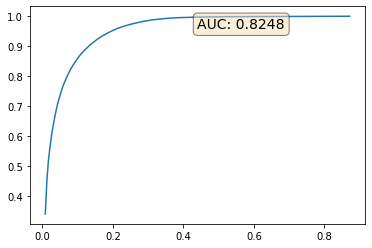

In [77]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-pur[0:], eff[0:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-pur[0:], eff[0:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

Loss 1: 0.14336581528186798 Loss 2: 0.3064906895160675
EDGES: True positive: 25201 True: 26857 Positive 30730
CLUSTER: True positive: 33176.0 True: 36058 Positive: 61648
Loss 1: 0.14070658385753632 Loss 2: 0.3249930441379547
EDGES: True positive: 27735 True: 29581 Positive 35110
CLUSTER: True positive: 41900.0 True: 46360 Positive: 93290
Loss 1: 0.14094644784927368 Loss 2: 0.33543920516967773
EDGES: True positive: 27280 True: 28939 Positive 34610
CLUSTER: True positive: 41778.0 True: 45206 Positive: 100642
Loss 1: 0.14366789162158966 Loss 2: 0.3064197301864624
EDGES: True positive: 25222 True: 26782 Positive 30157
CLUSTER: True positive: 32600.0 True: 35970 Positive: 64178
Loss 1: 0.1434793919324875 Loss 2: 0.32687410712242126
EDGES: True positive: 26305 True: 28382 Positive 33215
CLUSTER: True positive: 40084.0 True: 44324 Positive: 92570
Loss 1: 0.1373339146375656 Loss 2: 0.3147062361240387
EDGES: True positive: 26290 True: 28063 Positive 32315
CLUSTER: True positive: 36684.0 True: 4

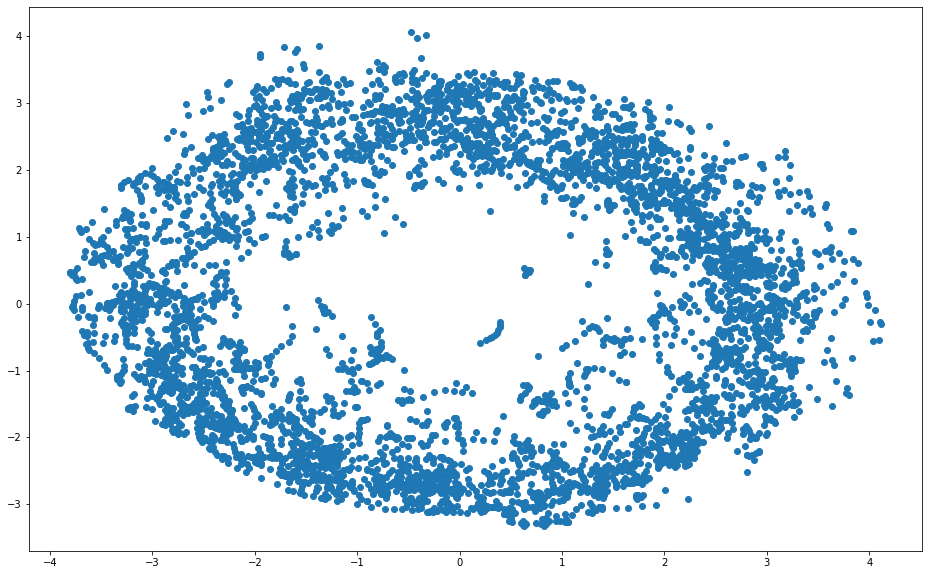

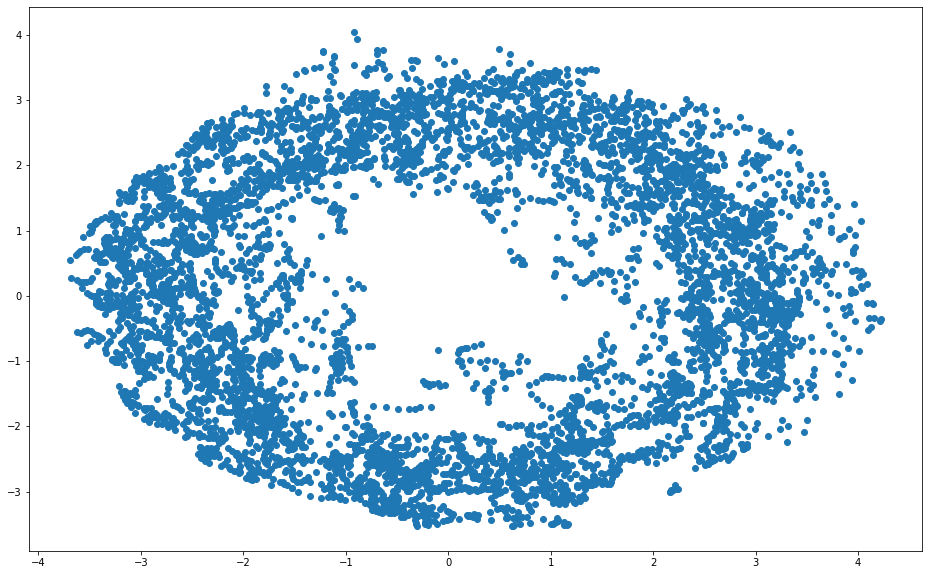

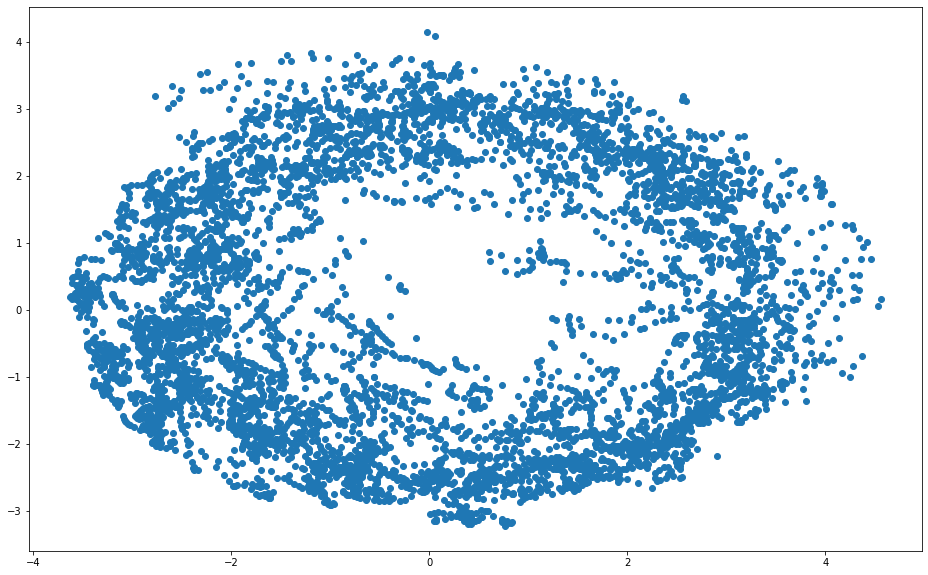

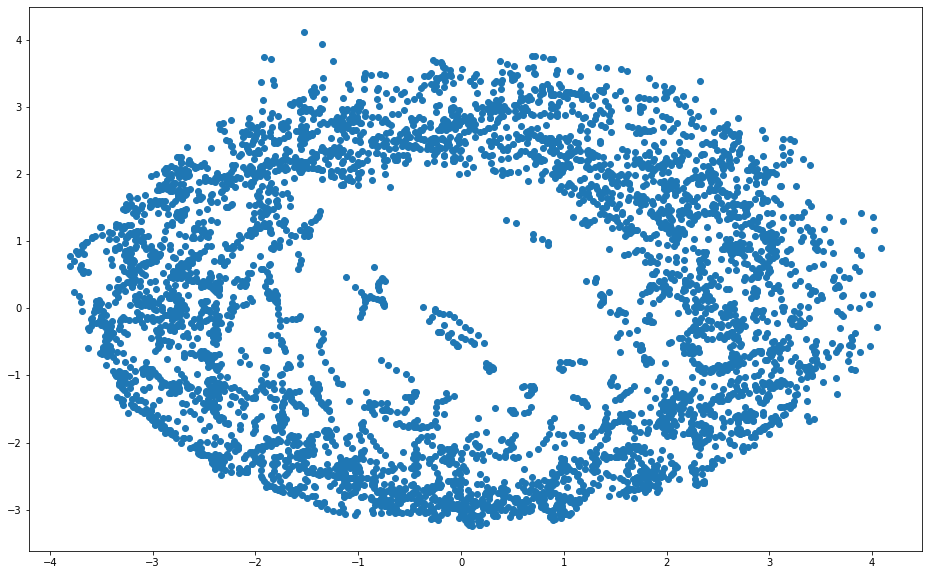

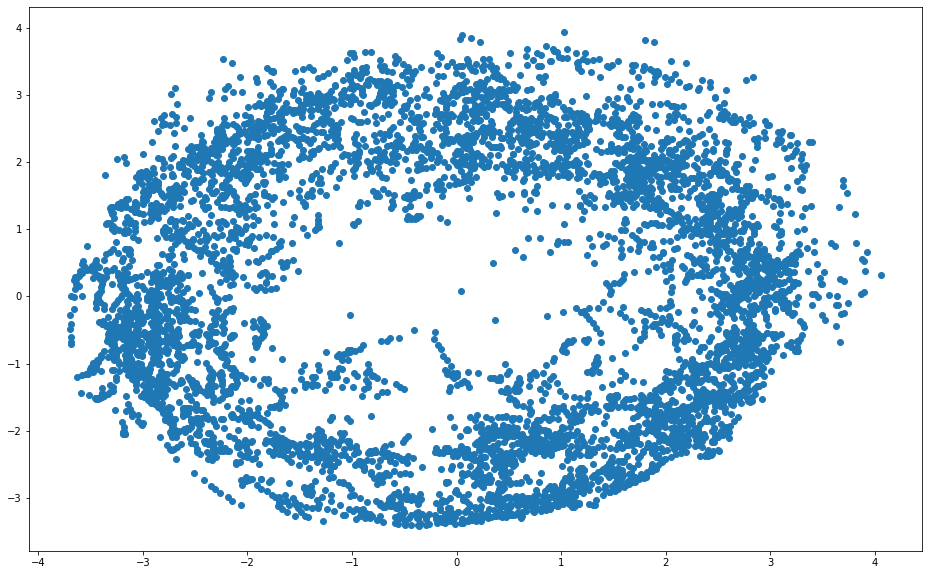

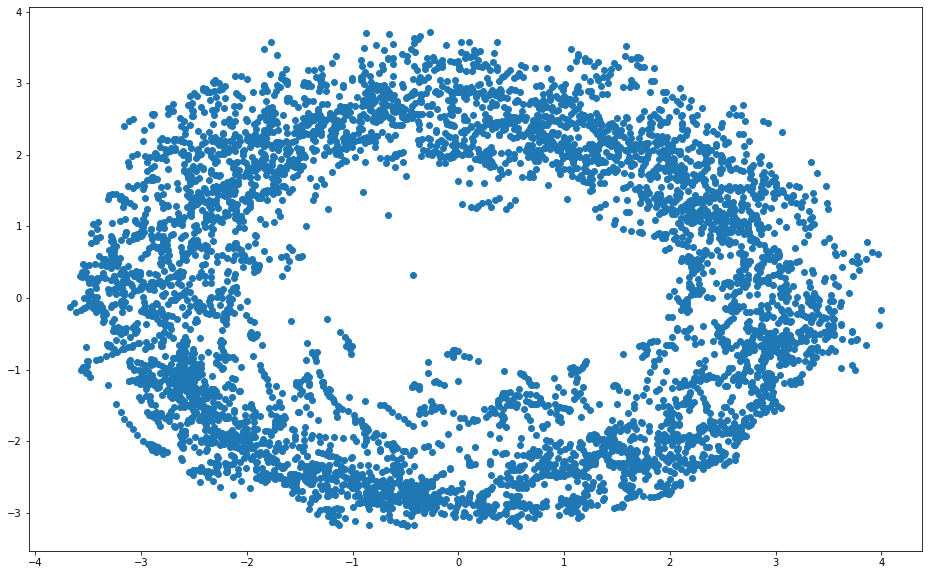

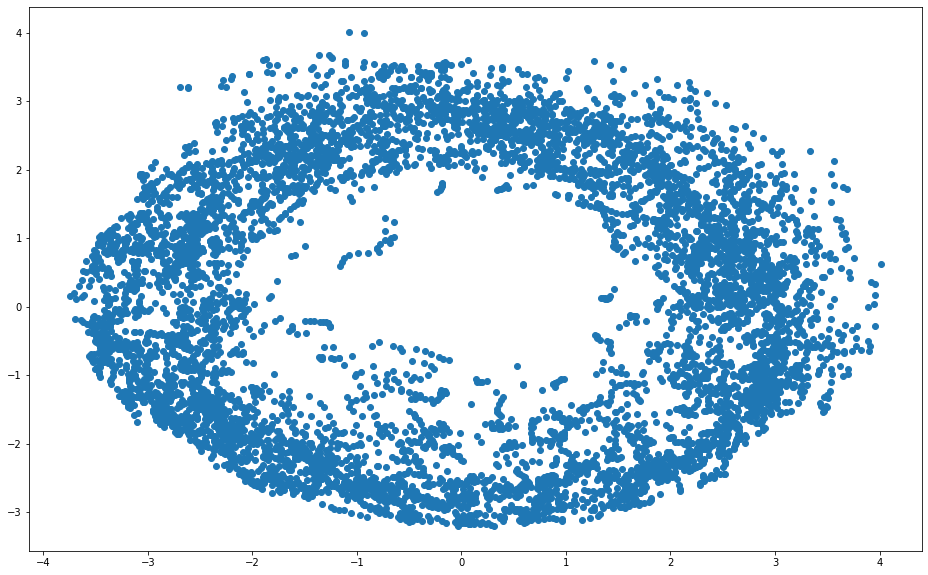

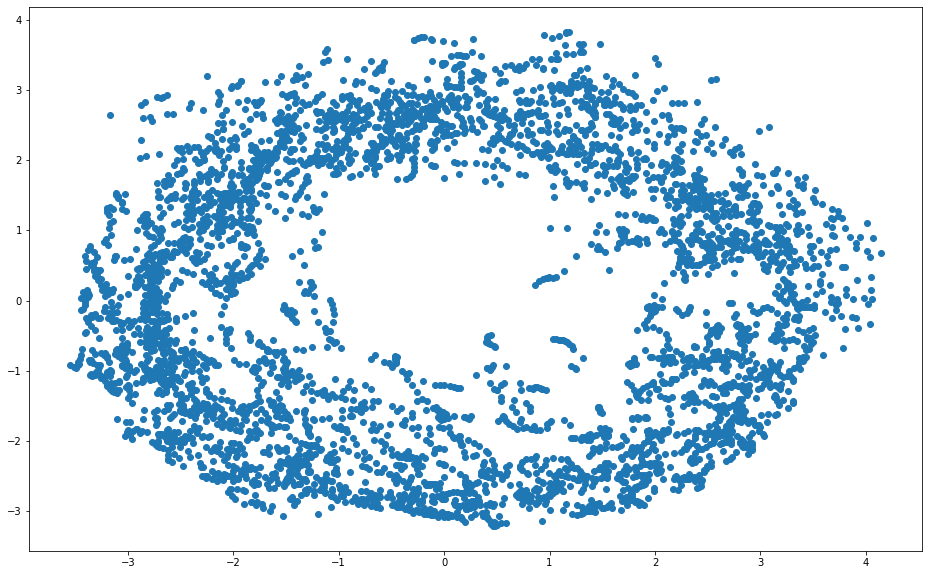

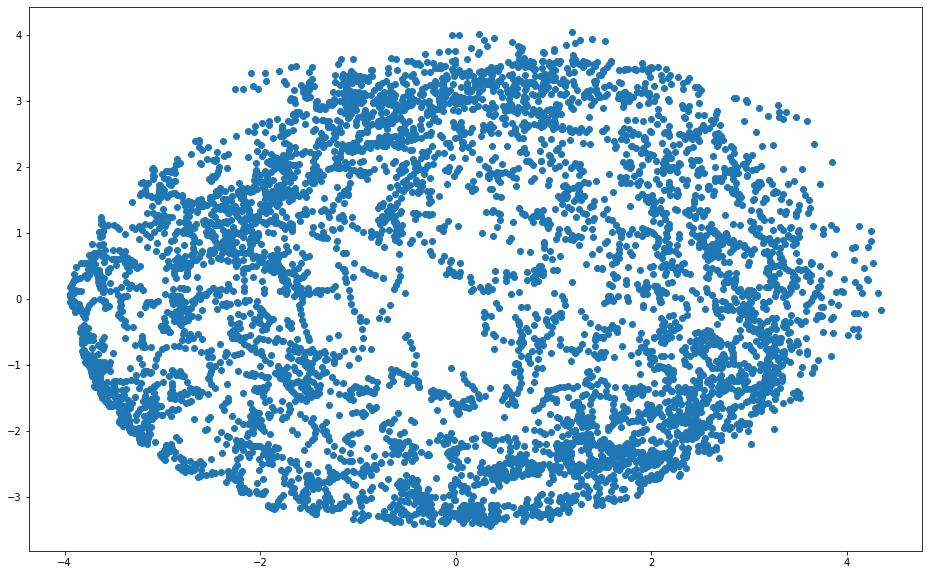

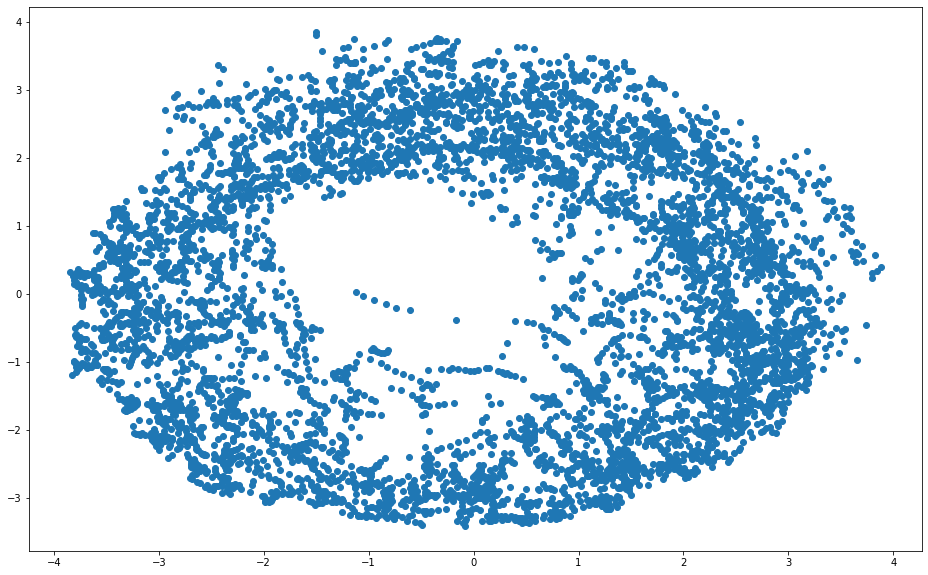

In [33]:
model.eval()
edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

for batch in test_loader:
    data = batch.to(device)
    pred, spatial, e = model(data)

    e_spatial = radius_graph(spatial, r=1, batch=batch.batch, loop=False, max_num_neighbors=1000)

    reference = spatial.index_select(0, e_spatial[1])
    neighbors = spatial.index_select(0, e_spatial[0])

    d = torch.sum((reference - neighbors)**2, dim=-1)

    y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
    y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
    
    
    hinge = y_cluster.float()
    hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  
    
    loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
    loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
    print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
    
    embedded = spatial.cpu().detach().numpy()    
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(embedded)
    #         print("PCA", pca_result)
    plt.figure(figsize=(16,10))
    plt.scatter(pca_result[:,0], pca_result[:,1])

    #Cluster performance
    batch_cpu = batch.pid.cpu()
    pids, counts = np.unique(batch_cpu, return_counts=True)
    cluster_true = (counts * (counts - 1)).sum()

    cluster_true_positive = (y_cluster.float()).sum().item()
    cluster_total_true_positive += cluster_true_positive
    
    cluster_positive = len(e_spatial[0])
    cluster_total_positive += max(cluster_positive, 1)

    cluster_total_true += cluster_true
    
    #Edge performance
    edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
    edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

    edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

    edge_true_positive += (edge_true & edge_positive).sum().item()
    edge_total_true += edge_true.sum().item()
    edge_total_positive += edge_positive.sum().item()

    print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
    print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)
    
    total += len(pred)

edge_acc = edge_correct/total
edge_eff = (edge_true_positive / edge_total_true)
edge_pur = (edge_true_positive / edge_total_positive)

cluster_eff = (cluster_total_true_positive / cluster_total_true)
cluster_pur = (cluster_total_true_positive / cluster_total_positive)

print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))

## EmbFilter

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class Embedding(torch.nn.Module):
    def __init__(self, in_channels, nb_hidden, nb_layer, emb_dim=3):
        super(Embedding, self).__init__()
        layers = [Linear(in_channels, nb_hidden)]
        ln = [Linear(nb_hidden, nb_hidden) for _ in range(nb_layer-1)]
        layers.extend(ln)
        self.layers = nn.ModuleList(layers)
        self.emb_layer = nn.Linear(nb_hidden, emb_dim)
        self.norm = torch.nn.LayerNorm(nb_hidden)
        self.act = nn.Tanh()
        # self.dropout = nn.Dropout(p=0.7)
#         self.mean = torch.FloatTensor(mean).to(torch.float)
#         self.std = torch.FloatTensor(std).to(torch.float)

    def forward(self, x):
#         hits = self.normalize(hits)
        for l in self.layers:
            x = l(x)
            x = self.act(x)
            # hits = self.dropout(hits)
        x = self.norm(x) #Option of LayerNorm
        x = self.emb_layer(x)
        return x

    def normalize(self, hits):
        try:
            hits = (hits-self.mean) / (self.std + 10**-9)
        except:
            self.mean = self.mean.to(device=hits.device)
            self.std  = self.std.to(device=hits.device)
            hits = (hits-self.mean) / (self.std + 10**-9)
        return hits

class FilterNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation='Tanh',
                 layer_norm=True):
        super(FilterNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim, hidden_dim, hidden_dim, 1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)


In [23]:
class EmbFilter(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, emb_hidden=32, nb_layer=4, emb_dim=8, r=0.2, k=20, hidden_dim=8,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(EmbFilter, self).__init__()
        self.r = r
        self.k = k
        # Setup the input network
        self.filter_network = FilterNetwork(in_channels + emb_dim, hidden_dim, hidden_activation, layer_norm)
        # Setup gravnet
        self.emb_network = Embedding(in_channels, emb_hidden, nb_layer, emb_dim)
        
#         self.spatial_norm = torch.nn.LayerNorm(emb_dim)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""        
        x = inputs.x
#         print(x.shape)
        x = self.emb_network(x)
        
        edge_index = radius_graph(x, r=self.r, batch=inputs.batch, loop=False, max_num_neighbors=200)
        
        # Apply filter network
        e = self.filter_network(torch.cat([x, inputs.x], axis=-1), edge_index)
                
        return e, x, edge_index

In [106]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
                
#         e_spatial = radius_graph(spatial, r=m_configs["r_train"], batch=batch.batch, loop=False, max_num_neighbors=1000)
        e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"])
#         print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        loss = loss_1 + loss_2
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        
        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive 
        
        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()
        total += len(pred)

    edge_acc = edge_correct/total
    cluster_pur = (cluster_total_true_positive / cluster_total_positive)
    
    return edge_acc, cluster_pur, total_loss

def evaluate(model, test_loader):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)
        
#         e_spatial = radius_graph(spatial, r=m_configs["r_val"], batch=batch.batch, loop=False, max_num_neighbors=1000)
        e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())

        loss = loss_1.item() + loss_2.item()
        total_loss += loss
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

        #Edge performance
        edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
        edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

        edge_true_positive += (edge_true & edge_positive).sum().item()
        edge_total_true += edge_true.sum().item()
        edge_total_positive += edge_positive.sum().item()

        print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
        print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)

        total += len(pred)

    edge_acc = edge_correct/total
    edge_eff = (edge_true_positive / max(edge_total_true, 1))
    edge_pur = (edge_true_positive / max(edge_total_positive, 1))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

    print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
    print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, total_loss

In [30]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
    
                # Get true edge list
        records_array = batch.pid.cpu()
        idx_sort = np.argsort(records_array)
        sorted_records_array = records_array[idx_sort]
        _, idx_start, _ = np.unique(sorted_records_array, return_counts=True,
                                return_index=True)

        # sets of indices
        res = np.split(idx_sort, idx_start[1:])
        true_list = torch.cat([torch.tensor(list(permutations(i, r=2))) for i in res if len(list(permutations(i, r=2))) > 0])
        
        # Get fake edge list
        candidates = radius_graph(spatial, r=m_configs["r_train"], batch=batch.batch, loop=False, max_num_neighbors=200)
        fake_list = candidates[:,batch.pid[candidates[0]] != batch.pid[candidates[1]]]
        
        # Concatenate all candidates
        e_spatial = torch.cat([fake_list, true_list.T.to(device)], axis=-1)
    
        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        loss = loss_1 + loss_2
#         print(loss)
        total_loss += loss.item()
        loss.backward()
        optimizer.step()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        
        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive 
        
        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()
        total += len(pred)

    edge_acc = edge_correct/total
    cluster_pur = (cluster_total_true_positive / cluster_total_positive)
    
    return edge_acc, cluster_pur, total_loss

def evaluate(model, test_loader):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        e_spatial = radius_graph(spatial, r=m_configs["r_val"], batch=batch.batch, loop=False, max_num_neighbors=1000)
#         e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)
        
#         e_spatial = e
        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())

        loss = loss_1.item() + loss_2.item()
        total_loss += loss
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

        #Edge performance
        edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
        edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

        edge_true_positive += (edge_true & edge_positive).sum().item()
        edge_total_true += edge_true.sum().item()
        edge_total_positive += edge_positive.sum().item()

        print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
        print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)

        total += len(pred)

    edge_acc = edge_correct/total
    edge_eff = (edge_true_positive / max(edge_total_true, 1))
    edge_pur = (edge_true_positive / max(edge_total_positive, 1))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

    print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
    print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, total_loss

In [37]:
m_configs = {"in_channels": 3, "emb_hidden": 256, "nb_layer": 4, "emb_dim": 8, "r": 1, "k": 30, "hidden_dim": 32}
other_configs = {"r_train": 1, "r_val": 1, "margin": 0.5, 'reduction':'mean'}
model = EmbFilter(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="GravNet", group="EmbFilter", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=30)
ep = 0
best_acc = None

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [38]:
weight = 6
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    edge_acc, cluster_pur, train_loss = train(model, train_loader, optimizer)
    print("Training loss:", train_loss)

    model.eval()
    edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "edge_acc": edge_acc, "edge_pur": edge_pur, "edge_eff": edge_eff, "cluster_pur": cluster_pur, "cluster_eff": cluster_eff, "lr": scheduler._last_lr[0]})
    
    if (best_acc is None) or cluster_eff > best_acc: 
        best_acc = cluster_eff
        save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'EmbAGNN/'+model_name._name+'.tar')

    print('Epoch: {}, Edge Accuracy: {:.4f}, Edge Purity: {:.4f}, Edge Efficiency: {:.4f}, Cluster Purity: {:.4f}, Cluster Efficiency: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, val_loss, scheduler._last_lr[0], tt()-tic))

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Loss 1: 0.5980811715126038 Loss 2: 0.16854724287986755
Loss 1: 0.4841825067996979 Loss 2: 0.14283005893230438
Loss 1: 0.4227694571018219 Loss 2: 0.176042377948761
Loss 1: 0.3833509385585785 Loss 2: 0.2122238725423813
Loss 1: 0.38869476318359375 Loss 2: 0.26278457045555115
Loss 1: 0.34667614102363586 Loss 2: 0.2169649302959442
Loss 1: 0.3712177574634552 Loss 2: 0.22394977509975433
Loss 1: 0.3087405562400818 Loss 2: 0.18423008918762207
Loss 1: 0.30796340107917786 Loss 2: 0.1949610859155655
Loss 1: 0.30710628628730774 Loss 2: 0.18535834550857544
Loss 1: 0.31410616636276245 Loss 2: 0.1991601586341858
Loss 1: 0.38439473509788513 Loss 2: 0.19369128346443176
Loss 1: 0.2860552668571472 Loss 2: 0.1969766914844513
Loss 1: 0.3366255760192871 Loss 2: 0.19867673516273499
Loss 1: 0.3658885657787323 Loss 2: 0.26686567068099976
Loss 1: 0.3311867415904999 Loss 2: 0.22507523000240326
Loss 1: 0.33598342537879944 Loss 2: 0.21361184120178223
Loss 1: 0.35605400800704956 Loss 2: 0.20849132537841797
Loss 1: 0

Loss 1: 0.7467197775840759 Loss 2: 0.1346866935491562
Loss 1: 0.8303139209747314 Loss 2: 0.17117512226104736
Loss 1: 0.8596504330635071 Loss 2: 0.16607943177223206
Loss 1: 0.7899903655052185 Loss 2: 0.1464892029762268
Loss 1: 0.7730969190597534 Loss 2: 0.15032131969928741
Loss 1: 0.7635393142700195 Loss 2: 0.13941802084445953
Loss 1: 0.8061605095863342 Loss 2: 0.15414613485336304
Loss 1: 0.8051055669784546 Loss 2: 0.1642085164785385
Loss 1: 0.9593511819839478 Loss 2: 0.19006726145744324
Loss 1: 0.754278302192688 Loss 2: 0.13699334859848022
Loss 1: 0.8266072869300842 Loss 2: 0.1315898299217224
Loss 1: 0.8072117567062378 Loss 2: 0.13385450839996338
Loss 1: 0.981145977973938 Loss 2: 0.16636738181114197
Loss 1: 0.7935739755630493 Loss 2: 0.1330397129058838
Loss 1: 0.7146080136299133 Loss 2: 0.12710265815258026
Loss 1: 0.8741034269332886 Loss 2: 0.16827771067619324
Loss 1: 0.8421482443809509 Loss 2: 0.15806587040424347
Loss 1: 0.9265912771224976 Loss 2: 0.16983987390995026
Loss 1: 0.7912180

Loss 1: 0.95615154504776 Loss 2: 0.12995792925357819
Loss 1: 0.9700510501861572 Loss 2: 0.1806723028421402
Loss 1: 1.0364950895309448 Loss 2: 0.154558002948761
Loss 1: 1.0526143312454224 Loss 2: 0.19667908549308777
Loss 1: 1.0284533500671387 Loss 2: 0.1340322047472
Loss 1: 1.1062581539154053 Loss 2: 0.1577446311712265
Loss 1: 0.8769562840461731 Loss 2: 0.11941447108983994
Loss 1: 1.0044745206832886 Loss 2: 0.1292649656534195
Loss 1: 0.865380048751831 Loss 2: 0.12384693324565887
Loss 1: 1.0108126401901245 Loss 2: 0.15706045925617218
Loss 1: 1.0487746000289917 Loss 2: 0.17055046558380127
Loss 1: 1.0473084449768066 Loss 2: 0.19029974937438965
Loss 1: 0.8675317168235779 Loss 2: 0.12090165913105011
Loss 1: 0.8956130743026733 Loss 2: 0.1627373844385147
Loss 1: 0.9547698497772217 Loss 2: 0.14158575236797333
Loss 1: 0.9007735848426819 Loss 2: 0.12201035022735596
Loss 1: 0.8726789355278015 Loss 2: 0.15169233083724976
Loss 1: 0.9445323348045349 Loss 2: 0.13812021911144257
Loss 1: 0.8973290920257

Loss 1: 1.1720093488693237 Loss 2: 0.15606415271759033
Loss 1: 1.1133261919021606 Loss 2: 0.1430695503950119
Loss 1: 1.1257708072662354 Loss 2: 0.15156804025173187
Loss 1: 1.1643893718719482 Loss 2: 0.16449177265167236
Loss 1: 1.0531796216964722 Loss 2: 0.12540119886398315
Loss 1: 1.0941866636276245 Loss 2: 0.12301713228225708
Loss 1: 1.0905946493148804 Loss 2: 0.13101056218147278
Loss 1: 1.123625636100769 Loss 2: 0.13259704411029816
Loss 1: 1.024658203125 Loss 2: 0.1371387392282486
Loss 1: 1.1390619277954102 Loss 2: 0.15783897042274475
Loss 1: 1.2442784309387207 Loss 2: 0.17621424794197083
Loss 1: 1.2613283395767212 Loss 2: 0.16093571484088898
Loss 1: 0.9890732765197754 Loss 2: 0.13999046385288239
Loss 1: 1.2520661354064941 Loss 2: 0.15817151963710785
Loss 1: 1.098642110824585 Loss 2: 0.20135098695755005
Loss 1: 1.1758955717086792 Loss 2: 0.15066242218017578
Loss 1: 0.9731426239013672 Loss 2: 0.1277376115322113
Loss 1: 1.1376930475234985 Loss 2: 0.12750642001628876
Loss 1: 1.139559507

Loss 1: 1.1147778034210205 Loss 2: 0.12536409497261047
Loss 1: 1.1267650127410889 Loss 2: 0.1281762570142746
Loss 1: 1.1074994802474976 Loss 2: 0.1158524677157402
Loss 1: 1.202712059020996 Loss 2: 0.1424405574798584
Loss 1: 1.3196423053741455 Loss 2: 0.15838944911956787
Loss 1: 1.22158944606781 Loss 2: 0.1479005366563797
Loss 1: 1.212773323059082 Loss 2: 0.14406003057956696
Loss 1: 1.1629266738891602 Loss 2: 0.141121968626976
Loss 1: 1.1948009729385376 Loss 2: 0.14646203815937042
Loss 1: 1.1760543584823608 Loss 2: 0.13129165768623352
Loss 1: 1.2127699851989746 Loss 2: 0.14546889066696167
Loss 1: 1.1931263208389282 Loss 2: 0.16018281877040863
Loss 1: 1.3300940990447998 Loss 2: 0.15588417649269104
Loss 1: 1.278182864189148 Loss 2: 0.14716804027557373
Loss 1: 1.1867644786834717 Loss 2: 0.12695297598838806
Loss 1: 1.1719114780426025 Loss 2: 0.13357321918010712
Loss 1: 1.3499960899353027 Loss 2: 0.16689443588256836
Loss 1: 1.2049171924591064 Loss 2: 0.13791951537132263
Loss 1: 1.09220159053

Loss 1: 1.2293617725372314 Loss 2: 0.13561758399009705
Loss 1: 1.1834430694580078 Loss 2: 0.14371299743652344
Loss 1: 1.3519190549850464 Loss 2: 0.15554827451705933
Loss 1: 1.2246650457382202 Loss 2: 0.14217260479927063
Loss 1: 1.2184350490570068 Loss 2: 0.12687529623508453
Loss 1: 1.3243227005004883 Loss 2: 0.1577424556016922
Loss 1: 1.1884150505065918 Loss 2: 0.17230206727981567
Loss 1: 1.1377449035644531 Loss 2: 0.12452476471662521
Loss 1: 1.2529431581497192 Loss 2: 0.15241026878356934
Loss 1: 1.2678507566452026 Loss 2: 0.1614345908164978
Loss 1: 1.3091551065444946 Loss 2: 0.1779499351978302
Loss 1: 1.2779014110565186 Loss 2: 0.1617303192615509
Loss 1: 1.197466492652893 Loss 2: 0.13458316028118134
Loss 1: 1.1909682750701904 Loss 2: 0.1314883828163147
Loss 1: 1.1779911518096924 Loss 2: 0.1368662416934967
Loss 1: 1.2462661266326904 Loss 2: 0.1522136628627777
Loss 1: 1.1684057712554932 Loss 2: 0.13173449039459229
Loss 1: 1.3453612327575684 Loss 2: 0.16594915091991425
Loss 1: 1.30876457

Loss 1: 1.1104118824005127 Loss 2: 0.14011313021183014
Loss 1: 1.1550869941711426 Loss 2: 0.12162402272224426
Loss 1: 1.248935341835022 Loss 2: 0.17153355479240417
Loss 1: 1.203331708908081 Loss 2: 0.1327696442604065
Loss 1: 1.317588448524475 Loss 2: 0.14966975152492523
Loss 1: 1.2639834880828857 Loss 2: 0.167365163564682
Loss 1: 1.2217836380004883 Loss 2: 0.1453646570444107
Loss 1: 1.1927555799484253 Loss 2: 0.13134846091270447
Loss 1: 1.3259719610214233 Loss 2: 0.15234732627868652
Loss 1: 1.1477055549621582 Loss 2: 0.1286243200302124
Loss 1: 1.2146841287612915 Loss 2: 0.13604077696800232
Loss 1: 1.174469232559204 Loss 2: 0.14983195066452026
Loss 1: 1.2052651643753052 Loss 2: 0.13659729063510895
Training loss: 136.0830693244934
Loss 1: 1.2859210968017578 Loss 2: 0.11911555379629135
EDGES: True positive: 31205 True: 32324 Positive 176168
CLUSTER: True positive: 32324.0 True: 36002 Positive: 185112
Loss 1: 1.2533913850784302 Loss 2: 0.11702030152082443
EDGES: True positive: 34525 True: 

Loss 1: 1.2057956457138062 Loss 2: 0.11361393332481384
EDGES: True positive: 38376 True: 38600 Positive 257377
CLUSTER: True positive: 38600.0 True: 41500 Positive: 261294
Loss 1: 1.2119141817092896 Loss 2: 0.11332374811172485
EDGES: True positive: 36239 True: 36440 Positive 241387
CLUSTER: True positive: 36440.0 True: 38874 Positive: 244228
Loss 1: 1.2856292724609375 Loss 2: 0.11906518787145615
EDGES: True positive: 33469 True: 33666 Positive 188044
CLUSTER: True positive: 33666.0 True: 35942 Positive: 191566
Loss 1: 1.2395955324172974 Loss 2: 0.11381541937589645
EDGES: True positive: 36906 True: 37094 Positive 230241
CLUSTER: True positive: 37094.0 True: 39900 Positive: 233038
Loss 1: 1.2010067701339722 Loss 2: 0.11139250546693802
EDGES: True positive: 38828 True: 39062 Positive 262888
CLUSTER: True positive: 39062.0 True: 42808 Positive: 267330
Loss 1: 1.3992555141448975 Loss 2: 0.13327468931674957
EDGES: True positive: 25218 True: 25346 Positive 116067
CLUSTER: True positive: 25346

Loss 1: 1.198851227760315 Loss 2: 0.11508502066135406
EDGES: True positive: 38485 True: 39318 Positive 262612
CLUSTER: True positive: 39318.0 True: 43956 Positive: 271028
Loss 1: 1.3930244445800781 Loss 2: 0.13550272583961487
EDGES: True positive: 24064 True: 24560 Positive 111202
CLUSTER: True positive: 24560.0 True: 27062 Positive: 114946
Loss 1: 1.2447260618209839 Loss 2: 0.11662142723798752
EDGES: True positive: 35414 True: 36210 Positive 217476
CLUSTER: True positive: 36210.0 True: 39900 Positive: 225022
EDGE Accuracy: 0.1811, Purity: 0.1586, Efficiency: 0.9798
CLUSTER Purity: 0.1570, Efficiency: 0.9079
Epoch: 9, Edge Accuracy: 0.1811, Edge Purity: 0.1586, Edge Efficiency: 0.9798, Cluster Purity: 0.1570, Cluster Efficiency: 0.9079, Loss: 13.6200, LR: 0.001 in time 25.80338168144226
Loss 1: 1.1683255434036255 Loss 2: 0.13919813930988312
Loss 1: 1.2760125398635864 Loss 2: 0.1508045196533203
Loss 1: 1.348257303237915 Loss 2: 0.19580934941768646
Loss 1: 1.1157289743423462 Loss 2: 0.12

Loss 1: 1.1026469469070435 Loss 2: 0.11758635193109512
Loss 1: 1.2290998697280884 Loss 2: 0.14443901181221008
Loss 1: 1.2593486309051514 Loss 2: 0.14882753789424896
Loss 1: 1.2735589742660522 Loss 2: 0.1554223597049713
Loss 1: 1.2416317462921143 Loss 2: 0.16818860173225403
Loss 1: 1.2758251428604126 Loss 2: 0.14160403609275818
Loss 1: 1.2055128812789917 Loss 2: 0.14288167655467987
Loss 1: 1.1131823062896729 Loss 2: 0.13238725066184998
Loss 1: 1.3295888900756836 Loss 2: 0.1630917489528656
Loss 1: 1.2645870447158813 Loss 2: 0.14647270739078522
Loss 1: 1.2624049186706543 Loss 2: 0.1811310350894928
Loss 1: 1.4493087530136108 Loss 2: 0.17474211752414703
Loss 1: 1.2566741704940796 Loss 2: 0.16858071088790894
Loss 1: 1.175856590270996 Loss 2: 0.14570015668869019
Loss 1: 1.1929439306259155 Loss 2: 0.1381487250328064
Loss 1: 1.2136938571929932 Loss 2: 0.15146833658218384
Loss 1: 1.161093831062317 Loss 2: 0.11334554851055145
Loss 1: 1.1731055974960327 Loss 2: 0.1268087476491928
Loss 1: 1.2204279

Loss 1: 1.2185564041137695 Loss 2: 0.14404405653476715
Loss 1: 1.2423967123031616 Loss 2: 0.1334460973739624
Loss 1: 1.320288896560669 Loss 2: 0.18078607320785522
Loss 1: 1.1925337314605713 Loss 2: 0.1223074421286583
Loss 1: 1.1550495624542236 Loss 2: 0.15152212977409363
Loss 1: 1.214030146598816 Loss 2: 0.13611625134944916
Loss 1: 1.2191253900527954 Loss 2: 0.14403146505355835
Loss 1: 1.203373908996582 Loss 2: 0.14384064078330994
Loss 1: 1.2373027801513672 Loss 2: 0.143241748213768
Loss 1: 1.329257845878601 Loss 2: 0.17398867011070251
Loss 1: 1.341725468635559 Loss 2: 0.15333157777786255
Loss 1: 1.2986092567443848 Loss 2: 0.1781790852546692
Loss 1: 1.1636805534362793 Loss 2: 0.11519095301628113
Loss 1: 1.1866834163665771 Loss 2: 0.1261497139930725
Loss 1: 1.2210696935653687 Loss 2: 0.1589655727148056
Loss 1: 1.2538620233535767 Loss 2: 0.14332152903079987
Loss 1: 1.2604233026504517 Loss 2: 0.14405252039432526
Loss 1: 1.2558643817901611 Loss 2: 0.17718583345413208
Loss 1: 1.254686951637

Loss 1: 1.3010624647140503 Loss 2: 0.15560147166252136
Loss 1: 1.2563213109970093 Loss 2: 0.13852812349796295
Loss 1: 1.2295503616333008 Loss 2: 0.1309424191713333
Loss 1: 1.2309547662734985 Loss 2: 0.13342462480068207
Loss 1: 1.2489814758300781 Loss 2: 0.13131311535835266
Loss 1: 1.3315016031265259 Loss 2: 0.1748737394809723
Loss 1: 1.1771942377090454 Loss 2: 0.13489727675914764
Loss 1: 1.2434829473495483 Loss 2: 0.13972339034080505
Loss 1: 1.2545913457870483 Loss 2: 0.1433277726173401
Loss 1: 1.1688601970672607 Loss 2: 0.13622461259365082
Loss 1: 1.1337823867797852 Loss 2: 0.11478625982999802
Loss 1: 1.251968264579773 Loss 2: 0.13184073567390442
Loss 1: 1.2724816799163818 Loss 2: 0.15285350382328033
Loss 1: 1.202247142791748 Loss 2: 0.15205968916416168
Loss 1: 1.278424859046936 Loss 2: 0.14897747337818146
Loss 1: 1.3176401853561401 Loss 2: 0.16236531734466553
Loss 1: 1.253758192062378 Loss 2: 0.13177114725112915
Loss 1: 1.2504390478134155 Loss 2: 0.16312487423419952
Loss 1: 1.3721061

Loss 1: 1.220878005027771 Loss 2: 0.13869959115982056
Loss 1: 1.2927523851394653 Loss 2: 0.1785135716199875
Loss 1: 1.2411311864852905 Loss 2: 0.14412987232208252
Loss 1: 1.1560572385787964 Loss 2: 0.12818758189678192
Loss 1: 1.3218189477920532 Loss 2: 0.1473046988248825
Loss 1: 1.417235255241394 Loss 2: 0.17040295898914337
Loss 1: 1.3220833539962769 Loss 2: 0.13942232728004456
Loss 1: 1.1660397052764893 Loss 2: 0.1323552131652832
Loss 1: 1.3067320585250854 Loss 2: 0.14818140864372253
Loss 1: 1.198599934577942 Loss 2: 0.1190163865685463
Loss 1: 1.2468196153640747 Loss 2: 0.13761292397975922
Loss 1: 1.2624881267547607 Loss 2: 0.14926791191101074
Loss 1: 1.277897834777832 Loss 2: 0.1432969719171524
Loss 1: 1.4083490371704102 Loss 2: 0.1652616560459137
Loss 1: 1.2881720066070557 Loss 2: 0.15204167366027832
Loss 1: 1.307118535041809 Loss 2: 0.16602222621440887
Loss 1: 1.2591021060943604 Loss 2: 0.152526393532753
Loss 1: 1.3354710340499878 Loss 2: 0.17490823566913605
Loss 1: 1.3015811443328

Loss 1: 1.1991173028945923 Loss 2: 0.13396330177783966
Loss 1: 1.1428478956222534 Loss 2: 0.12343202531337738
Loss 1: 1.2469614744186401 Loss 2: 0.15115052461624146
Loss 1: 1.2343230247497559 Loss 2: 0.17308656871318817
Loss 1: 1.2515264749526978 Loss 2: 0.15234944224357605
Loss 1: 1.2267193794250488 Loss 2: 0.14880813658237457
Loss 1: 1.2814327478408813 Loss 2: 0.1698073148727417
Loss 1: 1.2302179336547852 Loss 2: 0.1326647847890854
Loss 1: 1.3655866384506226 Loss 2: 0.14550907909870148
Loss 1: 1.2528154850006104 Loss 2: 0.14214284718036652
Loss 1: 1.193711519241333 Loss 2: 0.12702405452728271
Loss 1: 1.2418115139007568 Loss 2: 0.134767085313797
Loss 1: 1.2630016803741455 Loss 2: 0.14511142671108246
Loss 1: 1.188721776008606 Loss 2: 0.1400318592786789
Loss 1: 1.1645252704620361 Loss 2: 0.13043265044689178
Loss 1: 1.3257644176483154 Loss 2: 0.18011967837810516
Loss 1: 1.3124942779541016 Loss 2: 0.16334863007068634
Loss 1: 1.2285327911376953 Loss 2: 0.17118604481220245
Loss 1: 1.3482044

Loss 1: 1.2725834846496582 Loss 2: 0.1428019255399704
Loss 1: 1.1200312376022339 Loss 2: 0.13518722355365753
Loss 1: 1.2082046270370483 Loss 2: 0.13857638835906982
Loss 1: 1.1892914772033691 Loss 2: 0.1479972004890442
Loss 1: 1.2185425758361816 Loss 2: 0.14618009328842163
Loss 1: 1.3826156854629517 Loss 2: 0.15191945433616638
Loss 1: 1.334652066230774 Loss 2: 0.1614019274711609
Loss 1: 1.3129457235336304 Loss 2: 0.14625772833824158
Loss 1: 1.256287932395935 Loss 2: 0.14296495914459229
Loss 1: 1.2504489421844482 Loss 2: 0.15616057813167572
Loss 1: 1.2264962196350098 Loss 2: 0.12399012595415115
Loss 1: 1.2199108600616455 Loss 2: 0.1403101086616516
Loss 1: 1.3272947072982788 Loss 2: 0.16100171208381653
Loss 1: 1.2479184865951538 Loss 2: 0.12994109094142914
Loss 1: 1.1745301485061646 Loss 2: 0.13023824989795685
Loss 1: 1.1375616788864136 Loss 2: 0.13734683394432068
Loss 1: 1.2424143552780151 Loss 2: 0.14031609892845154
Loss 1: 1.3500661849975586 Loss 2: 0.1878039538860321
Loss 1: 1.3576221

Loss 1: 1.2628610134124756 Loss 2: 0.15726007521152496
Loss 1: 1.1938652992248535 Loss 2: 0.1251567155122757
Loss 1: 1.391322374343872 Loss 2: 0.1671735942363739
Loss 1: 1.2310075759887695 Loss 2: 0.1326574981212616
Loss 1: 1.2980657815933228 Loss 2: 0.15859481692314148
Loss 1: 1.1824893951416016 Loss 2: 0.13245345652103424


KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aabc254bdd0> (for post_run_cell):


KeyboardInterrupt: 

### Results

In [73]:
model.eval()
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

pur, eff = [], []
r_min, r_max, r_step = 0.1, 1, 0.1


for r in np.arange(r_min, r_max, r_step):
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)

        e_spatial = radius_graph(spatial, r=r, batch=batch.batch, loop=False, max_num_neighbors=1000)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
        print("r", r, "e len", len(e_spatial[0]))

        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

    eff.append(cluster_total_true_positive / cluster_total_true)
    pur.append(cluster_total_true_positive / cluster_total_positive)
    
pur, eff = np.array(pur), np.array(eff)

r 0.1 e len 1168306
r 0.1 e len 1285982
r 0.1 e len 1646624
r 0.1 e len 1790006
r 0.1 e len 2608240


KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aab6fb50dd0> (for post_run_cell):


KeyboardInterrupt: 

In [90]:
pur, eff = np.array(pur), np.array(eff)

In [15]:
pur, eff

(array([0.04886588, 0.02879242, 0.02019021, 0.01550792, 0.01199519,
        0.00972997, 0.00815024, 0.00703596, 0.00622132]),
 array([0.04706411, 0.14203266, 0.24401987, 0.34386132, 0.41815972,
        0.48530205, 0.54561598, 0.60048095, 0.62897046]))

Text(0.5, 0.95, 'AUC: 0.0057')

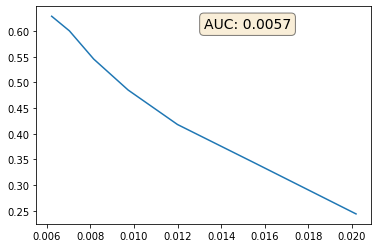

In [16]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(pur[2:], eff[2:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(pur[2:], eff[2:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

Loss 1: 0.19591361284255981 Loss 2: 0.8055546879768372
EDGES: True positive: 37621 True: 39974 Positive 44282
CLUSTER: True positive: 7731.0 True: 39974 Positive: 5691683
Loss 1: 0.19999317824840546 Loss 2: 0.7970498204231262
EDGES: True positive: 31184 True: 33098 Positive 37502
CLUSTER: True positive: 7116.0 True: 33098 Positive: 4847842
Loss 1: 0.2231796830892563 Loss 2: 0.8095423579216003
EDGES: True positive: 28019 True: 29820 Positive 35131
CLUSTER: True positive: 7151.0 True: 29820 Positive: 4418414
Loss 1: 0.22832728922367096 Loss 2: 0.8088559508323669
EDGES: True positive: 38311 True: 41080 Positive 46738
CLUSTER: True positive: 6812.0 True: 41080 Positive: 5936931
Loss 1: 0.2118297964334488 Loss 2: 0.8007487058639526
EDGES: True positive: 32746 True: 34914 Positive 39834
CLUSTER: True positive: 7071.0 True: 34914 Positive: 5103096
Loss 1: 0.20608900487422943 Loss 2: 0.8160239458084106
EDGES: True positive: 48153 True: 51558 Positive 56066
CLUSTER: True positive: 7538.0 True: 

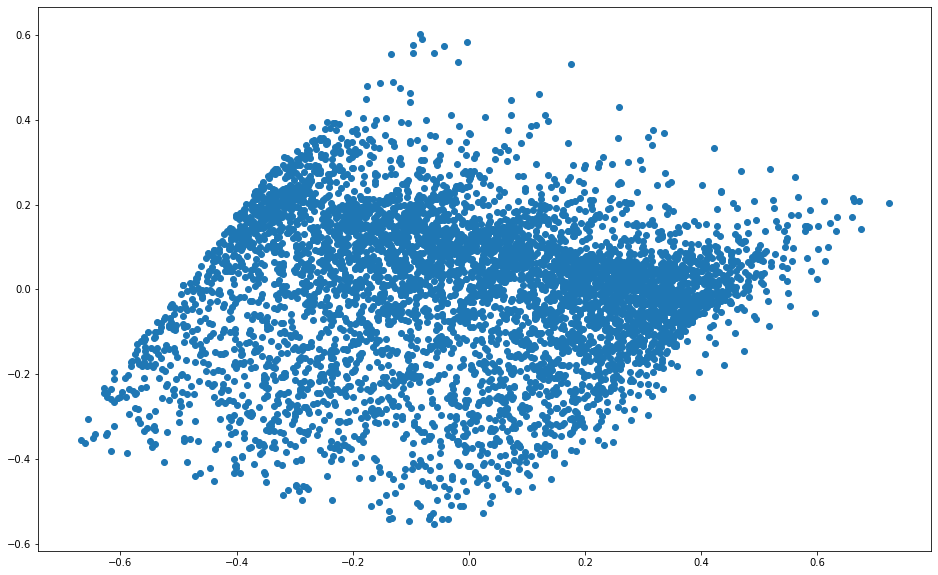

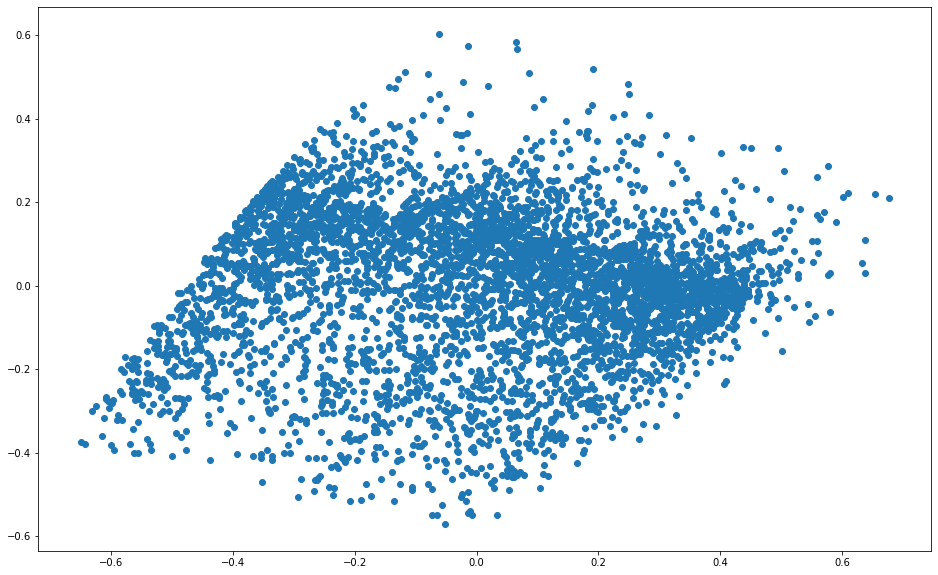

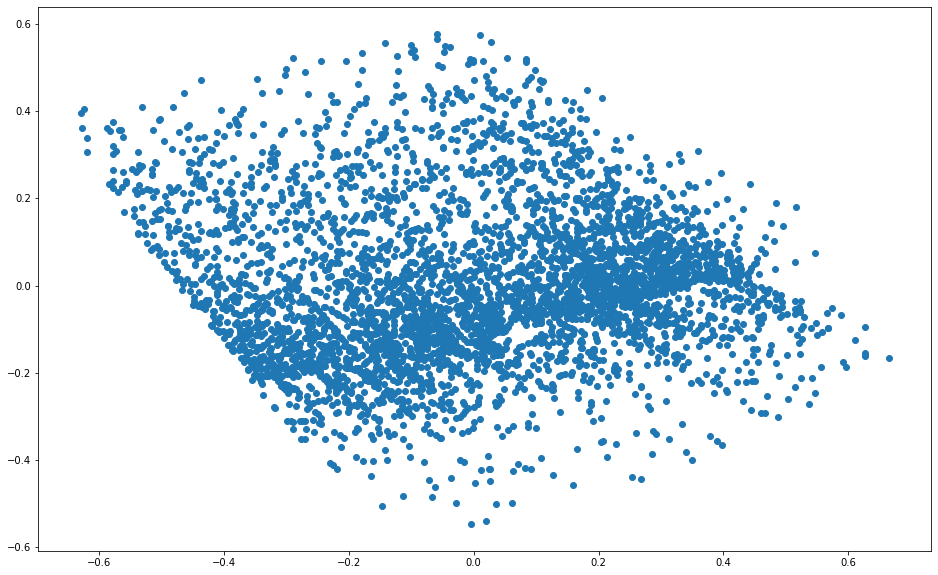

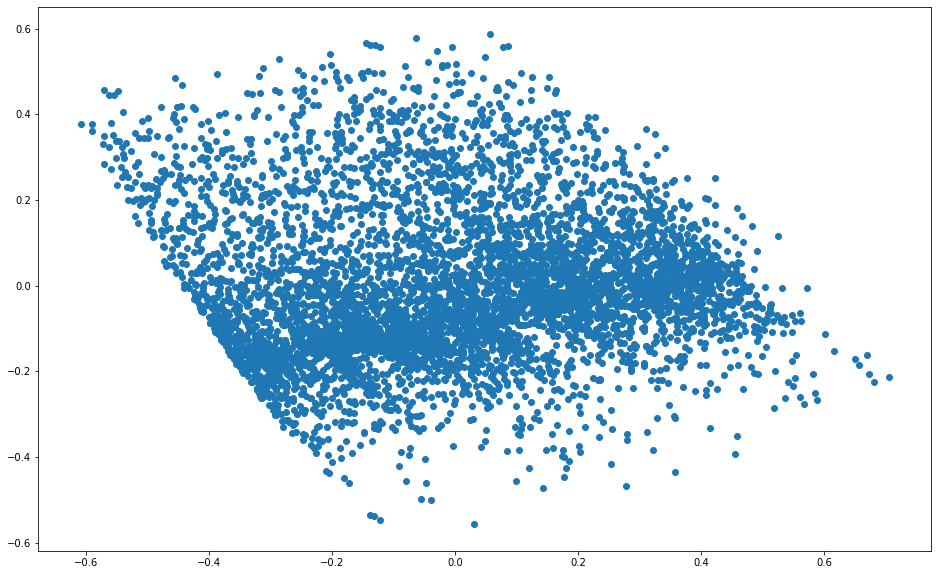

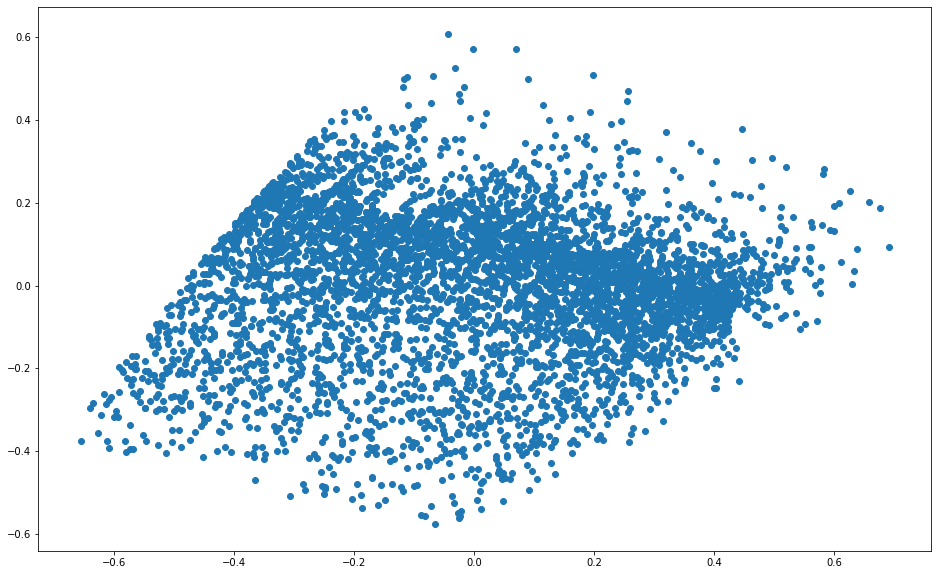

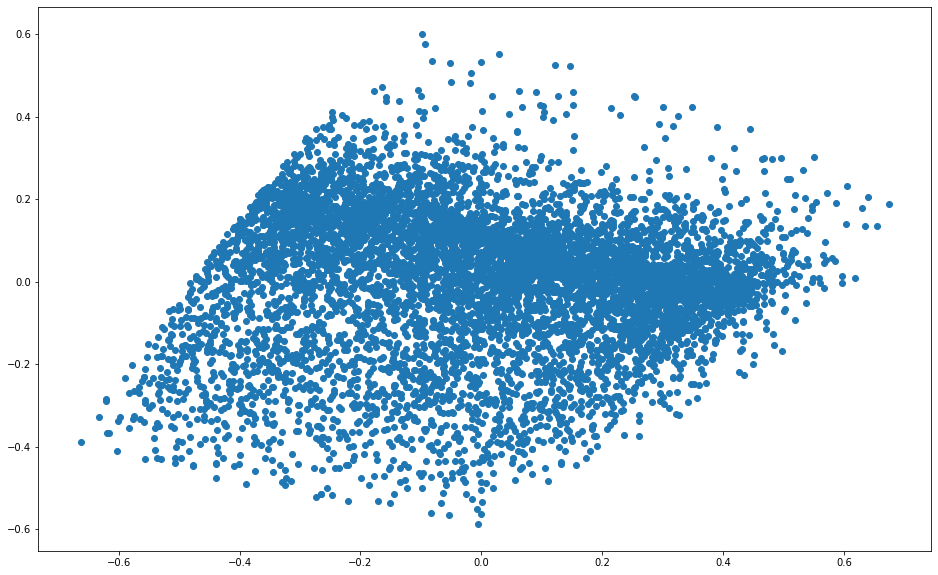

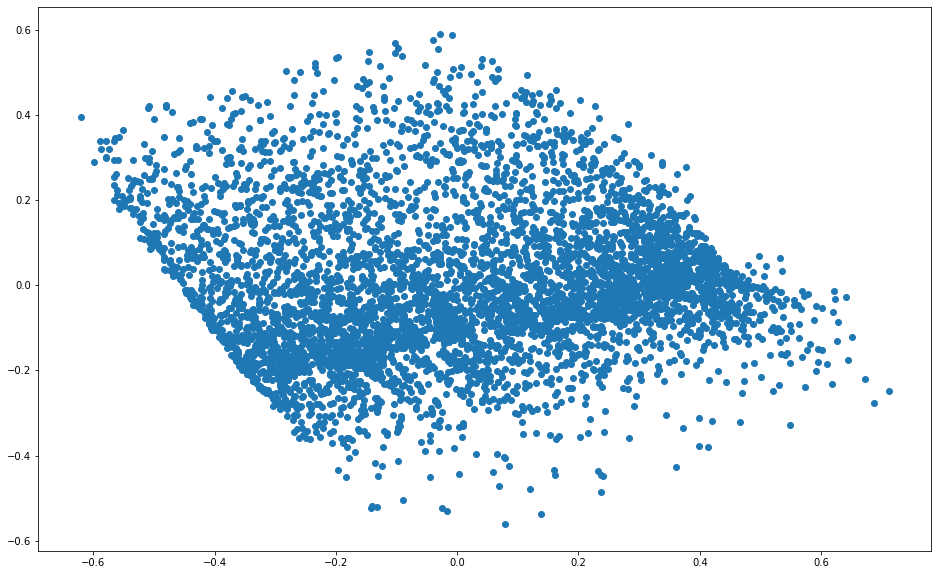

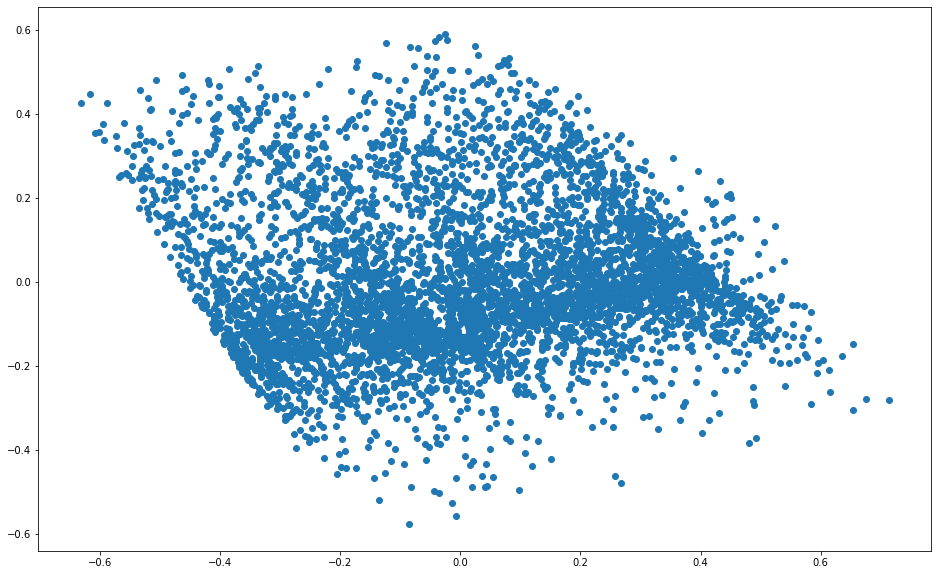

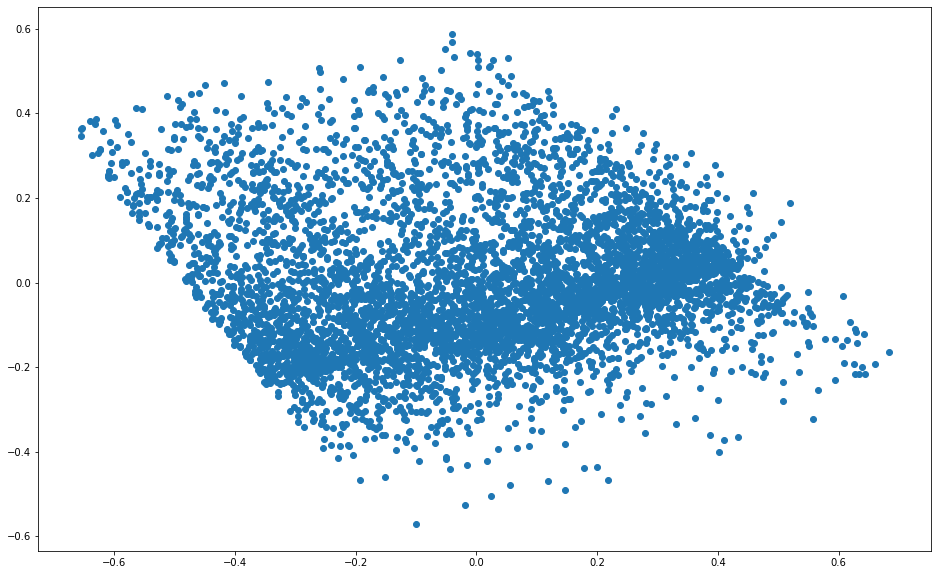

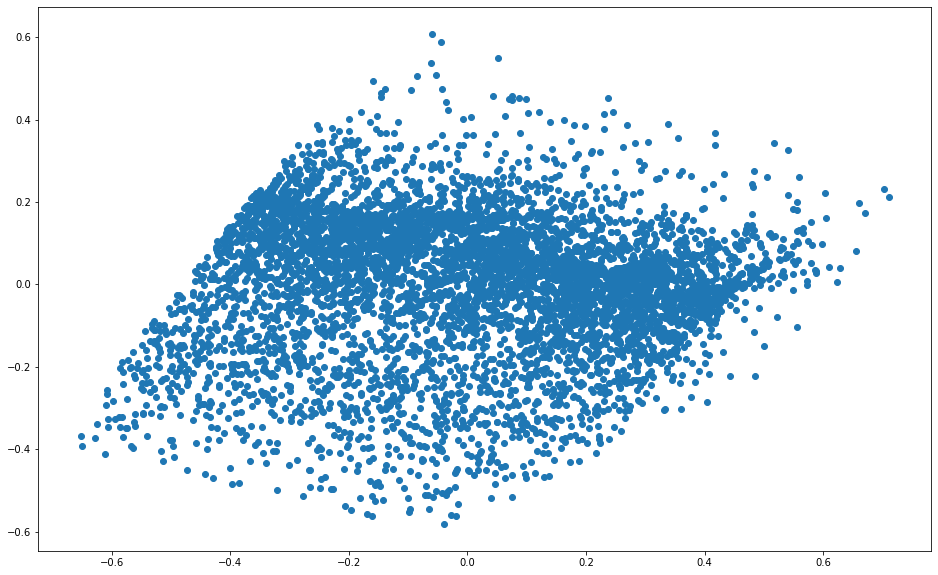

In [74]:
model.eval()
edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

for batch in test_loader:
    data = batch.to(device)
    pred, spatial, e = model(data)

    e_spatial = radius_graph(spatial, r=1, batch=batch.batch, loop=False, max_num_neighbors=1000)

    reference = spatial.index_select(0, e_spatial[1])
    neighbors = spatial.index_select(0, e_spatial[0])

    d = torch.sum((reference - neighbors)**2, dim=-1)

    y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
    y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
    
    
    hinge = y_cluster.float()
    hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  
    
    loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
    loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
    print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
    
    embedded = spatial.cpu().detach().numpy()    
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(embedded)
    #         print("PCA", pca_result)
    plt.figure(figsize=(16,10))
    plt.scatter(pca_result[:,0], pca_result[:,1])

    #Cluster performance
    batch_cpu = batch.pid.cpu()
    pids, counts = np.unique(batch_cpu, return_counts=True)
    cluster_true = (counts * (counts - 1)).sum()

    cluster_true_positive = (y_cluster.float()).sum().item()
    cluster_total_true_positive += cluster_true_positive
    
    cluster_positive = len(e_spatial[0])
    cluster_total_positive += max(cluster_positive, 1)

    cluster_total_true += cluster_true
    
    #Edge performance
    edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
    edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

    edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

    edge_true_positive += (edge_true & edge_positive).sum().item()
    edge_total_true += edge_true.sum().item()
    edge_total_positive += edge_positive.sum().item()

    print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
    print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)
    
    total += len(pred)

edge_acc = edge_correct/total
edge_eff = (edge_true_positive / edge_total_true)
edge_pur = (edge_true_positive / edge_total_positive)

cluster_eff = (cluster_total_true_positive / cluster_total_true)
cluster_pur = (cluster_total_true_positive / cluster_total_positive)

print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))

## Vanilla GravNet -> AGNN

## Embedding+AGNN

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class Embedding(torch.nn.Module):
    def __init__(self, in_channels, nb_hidden, nb_layer, emb_dim=3):
        super(Embedding, self).__init__()
        layers = [Linear(in_channels, nb_hidden)]
        ln = [Linear(nb_hidden, nb_hidden) for _ in range(nb_layer-1)]
        layers.extend(ln)
        self.layers = nn.ModuleList(layers)
        self.emb_layer = nn.Linear(nb_hidden, emb_dim)
        self.norm = torch.nn.LayerNorm(nb_hidden)
        self.act = nn.Tanh()
        # self.dropout = nn.Dropout(p=0.7)
#         self.mean = torch.FloatTensor(mean).to(torch.float)
#         self.std = torch.FloatTensor(std).to(torch.float)

    def forward(self, x):
#         hits = self.normalize(hits)
        for l in self.layers:
            x = l(x)
            x = self.act(x)
            # hits = self.dropout(hits)
        x = self.norm(x) #Option of LayerNorm
        x = self.emb_layer(x)
        return x

    def normalize(self, hits):
        try:
            hits = (hits-self.mean) / (self.std + 10**-9)
        except:
            self.mean = self.mean.to(device=hits.device)
            self.std  = self.std.to(device=hits.device)
            hits = (hits-self.mean) / (self.std + 10**-9)
        return hits

In [9]:
class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation='Tanh',
                 layer_norm=True):
        super(EdgeNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim, hidden_dim, hidden_dim, 1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)

class NodeNetwork(nn.Module):
    """
    A module which computes new node features on the graph.
    For each node, it aggregates the neighbor node features
    (separately on the input and output side), and combines
    them with the node's previous features in a fully-connected
    network to compute the new features.
    """
    def __init__(self, input_dim, output_dim, hidden_activation='Tanh',
                 layer_norm=True):
        super(NodeNetwork, self).__init__()
        self.network = make_mlp(input_dim*3, [output_dim]*4,
                                hidden_activation=hidden_activation,
                                output_activation=hidden_activation,
                                layer_norm=layer_norm)

    def forward(self, x, e, edge_index):
        start, end = edge_index
        # Aggregate edge-weighted incoming/outgoing features
        mi = scatter_add(e[:, None] * x[start], end, dim=0, dim_size=x.shape[0])
        mo = scatter_add(e[:, None] * x[end], start, dim=0, dim_size=x.shape[0])
        node_inputs = torch.cat([mi, mo, x], dim=1)
        return self.network(node_inputs)

class EmbeddingToAGNN(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, emb_hidden=32, nb_layer=4, emb_dim=8, r=0.2, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(EmbeddingToAGNN, self).__init__()
        self.n_graph_iters = n_graph_iters
        self.r = r
        # Setup the input network
        self.input_network = make_mlp(emb_dim, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(in_channels + hidden_dim + emb_dim, in_channels + hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(in_channels + hidden_dim + emb_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.emb_network = Embedding(in_channels, emb_hidden, nb_layer, emb_dim)
        
#         self.spatial_norm = torch.nn.LayerNorm(emb_dim)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""        
        x = inputs.x
#         print(x.shape)
        spatial = self.emb_network(x)
#         spatial = self.spatial_norm(spatial)
        
        edge_index = radius_graph(spatial, r=self.r, batch=inputs.batch, loop=False, max_num_neighbors=50)
#         print(edge_index.shape)
        x = self.input_network(spatial)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, spatial, inputs.x], dim=-1)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            x_inital = x
            
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, spatial, inputs.x], dim=-1)
             
            x = x_inital + x
        
        return self.edge_network(x, edge_index), spatial, edge_index

In [10]:
class MultiNoiseLoss(nn.Module):
    def __init__(self, n_losses):
        super(MultiNoiseLoss, self).__init__()
        self.noise_params = torch.rand(n_losses, requires_grad=True, device="cuda:0")
    
    def forward(self, losses):
        
        total_loss = 0
        for i, loss in enumerate(losses):
            total_loss += (1/torch.square(self.noise_params[i]))*loss + torch.log(self.noise_params[i])
        
        return total_loss

In [39]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
                
        e_spatial = radius_graph(spatial, r=m_configs["r_train"], batch=batch.batch, loop=False, max_num_neighbors=1000)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"])
#         print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        loss = loss_1 + loss_2
        total_loss += loss
        
        loss.backward()
        optimizer.step()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        
        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive 
        
        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()
        total += len(pred)

    edge_acc = edge_correct/total
    cluster_pur = (cluster_total_true_positive / cluster_total_positive)
    
    return edge_acc, cluster_pur, total_loss

def evaluate(model, test_loader):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        e_spatial = radius_graph(spatial, r=m_configs["r_val"], batch=batch.batch, loop=False, max_num_neighbors=1000)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())

        loss = loss_1 + loss_2
        total_loss += loss
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

        #Edge performance
        edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
        edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

        edge_true_positive += (edge_true & edge_positive).sum().item()
        edge_total_true += edge_true.sum().item()
        edge_total_positive += edge_positive.sum().item()

        print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
        print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)

        total += len(pred)

    edge_acc = edge_correct/total
    edge_eff = (edge_true_positive / max(edge_total_true, 1))
    edge_pur = (edge_true_positive / max(edge_total_positive, 1))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

    print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
    print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, total_loss

In [11]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer, loss_fn):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        # Get true edge list
        records_array = batch.pid.cpu()
        idx_sort = np.argsort(records_array)
        sorted_records_array = records_array[idx_sort]
        _, idx_start, _ = np.unique(sorted_records_array, return_counts=True,
                                return_index=True)

        # sets of indices
        res = np.split(idx_sort, idx_start[1:])
        true_list = torch.cat([torch.tensor(list(permutations(i, r=2))) for i in res if len(list(permutations(i, r=2))) > 0])
        
#         print(batch.pid[true_list.T[0]] == batch.pid[true_list.T[1]])
        
        # Get fake edge list
        candidates = radius_graph(spatial, r=m_configs['r_train'], batch=batch.batch, loop=False, max_num_neighbors=200)
        fake_list = candidates[:,batch.pid[candidates[0]] != batch.pid[candidates[1]]]
        
#         print(batch.pid[fake_list[0]] == batch.pid[fake_list[1]])
        
        # Concatenate all candidates
        e_spatial = torch.cat([fake_list, true_list.T.to(device)], axis=-1)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
#         print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        loss = loss_fn([loss_1.to(device), loss_2.to(device)])
#         print("Loss:", loss, "Noise params:", loss_fn.noise_params)
        total_loss += loss.item()
        loss.backward()
        optimizer.step()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        
        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive 
        
        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()
        total += len(pred)

    edge_acc = edge_correct/total
    cluster_pur = (cluster_total_true_positive / cluster_total_positive)
    
    return edge_acc, cluster_pur, total_loss

def evaluate(model, test_loader, loss_fn):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        e_spatial = radius_graph(spatial, r=m_configs["r_val"], batch=batch.batch, loop=False, max_num_neighbors=200)
#         e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())

        loss = loss_fn([loss_1, loss_2]).item()
        print("Combined loss:", loss, "Noise params:", loss_fn.noise_params)
        total_loss += loss
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

        #Edge performance
        edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
        edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

        edge_true_positive += (edge_true & edge_positive).sum().item()
        edge_total_true += edge_true.sum().item()
        edge_total_positive += edge_positive.sum().item()

        print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
        print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)

        total += len(pred)

    edge_acc = edge_correct/total
    edge_eff = (edge_true_positive / max(edge_total_true, 1))
    edge_pur = (edge_true_positive / max(edge_total_positive, 1))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

    print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
    print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, total_loss

In [13]:
train_dataset[0]

Data(pid=[13733], x=[13733, 3])

In [23]:
m_configs = {"in_channels": 3, "emb_hidden": 32, "nb_layer": 4, "emb_dim": 8, "r": 1.5, "hidden_dim": 16, "n_graph_iters": 6}
other_configs = {"k": 20, "r_train": 1, "r_val": 1.5, "margin": 1, 'reduction':'mean'}
model = EmbeddingToAGNN(**m_configs).to(device)
multi_loss = MultiNoiseLoss(n_losses=2).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="GravNet", group="EmbeddingToAGNNMedium", config=m_configs)
wandb.watch(model, log='all')

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [24]:
optimizer = torch.optim.AdamW([
    {'params': model.emb_network.parameters()},
    {'params': chain(model.node_network.parameters(), model.edge_network.parameters(), model.input_network.parameters())},
    {'params': multi_loss.noise_params}],
lr = 0.001, weight_decay=1e-3, amsgrad=True)

In [27]:
lambda1 = lambda ep: 1 / (1.1**((ep+21)//20))
lambda2 = lambda ep: 1 / (2**((ep+31)//30))
lambda3 = lambda ep: 1 / (1.1**((ep+11)//10))
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=[lambda1, lambda2, lambda3])

In [28]:
weight = 2
for epoch in range(100):
    tic = tt()  
    model.train()
    edge_acc, cluster_pur, train_loss = train(model, train_loader, optimizer, multi_loss)
    print("Training loss:", train_loss) 

    model.eval()
    edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, val_loss = evaluate(model, test_loader, multi_loss)
    scheduler.step()
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "edge_acc": edge_acc, "edge_pur": edge_pur, "edge_eff": edge_eff, "cluster_pur": cluster_pur, "cluster_eff": cluster_eff, "lr": scheduler._last_lr[0], "noise_1": multi_loss.noise_params[0].item(), "noise_2": multi_loss.noise_params[1].item()})
    
    save_model(epoch, model, optimizer, scheduler, cluster_eff, m_configs, 'EmbeddingToAGNN/'+model_name._name+'.tar')

    print('Epoch: {}, Edge Accuracy: {:.4f}, Edge Purity: {:.4f}, Edge Efficiency: {:.4f}, Cluster Purity: {:.4f}, Cluster Efficiency: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(epoch, edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, val_loss, scheduler._last_lr, tt()-tic))

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Training loss: 3579.621555328369
Loss 1: 0.12423188984394073 Loss 2: 0.16211733222007751
Combined loss: 10.367984771728516 Noise params: tensor([0.1034, 0.2631], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 3416 Positive 0
CLUSTER: True positive: 13972.0 True: 113344 Positive: 3375671
Loss 1: 0.12478844076395035 Loss 2: 0.16109244525432587
Combined loss: 10.40528392791748 Noise params: tensor([0.1034, 0.2631], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 3494 Positive 0
CLUSTER: True positive: 13762.0 True: 112378 Positive: 3346367
Loss 1: 0.12761592864990234 Loss 2: 0.1617133617401123
Combined loss: 10.67896842956543 Noise params: tensor([0.1034, 0.2631], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 3409 Positive 0
CLUSTER: True positive: 13849.0 True: 95788 Positive: 2825158
Loss 1: 0.12226981669664383 Loss 2: 0.1615639179944992
Combined loss: 10.176298141479492 Noise params: tensor([0.1034, 0.2631], device='cuda:0', r

/global/homes/d/danieltm/.local/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:200: UserWarning: Please also save or load the state of the optimzer when saving or loading the scheduler.
  warnings.warn(SAVE_STATE_WARNING, UserWarning)


Training loss: 1427.3071117401123
Loss 1: 0.10623560845851898 Loss 2: 0.15484778583049774
Combined loss: 5.541280746459961 Noise params: tensor([0.1208, 0.3196], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 4604 Positive 0
CLUSTER: True positive: 18182.0 True: 112140 Positive: 3328563
Loss 1: 0.1024312898516655 Loss 2: 0.15311798453330994
Combined loss: 5.263667106628418 Noise params: tensor([0.1208, 0.3196], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 4506 Positive 0
CLUSTER: True positive: 17815.0 True: 127712 Positive: 3778612
Loss 1: 0.11252185702323914 Loss 2: 0.1534104347229004
Combined loss: 5.957944869995117 Noise params: tensor([0.1208, 0.3196], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 4677 Positive 0
CLUSTER: True positive: 17787.0 True: 93352 Positive: 2728193
Loss 1: 0.11097286641597748 Loss 2: 0.15391728281974792
Combined loss: 5.856769561767578 Noise params: tensor([0.1208, 0.3196], device='cuda:0', re

Loss 1: 0.10738555341959 Loss 2: 0.14380782842636108
Combined loss: 3.151029109954834 Noise params: tensor([0.1451, 0.4015], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 7345 Positive 0
CLUSTER: True positive: 28791.0 True: 109802 Positive: 3076542
Loss 1: 0.11503995209932327 Loss 2: 0.14495433866977692
Combined loss: 3.5218093395233154 Noise params: tensor([0.1451, 0.4015], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 7398 Positive 0
CLUSTER: True positive: 28106.0 True: 95788 Positive: 2654582
EDGE Accuracy: 0.9913, Purity: 0.0000, Efficiency: 0.0000
CLUSTER Purity: 0.0088, Efficiency: 0.2538
Epoch: 3, Edge Accuracy: 0.9913, Edge Purity: 0.0000, Edge Efficiency: 0.0000, Cluster Purity: 0.0088, Cluster Efficiency: 0.2538, Loss: 30.9527, LR: [0.0009090909090909091, 0.0005, 0.0009090909090909091] in time 168.58555436134338
Training loss: 675.6521096229553
Loss 1: 0.11321751773357391 Loss 2: 0.14480671286582947
Combined loss: 2.76293683052063 N

Loss 1: 0.13888049125671387 Loss 2: 0.1464436650276184
Combined loss: 2.693186044692993 Noise params: tensor([0.1750, 0.4808], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 13113 Positive 0
CLUSTER: True positive: 43408.0 True: 109802 Positive: 2601235
Loss 1: 0.13770464062690735 Loss 2: 0.14673224091529846
Combined loss: 2.656038761138916 Noise params: tensor([0.1750, 0.4808], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 13507 Positive 0
CLUSTER: True positive: 43398.0 True: 112140 Positive: 2764640
Loss 1: 0.12528125941753387 Loss 2: 0.1436510533094406
Combined loss: 2.23703932762146 Noise params: tensor([0.1750, 0.4808], device='cuda:0', requires_grad=True)
EDGES: True positive: 0 True: 13357 Positive 0
CLUSTER: True positive: 46518.0 True: 127712 Positive: 3297287
Loss 1: 0.1251770555973053 Loss 2: 0.14488020539283752
Combined loss: 2.238954544067383 Noise params: tensor([0.1750, 0.4808], device='cuda:0', requires_grad=True)
EDGES: True po

KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aab6fc7af80> (for post_run_cell):


KeyboardInterrupt: 

### Results

In [14]:
model.eval()
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

pur, eff = [], []
r_min, r_max, r_step = 0.1, 1, 0.1


for r in np.arange(r_min, r_max, r_step):
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)

        e_spatial = radius_graph(spatial, r=r, batch=batch.batch, loop=False, max_num_neighbors=1000)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
        print("r", r, "e len", len(e_spatial[0]))

        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

    eff.append(cluster_total_true_positive / cluster_total_true)
    pur.append(cluster_total_true_positive / cluster_total_positive)
    
pur, eff = np.array(pur), np.array(eff)

r 0.1 e len 40642
r 0.1 e len 41948
r 0.1 e len 40780
r 0.1 e len 37382
r 0.1 e len 43624
r 0.1 e len 38442
r 0.1 e len 30972
r 0.1 e len 18204
r 0.1 e len 39448
r 0.1 e len 33024
r 0.2 e len 165878
r 0.2 e len 165290
r 0.2 e len 193562
r 0.2 e len 211956
r 0.2 e len 212452
r 0.2 e len 224848
r 0.2 e len 208902
r 0.2 e len 203168
r 0.2 e len 188948
r 0.2 e len 91736
r 0.30000000000000004 e len 521502
r 0.30000000000000004 e len 396890
r 0.30000000000000004 e len 226602
r 0.30000000000000004 e len 513222
r 0.30000000000000004 e len 413360
r 0.30000000000000004 e len 497994
r 0.30000000000000004 e len 514682
r 0.30000000000000004 e len 477138
r 0.30000000000000004 e len 551664
r 0.30000000000000004 e len 460548
r 0.4 e len 768486
r 0.4 e len 837312
r 0.4 e len 956844
r 0.4 e len 876332
r 0.4 e len 1009708
r 0.4 e len 924516
r 0.4 e len 417740
r 0.4 e len 946050
r 0.4 e len 717312
r 0.4 e len 936506
r 0.5 e len 1217050
r 0.5 e len 1579904
r 0.5 e len 1114560
r 0.5 e len 659440
r 0.5 e len

In [90]:
pur, eff = np.array(pur), np.array(eff)

In [15]:
pur, eff

(array([0.04886588, 0.02879242, 0.02019021, 0.01550792, 0.01199519,
        0.00972997, 0.00815024, 0.00703596, 0.00622132]),
 array([0.04706411, 0.14203266, 0.24401987, 0.34386132, 0.41815972,
        0.48530205, 0.54561598, 0.60048095, 0.62897046]))

Text(0.5, 0.95, 'AUC: 0.0057')

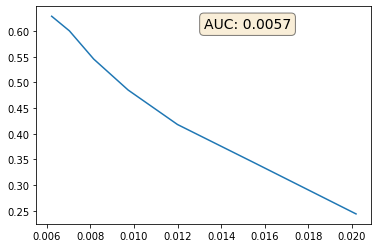

In [16]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(pur[2:], eff[2:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(pur[2:], eff[2:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

Loss 1: 0.3805650770664215 Loss 2: 0.43358755111694336
EDGES: True positive: 1468 True: 1512 Positive 2304
CLUSTER: True positive: 21226.0 True: 39724 Positive: 472754
Loss 1: 0.39187395572662354 Loss 2: 0.434693843126297
EDGES: True positive: 1587 True: 1674 Positive 2692
CLUSTER: True positive: 23606.0 True: 44110 Positive: 577612
Loss 1: 0.3983624577522278 Loss 2: 0.4373193681240082
EDGES: True positive: 1419 True: 1490 Positive 2394
CLUSTER: True positive: 21420.0 True: 39524 Positive: 456916
Loss 1: 0.3560328781604767 Loss 2: 0.43586331605911255
EDGES: True positive: 1238 True: 1292 Positive 1989
CLUSTER: True positive: 19562.0 True: 36528 Positive: 398870
Loss 1: 0.40297380089759827 Loss 2: 0.43316298723220825
EDGES: True positive: 1407 True: 1494 Positive 2419
CLUSTER: True positive: 21656.0 True: 40164 Positive: 498370
Loss 1: 0.3698059320449829 Loss 2: 0.4342704117298126
EDGES: True positive: 1196 True: 1226 Positive 1875
CLUSTER: True positive: 17962.0 True: 34090 Positive: 3

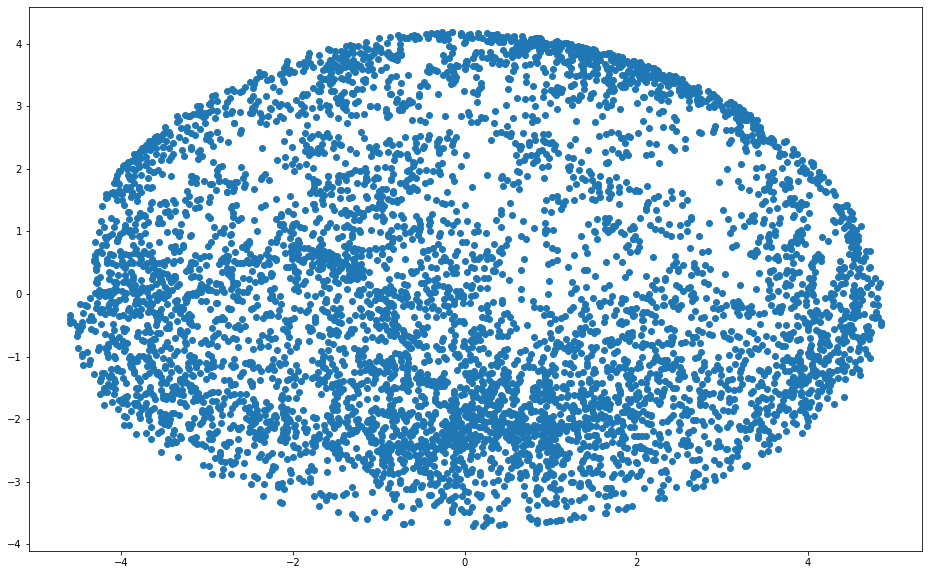

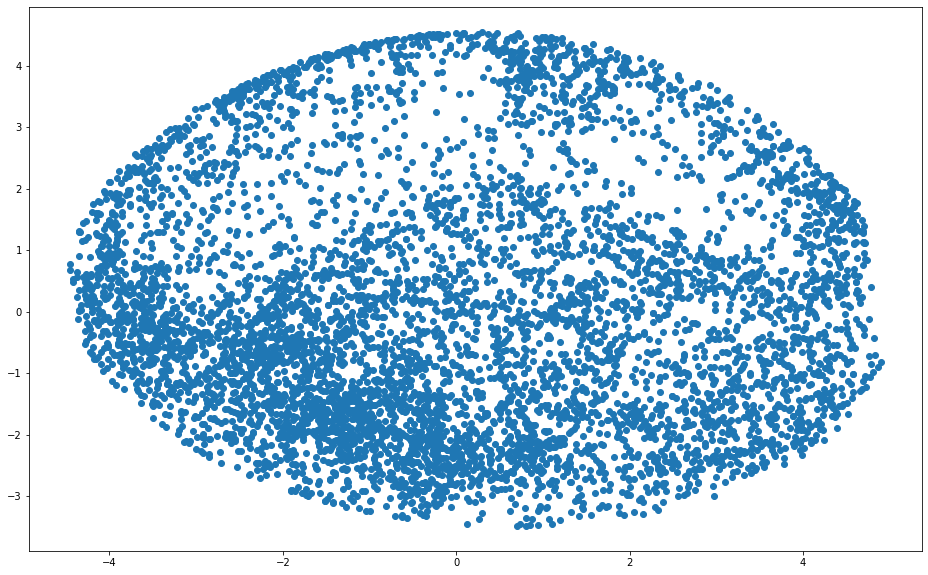

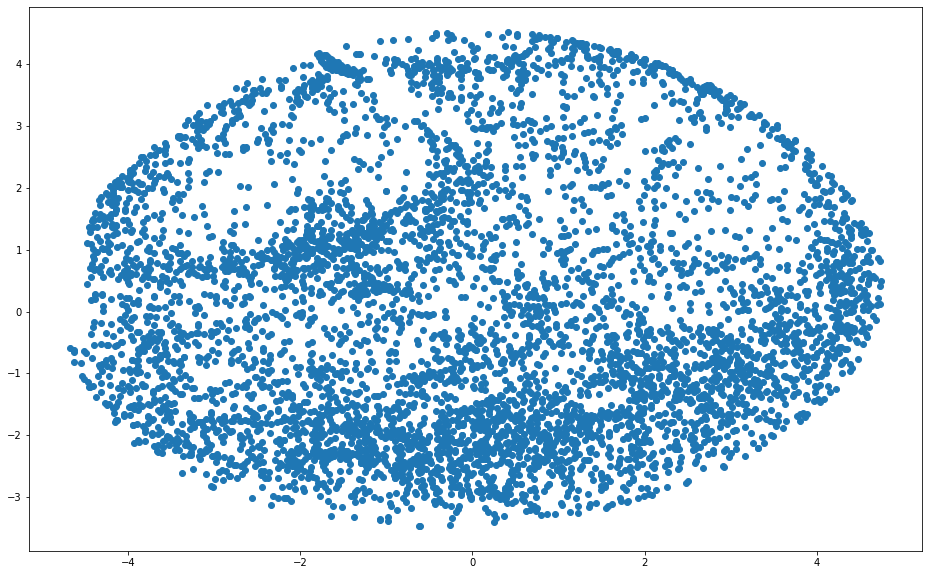

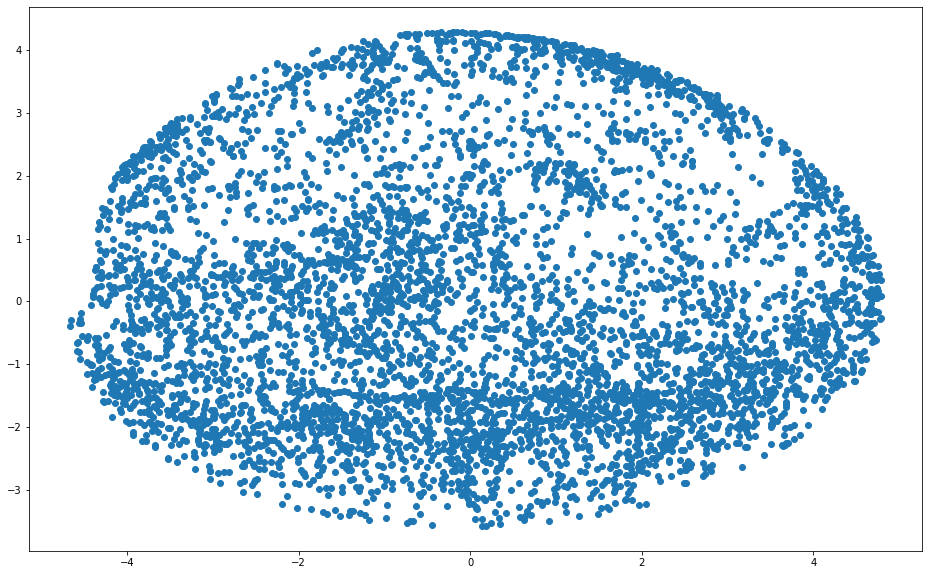

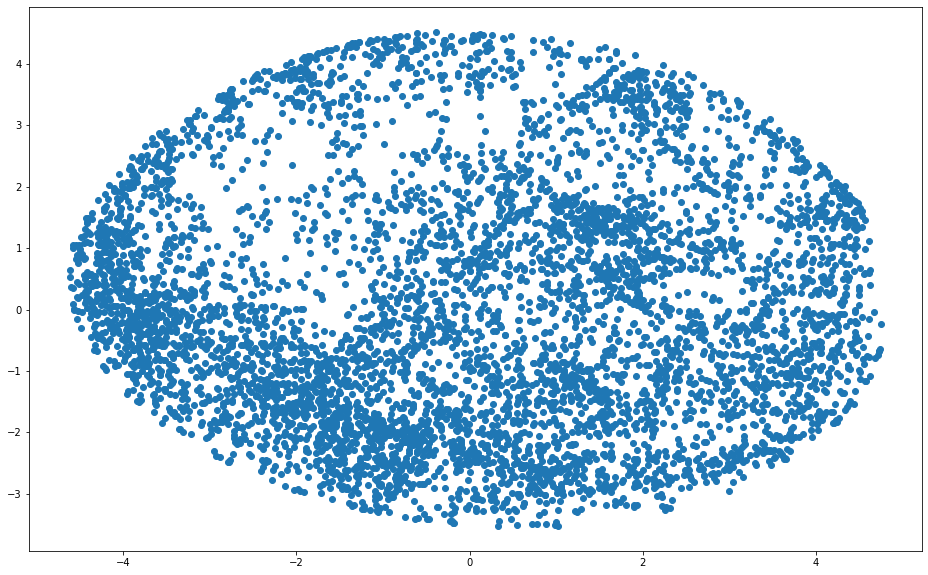

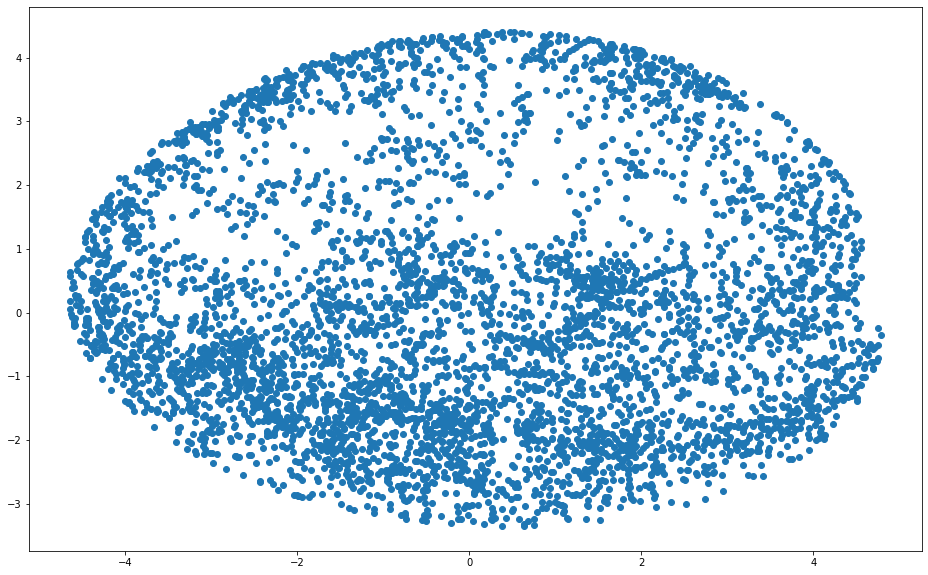

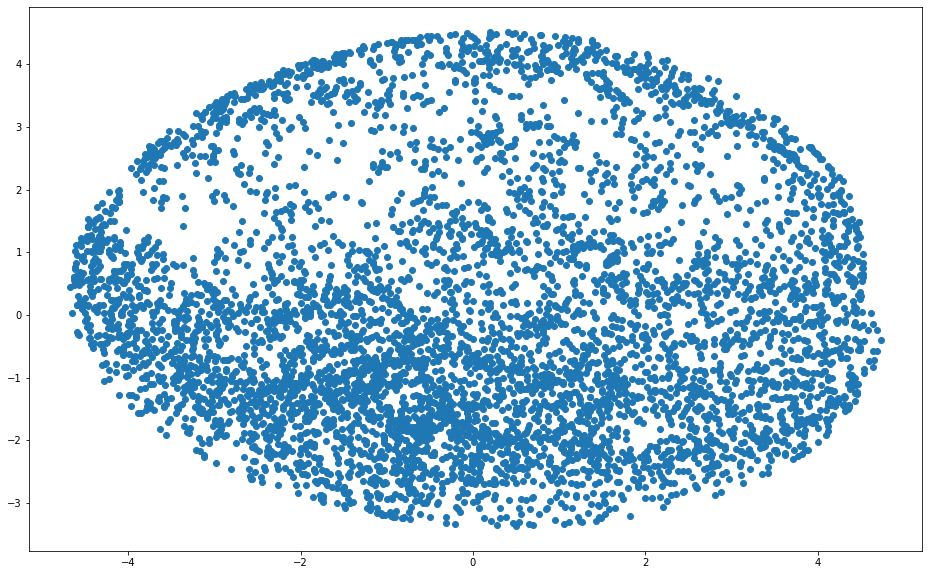

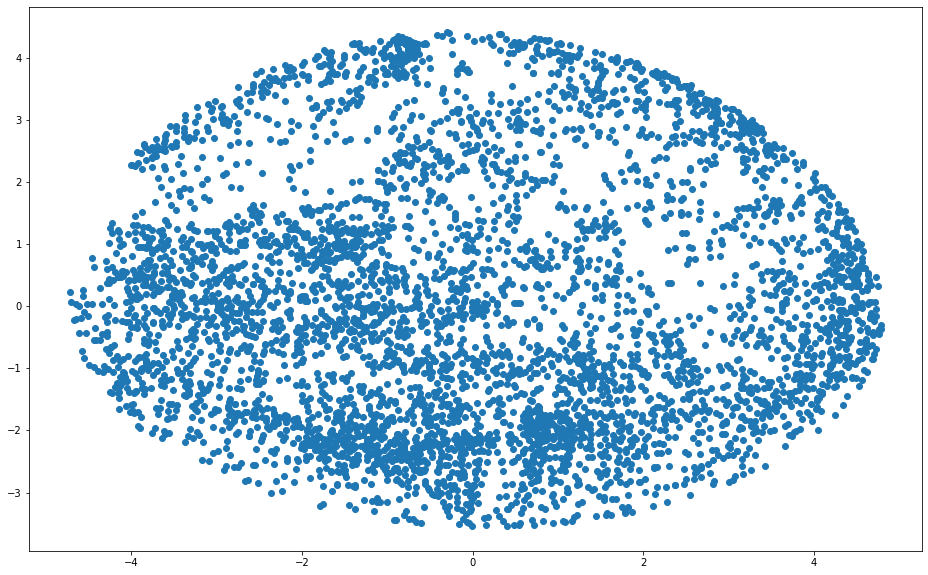

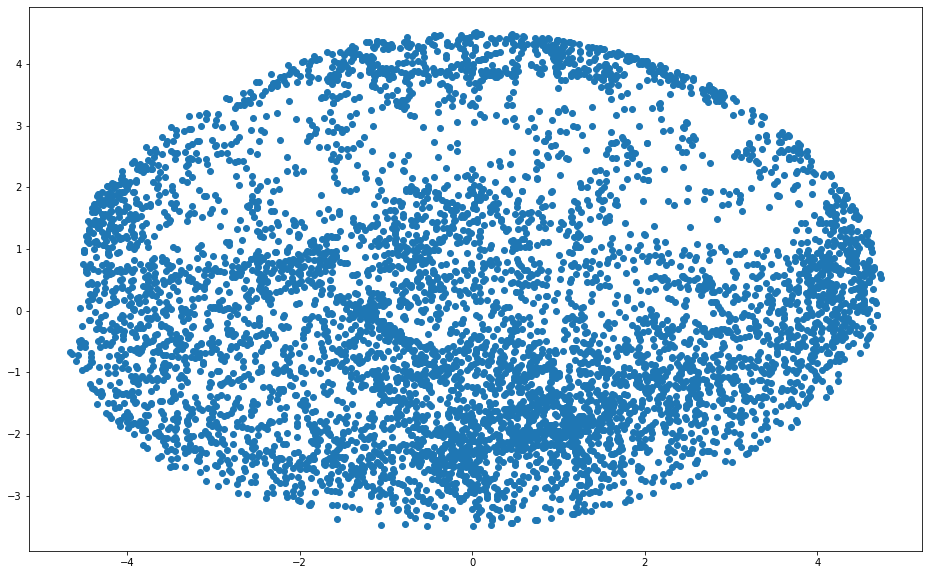

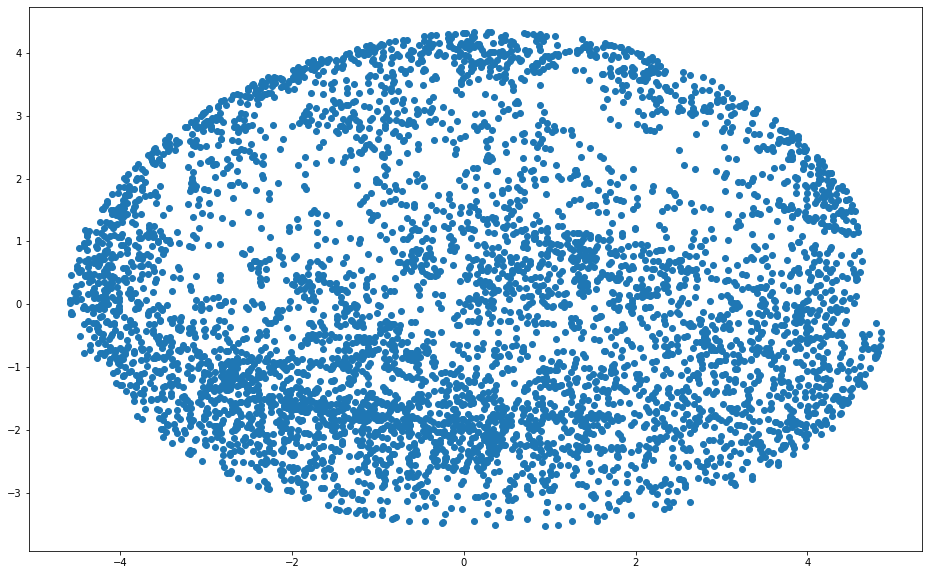

In [13]:
model.eval()
edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

for batch in test_loader:
    data = batch.to(device)
    pred, spatial, e = model(data)

    e_spatial = radius_graph(spatial, r=1, batch=batch.batch, loop=False, max_num_neighbors=1000)

    reference = spatial.index_select(0, e_spatial[1])
    neighbors = spatial.index_select(0, e_spatial[0])

    d = torch.sum((reference - neighbors)**2, dim=-1)

    y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
    y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
    
    
    hinge = y_cluster.float()
    hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  
    
    loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
    loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
    print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
    
    embedded = spatial.cpu().detach().numpy()    
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(embedded)
    #         print("PCA", pca_result)
    plt.figure(figsize=(16,10))
    plt.scatter(pca_result[:,0], pca_result[:,1])

    #Cluster performance
    batch_cpu = batch.pid.cpu()
    pids, counts = np.unique(batch_cpu, return_counts=True)
    cluster_true = (counts * (counts - 1)).sum()

    cluster_true_positive = (y_cluster.float()).sum().item()
    cluster_total_true_positive += cluster_true_positive
    
    cluster_positive = len(e_spatial[0])
    cluster_total_positive += max(cluster_positive, 1)

    cluster_total_true += cluster_true
    
    #Edge performance
    edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
    edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

    edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

    edge_true_positive += (edge_true & edge_positive).sum().item()
    edge_total_true += edge_true.sum().item()
    edge_total_positive += edge_positive.sum().item()

    print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
    print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)
    
    total += len(pred)

edge_acc = edge_correct/total
edge_eff = (edge_true_positive / edge_total_true)
edge_pur = (edge_true_positive / edge_total_positive)

cluster_eff = (cluster_total_true_positive / cluster_total_true)
cluster_pur = (cluster_total_true_positive / cluster_total_positive)

print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))

## EmbAGNN

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class Embedding(torch.nn.Module):
    def __init__(self, in_channels, nb_hidden, nb_layer, emb_dim=3):
        super(Embedding, self).__init__()
        layers = [Linear(in_channels, nb_hidden)]
        ln = [Linear(nb_hidden, nb_hidden) for _ in range(nb_layer-1)]
        layers.extend(ln)
        self.layers = nn.ModuleList(layers)
        self.emb_layer = nn.Linear(nb_hidden, emb_dim)
        self.norm = torch.nn.LayerNorm(nb_hidden)
        self.act = nn.Tanh()
        # self.dropout = nn.Dropout(p=0.7)
#         self.mean = torch.FloatTensor(mean).to(torch.float)
#         self.std = torch.FloatTensor(std).to(torch.float)

    def forward(self, x):
#         hits = self.normalize(hits)
        for l in self.layers:
            x = l(x)
            x = self.act(x)
            # hits = self.dropout(hits)
        x = self.norm(x) #Option of LayerNorm
        x = self.emb_layer(x)
        return x

    def normalize(self, hits):
        try:
            hits = (hits-self.mean) / (self.std + 10**-9)
        except:
            self.mean = self.mean.to(device=hits.device)
            self.std  = self.std.to(device=hits.device)
            hits = (hits-self.mean) / (self.std + 10**-9)
        return hits

In [13]:
class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation='Tanh',
                 layer_norm=True):
        super(EdgeNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim, hidden_dim, hidden_dim, 1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)

class NodeNetwork(nn.Module):
    """
    A module which computes new node features on the graph.
    For each node, it aggregates the neighbor node features
    (separately on the input and output side), and combines
    them with the node's previous features in a fully-connected
    network to compute the new features.
    """
    def __init__(self, input_dim, output_dim, hidden_activation='Tanh',
                 layer_norm=True):
        super(NodeNetwork, self).__init__()
        self.network = make_mlp(input_dim*3, [output_dim]*4,
                                hidden_activation=hidden_activation,
                                output_activation=hidden_activation,
                                layer_norm=layer_norm)

    def forward(self, x, e, edge_index):
        start, end = edge_index
        # Aggregate edge-weighted incoming/outgoing features
        mi = scatter_add(e[:, None] * x[start], end, dim=0, dim_size=x.shape[0])
        mo = scatter_add(e[:, None] * x[end], start, dim=0, dim_size=x.shape[0])
        node_inputs = torch.cat([mi, mo, x], dim=1)
        return self.network(node_inputs)

class EmbAGNN(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, emb_hidden=32, nb_layer=4, emb_dim=8, r=0.2, k=20, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(EmbAGNN, self).__init__()
        self.n_graph_iters = n_graph_iters
        self.r = r
        self.k = k
        # Setup the input network
        self.input_spatial_network = make_mlp(in_channels, [emb_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        
        self.input_feature_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        
#         self.combine_network = make_mlp(emb_dim + hidden_dim, [hidden_dim],
#                                       output_activation=hidden_activation,
#                                       layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.emb_network = Embedding(emb_dim + hidden_dim, emb_hidden, nb_layer, emb_dim)
        
#         self.spatial_norm = torch.nn.LayerNorm(emb_dim)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""        
        x = inputs.x
#         print(x.shape)
        spatial = self.input_spatial_network(x)
        features = self.input_feature_network(x)
#         spatial = self.spatial_norm(spatial)
        edge_index = knn_graph(spatial, k=self.k, batch=inputs.batch, loop=False)
#         print(edge_index.shape)

        # Shortcut connect the inputs onto the hidden representation
#         x = torch.cat([spatial, features], dim=-1)
#         x = self.combine_network(x)
#         print(features.shape)    
#         print(spatial.shape)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            features_inital = features
            
            # Apply edge network
            e = torch.sigmoid(self.edge_network(features, edge_index))
        
            # Apply node network
            features = self.node_network(features, e, edge_index)
#             x = torch.cat([spatial, features], dim=-1)
#             print(features.shape)            
            spatial = self.emb_network(torch.cat([features, spatial], axis=-1))
#             edge_index = radius_graph(spatial, r=self.r, batch=inputs.batch, loop=False, max_num_neighbors=50)
            edge_index = knn_graph(spatial, k=self.k, batch=inputs.batch, loop=False)
#             print(edge_index.shape)
#             print(spatial.shape)
            # Shortcut connect the inputs onto the hidden representation            
#             features = torch.cat([x, inputs.x], dim=-1)
             
            features = features_inital + features
        
        return self.edge_network(features, edge_index), spatial, edge_index

class EmbAGNNBalanced(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, emb_hidden=32, nb_layer=4, emb_dim=8, r=0.2, k=20, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(EmbAGNNBalanced, self).__init__()
        self.n_graph_iters = n_graph_iters
        self.r = r
        self.k = k
        # Setup the input network
        self.input_spatial_network = make_mlp(in_channels, [emb_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        
        self.input_feature_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        
#         self.combine_network = make_mlp(emb_dim + hidden_dim, [hidden_dim],
#                                       output_activation=hidden_activation,
#                                       layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.emb_network = Embedding(emb_dim + hidden_dim, emb_hidden, nb_layer, emb_dim)
        
#         self.spatial_norm = torch.nn.LayerNorm(emb_dim)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""        
        x = inputs.x
#         print(x.shape)
        spatial = self.input_spatial_network(x)
        features = self.input_feature_network(x)
        spatial = self.emb_network(torch.cat([features, spatial], axis=-1))
        
        # Get true edge list
        records_array = inputs.pid.cpu()
        idx_sort = np.argsort(records_array)
        sorted_records_array = records_array[idx_sort]
        _, idx_start, _ = np.unique(sorted_records_array, return_counts=True,
                                return_index=True)

        # sets of indices
        res = np.split(idx_sort, idx_start[1:])
        true_list = torch.cat([torch.tensor(list(permutations(i, r=2))) for i in res if len(list(permutations(i, r=2))) > 0])
        
#         print(batch.pid[true_list.T[0]] == batch.pid[true_list.T[1]])
        
        # Get fake edge list
        candidates = radius_graph(spatial, r=self.r, batch=inputs.batch, loop=False, max_num_neighbors=200)
        fake_list = candidates[:,inputs.pid[candidates[0]] != inputs.pid[candidates[1]]]
        
        # Concatenate all candidates
        edge_index = torch.cat([fake_list, true_list.T.to(device)], axis=-1)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            features_inital = features
            
            # Apply edge network
            e = torch.sigmoid(self.edge_network(features, edge_index))
        
            # Apply node network
            features = self.node_network(features, e, edge_index)
            spatial = self.emb_network(torch.cat([features, spatial], axis=-1))
            
            # Get fake edge list
            candidates = radius_graph(spatial, r=self.r, batch=inputs.batch, loop=False, max_num_neighbors=200)
            fake_list = candidates[:,inputs.pid[candidates[0]] != inputs.pid[candidates[1]]]
            # Concatenate all candidates
            edge_index = torch.cat([fake_list, true_list.T.to(device)], axis=-1)
             
            features = features_inital + features
        
        return self.edge_network(features, edge_index), spatial, edge_index

In [19]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
                
#         e_spatial = radius_graph(spatial, r=m_configs["r_train"], batch=batch.batch, loop=False, max_num_neighbors=1000)
        e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"])
#         print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        loss = loss_1 + loss_2
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        
        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive 
        
        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()
        total += len(pred)

    edge_acc = edge_correct/total
    cluster_pur = (cluster_total_true_positive / cluster_total_positive)
    
    return edge_acc, cluster_pur, total_loss

def evaluate(model, test_loader):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)
        
#         e_spatial = radius_graph(spatial, r=m_configs["r_val"], batch=batch.batch, loop=False, max_num_neighbors=1000)
        e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())

        loss = loss_1.item() + loss_2.item()
        total_loss += loss
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

        #Edge performance
        edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
        edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

        edge_true_positive += (edge_true & edge_positive).sum().item()
        edge_total_true += edge_true.sum().item()
        edge_total_positive += edge_positive.sum().item()

        print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
        print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)

        total += len(pred)

    edge_acc = edge_correct/total
    edge_eff = (edge_true_positive / max(edge_total_true, 1))
    edge_pur = (edge_true_positive / max(edge_total_positive, 1))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

    print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
    print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, total_loss

In [14]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        # Get true edge list
        records_array = batch.pid.cpu()
        idx_sort = np.argsort(records_array)
        sorted_records_array = records_array[idx_sort]
        _, idx_start, _ = np.unique(sorted_records_array, return_counts=True,
                                return_index=True)

        # sets of indices
        res = np.split(idx_sort, idx_start[1:])
        true_list = torch.cat([torch.tensor(list(permutations(i, r=2))) for i in res if len(list(permutations(i, r=2))) > 0])
        
#         print(batch.pid[true_list.T[0]] == batch.pid[true_list.T[1]])
        
        # Get fake edge list
        candidates = radius_graph(spatial, r=m_configs['r_train'], batch=batch.batch, loop=False, max_num_neighbors=200)
        fake_list = candidates[:,batch.pid[candidates[0]] != batch.pid[candidates[1]]]
        
#         print(batch.pid[fake_list[0]] == batch.pid[fake_list[1]])
        
        # Concatenate all candidates
        e_spatial = torch.cat([fake_list, true_list.T.to(device)], axis=-1)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        loss = loss_1 + loss_2
#         print(loss)
        total_loss += loss.item()
        loss.backward()
        optimizer.step()
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        
        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive 
        
        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()
        total += len(pred)

    edge_acc = edge_correct/total
    cluster_pur = (cluster_total_true_positive / cluster_total_positive)
    
    return edge_acc, cluster_pur, total_loss

def evaluate(model, test_loader):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        e_spatial = radius_graph(spatial, r=m_configs["r_val"], batch=batch.batch, loop=False, max_num_neighbors=200)
#         e_spatial = knn_graph(spatial, k=m_configs["k"], batch=batch.batch, loop=False)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    

        hinge = y_cluster.float()
        hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  

        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())

        loss = loss_1.item() + loss_2.item()
        total_loss += loss
        
        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

        #Edge performance
        edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
        edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

        edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

        edge_true_positive += (edge_true & edge_positive).sum().item()
        edge_total_true += edge_true.sum().item()
        edge_total_positive += edge_positive.sum().item()

        print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
        print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)

        total += len(pred)

    edge_acc = edge_correct/total
    edge_eff = (edge_true_positive / max(edge_total_true, 1))
    edge_pur = (edge_true_positive / max(edge_total_positive, 1))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

    print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
    print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, total_loss

In [16]:
m_configs = {"in_channels": 3, "emb_hidden": 64, "nb_layer": 4, "emb_dim": 8, "r": 1, "k": 30, "hidden_dim": 16, "n_graph_iters": 6}
other_configs = {"r_train": 1, "r_val": 1, "margin": 0.5, 'reduction':'mean'}
model = EmbAGNNBalanced(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="GravNet", group="EmbAGNN", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=30)
ep = 0
best_acc = None

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [ ]:
weight = 3
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    edge_acc, cluster_pur, train_loss = train(model, train_loader, optimizer)
    print("Training loss:", train_loss)

    model.eval()
    edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "edge_acc": edge_acc, "edge_pur": edge_pur, "edge_eff": edge_eff, "cluster_pur": cluster_pur, "cluster_eff": cluster_eff, "lr": scheduler._last_lr[0]})
    
    if (best_acc is None) or cluster_eff > best_acc: 
        best_acc = cluster_eff
        save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'EmbAGNN/'+model_name._name+'.tar')

    print('Epoch: {}, Edge Accuracy: {:.4f}, Edge Purity: {:.4f}, Edge Efficiency: {:.4f}, Cluster Purity: {:.4f}, Cluster Efficiency: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, edge_acc, edge_pur, edge_eff, cluster_pur, cluster_eff, val_loss, scheduler._last_lr[0], tt()-tic))

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Loss 1: 0.9665147066116333 Loss 2: 0.015737617388367653
Loss 1: 0.8044652342796326 Loss 2: 0.09408772736787796
Loss 1: 0.8299221396446228 Loss 2: 0.09518265724182129
Loss 1: 0.7774809002876282 Loss 2: 0.07086028903722763
Loss 1: 0.7300677299499512 Loss 2: 0.1021321713924408
Loss 1: 0.7506421208381653 Loss 2: 0.3119816482067108
Loss 1: 0.6845664978027344 Loss 2: 0.4235072135925293
Loss 1: 0.6215218901634216 Loss 2: 0.4467421770095825
Loss 1: 0.6059147715568542 Loss 2: 0.4432857930660248
Loss 1: 0.5818437337875366 Loss 2: 0.3695281445980072
Loss 1: 0.6082911491394043 Loss 2: 0.329936683177948
Loss 1: 0.5930840969085693 Loss 2: 0.14182744920253754
Loss 1: 0.5755079388618469 Loss 2: 0.23198296129703522
Loss 1: 0.5562776327133179 Loss 2: 0.11384575068950653
Loss 1: 0.520961344242096 Loss 2: 0.19796182215213776
Loss 1: 0.5130090117454529 Loss 2: 0.24190789461135864
Loss 1: 0.493242084980011 Loss 2: 0.3445315957069397
Loss 1: 0.4970634877681732 Loss 2: 0.27916795015335083
Loss 1: 0.4764984250

Loss 1: 0.5627098679542542 Loss 2: 0.1815674901008606
Loss 1: 0.525358259677887 Loss 2: 0.14461582899093628
Loss 1: 0.5049855709075928 Loss 2: 0.1232294961810112
Loss 1: 0.4978843629360199 Loss 2: 0.14005903899669647
Loss 1: 0.5355845093727112 Loss 2: 0.1498623937368393
Loss 1: 0.5231098532676697 Loss 2: 0.14371857047080994
Loss 1: 0.5259657502174377 Loss 2: 0.16512161493301392
Loss 1: 0.5414514541625977 Loss 2: 0.16631413996219635
Loss 1: 0.5034053325653076 Loss 2: 0.13819736242294312
Loss 1: 0.534415602684021 Loss 2: 0.15178804099559784
Loss 1: 0.5552496314048767 Loss 2: 0.14574944972991943
Loss 1: 0.5738139748573303 Loss 2: 0.15725524723529816
Loss 1: 0.5526123642921448 Loss 2: 0.16551214456558228
Loss 1: 0.5384721755981445 Loss 2: 0.1491098403930664
Loss 1: 0.5642833113670349 Loss 2: 0.16481366753578186
Loss 1: 0.5700480341911316 Loss 2: 0.17037920653820038
Loss 1: 0.5505734086036682 Loss 2: 0.1513001173734665
Loss 1: 0.5494794249534607 Loss 2: 0.16072328388690948
Loss 1: 0.5324714

Loss 1: 0.6358419060707092 Loss 2: 0.15608681738376617
Loss 1: 0.6517588496208191 Loss 2: 0.1507275253534317
Loss 1: 0.6203776001930237 Loss 2: 0.13665640354156494
Loss 1: 0.6181982755661011 Loss 2: 0.13454918563365936
Loss 1: 0.6914125084877014 Loss 2: 0.15627171099185944
Loss 1: 0.7374391555786133 Loss 2: 0.1872895061969757
Loss 1: 0.6857631802558899 Loss 2: 0.1517494171857834
Loss 1: 0.6994253993034363 Loss 2: 0.14662300050258636
Loss 1: 0.6608936190605164 Loss 2: 0.137483149766922
Loss 1: 0.6767473220825195 Loss 2: 0.14353309571743011
Loss 1: 0.7309234738349915 Loss 2: 0.15813784301280975
Loss 1: 0.6622949838638306 Loss 2: 0.14873714745044708
Loss 1: 0.6157030463218689 Loss 2: 0.15090736746788025
Loss 1: 0.7376254796981812 Loss 2: 0.16139620542526245
Loss 1: 0.6900434494018555 Loss 2: 0.13289284706115723
Loss 1: 0.6821383833885193 Loss 2: 0.14540673792362213
Loss 1: 0.6779539585113525 Loss 2: 0.14587253332138062
Loss 1: 0.7419792413711548 Loss 2: 0.15450210869312286
Loss 1: 0.69468

Loss 1: 0.7368108034133911 Loss 2: 0.15178412199020386
Loss 1: 0.7322654128074646 Loss 2: 0.1507807821035385
Loss 1: 0.7782057523727417 Loss 2: 0.16090048849582672
Loss 1: 0.7333605885505676 Loss 2: 0.16304226219654083
Loss 1: 0.7583639621734619 Loss 2: 0.15002651512622833
Loss 1: 0.7266301512718201 Loss 2: 0.1452348381280899
Loss 1: 0.7220005989074707 Loss 2: 0.1397361010313034
Loss 1: 0.7426387667655945 Loss 2: 0.16017204523086548
Loss 1: 0.7791147828102112 Loss 2: 0.15800145268440247
Loss 1: 0.7795930504798889 Loss 2: 0.1613394170999527
Loss 1: 0.7722218036651611 Loss 2: 0.1694198101758957
Loss 1: 0.7852605581283569 Loss 2: 0.1653270721435547
Loss 1: 0.7422187924385071 Loss 2: 0.1560666263103485
Loss 1: 0.7754151225090027 Loss 2: 0.14628207683563232
Loss 1: 0.8054973483085632 Loss 2: 0.16196495294570923
Loss 1: 0.7898979187011719 Loss 2: 0.15706989169120789
Loss 1: 0.7565670013427734 Loss 2: 0.14978836476802826
Loss 1: 0.748503565788269 Loss 2: 0.13485977053642273
Loss 1: 0.76516550

Loss 1: 0.7279496192932129 Loss 2: 0.1500236839056015
Loss 1: 0.7613967061042786 Loss 2: 0.14132583141326904
Loss 1: 0.8057464957237244 Loss 2: 0.16368481516838074
Loss 1: 0.812875509262085 Loss 2: 0.16489040851593018
Loss 1: 0.818675696849823 Loss 2: 0.16731324791908264
Loss 1: 0.7817040085792542 Loss 2: 0.17205078899860382
Loss 1: 0.775173544883728 Loss 2: 0.14430934190750122
Loss 1: 0.7665404677391052 Loss 2: 0.14453330636024475
Loss 1: 0.7786179780960083 Loss 2: 0.1554514318704605
Loss 1: 0.8032089471817017 Loss 2: 0.14897920191287994
Loss 1: 0.8077977895736694 Loss 2: 0.16627871990203857
Loss 1: 0.811761200428009 Loss 2: 0.15369226038455963
Loss 1: 0.825401246547699 Loss 2: 0.16430126130580902
Loss 1: 0.8023350834846497 Loss 2: 0.1513376533985138
Loss 1: 0.7898609638214111 Loss 2: 0.14760378003120422
Loss 1: 0.812391459941864 Loss 2: 0.16645866632461548
Loss 1: 0.7972162365913391 Loss 2: 0.17259277403354645
Loss 1: 0.7912641167640686 Loss 2: 0.15496447682380676
Loss 1: 0.802993059

Loss 1: 0.8073754906654358 Loss 2: 0.14478358626365662
Loss 1: 0.8338760137557983 Loss 2: 0.15062527358531952
Loss 1: 0.8291376233100891 Loss 2: 0.16241292655467987
Loss 1: 0.799997866153717 Loss 2: 0.15310129523277283
Loss 1: 0.8586070537567139 Loss 2: 0.1454968899488449
Loss 1: 0.81998610496521 Loss 2: 0.14620913565158844
Loss 1: 0.8366131782531738 Loss 2: 0.14626477658748627
Loss 1: 0.8524751663208008 Loss 2: 0.14684131741523743
Loss 1: 0.8457774519920349 Loss 2: 0.14750312268733978
Loss 1: 0.832301914691925 Loss 2: 0.16126413643360138
Loss 1: 0.8143065571784973 Loss 2: 0.15602459013462067
Loss 1: 0.795336902141571 Loss 2: 0.14911144971847534
Loss 1: 0.7963430285453796 Loss 2: 0.14209073781967163
Loss 1: 0.9130894541740417 Loss 2: 0.1955210119485855
Loss 1: 0.7452822923660278 Loss 2: 0.21116019785404205
Loss 1: 0.7162265777587891 Loss 2: 0.15018576383590698
Loss 1: 0.6835432052612305 Loss 2: 0.13168206810951233
Loss 1: 0.6747335195541382 Loss 2: 0.13771919906139374
Loss 1: 0.7065011

Loss 1: 0.8815179467201233 Loss 2: 0.1614600121974945
Loss 1: 0.8454211354255676 Loss 2: 0.18377357721328735
Loss 1: 0.8376991748809814 Loss 2: 0.1383558213710785
Loss 1: 0.7933241128921509 Loss 2: 0.15339495241641998
Loss 1: 0.7947609424591064 Loss 2: 0.1533050835132599
Loss 1: 0.8482668995857239 Loss 2: 0.15119735896587372
Loss 1: 0.843744695186615 Loss 2: 0.1418643295764923
Loss 1: 0.7940497994422913 Loss 2: 0.12951195240020752
Loss 1: 0.8074339032173157 Loss 2: 0.14774714410305023
Loss 1: 0.7973988652229309 Loss 2: 0.14905384182929993
Training loss: 97.33965611457825
Loss 1: 0.8569924235343933 Loss 2: 0.11440245062112808
EDGES: True positive: 0 True: 34780 Positive 0
CLUSTER: True positive: 28832.0 True: 34780 Positive: 209050
Loss 1: 0.8509872555732727 Loss 2: 0.11760237067937851
EDGES: True positive: 0 True: 35632 Positive 0
CLUSTER: True positive: 29980.0 True: 35632 Positive: 215926
Loss 1: 0.8322165608406067 Loss 2: 0.11705942451953888
EDGES: True positive: 0 True: 30930 Posit

Loss 1: 0.861011266708374 Loss 2: 0.11451728641986847
EDGES: True positive: 0 True: 42432 Positive 0
CLUSTER: True positive: 37310.0 True: 42432 Positive: 251316
Loss 1: 0.812201738357544 Loss 2: 0.10490989685058594
EDGES: True positive: 0 True: 53248 Positive 0
CLUSTER: True positive: 46610.0 True: 53248 Positive: 348698
Loss 1: 0.852453351020813 Loss 2: 0.11804269999265671
EDGES: True positive: 0 True: 35632 Positive 0
CLUSTER: True positive: 31992.0 True: 35632 Positive: 213956
Loss 1: 0.8605304956436157 Loss 2: 0.113819919526577
EDGES: True positive: 0 True: 34780 Positive 0
CLUSTER: True positive: 31436.0 True: 34780 Positive: 207766
Loss 1: 0.8534756302833557 Loss 2: 0.11108437180519104
EDGES: True positive: 0 True: 36158 Positive 0
CLUSTER: True positive: 32564.0 True: 36158 Positive: 219612
Loss 1: 0.8410711884498596 Loss 2: 0.1106884554028511
EDGES: True positive: 0 True: 39784 Positive 0
CLUSTER: True positive: 35528.0 True: 39784 Positive: 248794
Loss 1: 0.8195077180862427 L

Loss 1: 0.8686113357543945 Loss 2: 0.11382132023572922
EDGES: True positive: 1683 True: 42432 Positive 5961
CLUSTER: True positive: 37780.0 True: 42432 Positive: 249082
Loss 1: 0.837308406829834 Loss 2: 0.10841643065214157
EDGES: True positive: 1590 True: 46464 Positive 6815
CLUSTER: True positive: 40700.0 True: 46464 Positive: 291788
Loss 1: 0.8533682823181152 Loss 2: 0.11059541255235672
EDGES: True positive: 1169 True: 39784 Positive 4467
CLUSTER: True positive: 35492.0 True: 39784 Positive: 244190
EDGE Accuracy: 0.8321, Purity: 0.2638, Efficiency: 0.0312
CLUSTER Purity: 0.1435, Efficiency: 0.8860
Epoch: 9, Edge Accuracy: 0.8321, Edge Purity: 0.2638, Edge Efficiency: 0.0312, Cluster Purity: 0.1435, Cluster Efficiency: 0.8860, Loss: 9.6232, LR: 0.001 in time 115.74494481086731
Loss 1: 0.8317405581474304 Loss 2: 0.15197382867336273
Loss 1: 0.8536818623542786 Loss 2: 0.1419164389371872
Loss 1: 0.8705816864967346 Loss 2: 0.13671308755874634
Loss 1: 0.8979819416999817 Loss 2: 0.1618459820

Loss 1: 0.9122638702392578 Loss 2: 0.15177924931049347
Loss 1: 0.8583603501319885 Loss 2: 0.13852055370807648
Loss 1: 0.8522424697875977 Loss 2: 0.18492232263088226
Loss 1: 0.8328449130058289 Loss 2: 0.1709892898797989
Loss 1: 0.8619374632835388 Loss 2: 0.15088099241256714
Loss 1: 0.8604966402053833 Loss 2: 0.1427222043275833
Loss 1: 0.9073693752288818 Loss 2: 0.15158914029598236
Loss 1: 0.8645560145378113 Loss 2: 0.15289118885993958
Loss 1: 0.9010707139968872 Loss 2: 0.1822696477174759
Loss 1: 0.8487184047698975 Loss 2: 0.1332961469888687
Loss 1: 0.8730920553207397 Loss 2: 0.14373205602169037
Loss 1: 0.8691482543945312 Loss 2: 0.13185763359069824
Loss 1: 0.8932536244392395 Loss 2: 0.15041962265968323
Loss 1: 0.9238232970237732 Loss 2: 0.15384599566459656
Loss 1: 0.8656964898109436 Loss 2: 0.14610812067985535
Loss 1: 0.9419955611228943 Loss 2: 0.17699159681797028
Loss 1: 0.8397122025489807 Loss 2: 0.14643454551696777
Loss 1: 0.8685707449913025 Loss 2: 0.14383451640605927
Loss 1: 0.8719

Loss 1: 0.9226553440093994 Loss 2: 0.16713815927505493
Loss 1: 0.9447612166404724 Loss 2: 0.16289924085140228
Loss 1: 0.8558568358421326 Loss 2: 0.1446157544851303
Loss 1: 0.880982518196106 Loss 2: 0.1621716469526291
Loss 1: 0.8911165595054626 Loss 2: 0.15466371178627014
Loss 1: 0.9352689385414124 Loss 2: 0.171453595161438
Loss 1: 0.9221873879432678 Loss 2: 0.14915122091770172
Loss 1: 0.861350417137146 Loss 2: 0.1474154144525528
Loss 1: 0.8275236487388611 Loss 2: 0.13957159221172333
Loss 1: 0.8490707278251648 Loss 2: 0.14644184708595276
Loss 1: 0.878791093826294 Loss 2: 0.1483757197856903
Loss 1: 0.9082949161529541 Loss 2: 0.14846600592136383
Loss 1: 0.904945969581604 Loss 2: 0.14791861176490784
Loss 1: 0.8704845905303955 Loss 2: 0.15436415374279022
Loss 1: 0.8308654427528381 Loss 2: 0.16773688793182373
Loss 1: 0.9137341976165771 Loss 2: 0.19843928515911102
Loss 1: 0.812497615814209 Loss 2: 0.19397549331188202
Loss 1: 0.9140704274177551 Loss 2: 0.1749730259180069
Loss 1: 0.868181228637

Loss 1: 0.9317969679832458 Loss 2: 0.1730903685092926
Loss 1: 0.8778681755065918 Loss 2: 0.1651519536972046
Loss 1: 0.9141116142272949 Loss 2: 0.16276900470256805
Loss 1: 0.8977519869804382 Loss 2: 0.16108998656272888
Loss 1: 0.8637837171554565 Loss 2: 0.1552448719739914
Loss 1: 0.9259842038154602 Loss 2: 0.16684997081756592
Loss 1: 0.9202459454536438 Loss 2: 0.1637127697467804
Loss 1: 0.9147714376449585 Loss 2: 0.1590435951948166
Loss 1: 0.961872935295105 Loss 2: 0.15213210880756378
Loss 1: 0.8990563750267029 Loss 2: 0.13354504108428955
Loss 1: 0.8721538782119751 Loss 2: 0.13943925499916077
Loss 1: 0.8772408962249756 Loss 2: 0.14767681062221527
Loss 1: 0.8986610770225525 Loss 2: 0.15125101804733276
Loss 1: 0.9128897190093994 Loss 2: 0.13874554634094238
Loss 1: 0.9159523844718933 Loss 2: 0.14645354449748993
Loss 1: 0.8908977508544922 Loss 2: 0.1442621648311615
Loss 1: 0.9374351501464844 Loss 2: 0.14918141067028046
Loss 1: 0.9079591631889343 Loss 2: 0.15541622042655945
Loss 1: 0.9316987

Loss 1: 0.9408853650093079 Loss 2: 0.1694192737340927
Loss 1: 0.924129068851471 Loss 2: 0.1409980207681656
Loss 1: 0.9159252047538757 Loss 2: 0.1398313343524933
Loss 1: 0.9060133695602417 Loss 2: 0.14051635563373566
Loss 1: 0.9112480282783508 Loss 2: 0.14168503880500793
Loss 1: 0.9167007803916931 Loss 2: 0.14530108869075775
Loss 1: 0.9122105240821838 Loss 2: 0.1485282927751541
Loss 1: 0.8753436803817749 Loss 2: 0.14656022191047668
Loss 1: 0.9390988349914551 Loss 2: 0.15957340598106384
Loss 1: 0.9013110399246216 Loss 2: 0.16107480227947235
Loss 1: 0.9112065434455872 Loss 2: 0.16517876088619232
Loss 1: 0.9358075857162476 Loss 2: 0.1550402194261551
Loss 1: 0.9332946538925171 Loss 2: 0.14969579875469208
Loss 1: 0.9272356629371643 Loss 2: 0.15054354071617126
Loss 1: 0.9351537823677063 Loss 2: 0.18003197014331818
Loss 1: 0.9337682723999023 Loss 2: 0.16215938329696655
Loss 1: 0.9619811177253723 Loss 2: 0.15155354142189026
Loss 1: 0.9611151814460754 Loss 2: 0.1484815776348114
Loss 1: 0.9296513

Loss 1: 0.9543676376342773 Loss 2: 0.14647488296031952
Loss 1: 0.919981062412262 Loss 2: 0.19282466173171997
Loss 1: 0.9509826302528381 Loss 2: 0.1708276867866516
Loss 1: 0.9470664858818054 Loss 2: 0.14527232944965363
Loss 1: 0.930173933506012 Loss 2: 0.1598047912120819
Loss 1: 0.9696550369262695 Loss 2: 0.16552762687206268
Loss 1: 0.9582651853561401 Loss 2: 0.16730500757694244
Loss 1: 0.9321640729904175 Loss 2: 0.1420464664697647
Loss 1: 0.9144612550735474 Loss 2: 0.13500311970710754
Loss 1: 0.8970867991447449 Loss 2: 0.14598537981510162
Loss 1: 0.9560474157333374 Loss 2: 0.1607876867055893
Loss 1: 0.9215874075889587 Loss 2: 0.15791095793247223
Loss 1: 0.874443769454956 Loss 2: 0.15348109602928162
Loss 1: 0.9420836567878723 Loss 2: 0.147745281457901
Loss 1: 0.9523340463638306 Loss 2: 0.15737462043762207
Loss 1: 0.9225254654884338 Loss 2: 0.163996160030365
Loss 1: 0.9158805012702942 Loss 2: 0.14834927022457123
Loss 1: 0.9164696335792542 Loss 2: 0.14348167181015015
Loss 1: 0.91801375150

Loss 1: 0.9558932185173035 Loss 2: 0.20831173658370972
Loss 1: 0.9584996700286865 Loss 2: 0.19313569366931915
Loss 1: 0.9467964172363281 Loss 2: 0.16705894470214844
Loss 1: 0.9419167041778564 Loss 2: 0.1530108004808426
Loss 1: 0.952719509601593 Loss 2: 0.14911332726478577
Loss 1: 0.9261979460716248 Loss 2: 0.14973792433738708
Loss 1: 0.9409409761428833 Loss 2: 0.1564890295267105
Loss 1: 0.9297438859939575 Loss 2: 0.1262199729681015
Loss 1: 0.9340113997459412 Loss 2: 0.134505033493042
Loss 1: 0.9691681861877441 Loss 2: 0.15837599337100983
Loss 1: 0.9609367251396179 Loss 2: 0.1529555469751358
Loss 1: 0.9635244607925415 Loss 2: 0.18578103184700012
Loss 1: 0.8615834712982178 Loss 2: 0.15609212219715118
Loss 1: 0.9675505757331848 Loss 2: 0.15023279190063477
Loss 1: 0.9702773690223694 Loss 2: 0.16524632275104523
Loss 1: 0.9131413698196411 Loss 2: 0.14025811851024628
Loss 1: 0.9444648623466492 Loss 2: 0.13758884370326996
Loss 1: 0.8852624297142029 Loss 2: 0.15164288878440857
Loss 1: 0.9449374

Loss 1: 0.9711586236953735 Loss 2: 0.136097714304924
Loss 1: 0.9470316767692566 Loss 2: 0.13311655819416046
Loss 1: 0.9546891450881958 Loss 2: 0.153822660446167
Loss 1: 0.9354950785636902 Loss 2: 0.13565075397491455
Loss 1: 0.9784747958183289 Loss 2: 0.14460217952728271
Loss 1: 0.9274559617042542 Loss 2: 0.15160828828811646
Loss 1: 0.9349656105041504 Loss 2: 0.15584197640419006
Loss 1: 0.9292172789573669 Loss 2: 0.1583208441734314
Loss 1: 0.9587855935096741 Loss 2: 0.14318223297595978
Loss 1: 0.9677302241325378 Loss 2: 0.1692713499069214
Loss 1: 0.951242983341217 Loss 2: 0.18454791605472565
Loss 1: 0.926349937915802 Loss 2: 0.15986958146095276
Loss 1: 0.9153050184249878 Loss 2: 0.14330258965492249
Loss 1: 0.973082959651947 Loss 2: 0.15282338857650757
Loss 1: 0.9596729278564453 Loss 2: 0.1374339759349823
Loss 1: 0.9654181003570557 Loss 2: 0.13775451481342316
Training loss: 110.03594064712524
Loss 1: 0.9907639026641846 Loss 2: 0.12656649947166443
EDGES: True positive: 14610 True: 34780 P

### Results

In [14]:
model.eval()
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

pur, eff = [], []
r_min, r_max, r_step = 0.1, 1, 0.1


for r in np.arange(r_min, r_max, r_step):
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)

        e_spatial = radius_graph(spatial, r=r, batch=batch.batch, loop=False, max_num_neighbors=1000)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
        print("r", r, "e len", len(e_spatial[0]))

        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

    eff.append(cluster_total_true_positive / cluster_total_true)
    pur.append(cluster_total_true_positive / cluster_total_positive)
    
pur, eff = np.array(pur), np.array(eff)

r 0.1 e len 40642
r 0.1 e len 41948
r 0.1 e len 40780
r 0.1 e len 37382
r 0.1 e len 43624
r 0.1 e len 38442
r 0.1 e len 30972
r 0.1 e len 18204
r 0.1 e len 39448
r 0.1 e len 33024
r 0.2 e len 165878
r 0.2 e len 165290
r 0.2 e len 193562
r 0.2 e len 211956
r 0.2 e len 212452
r 0.2 e len 224848
r 0.2 e len 208902
r 0.2 e len 203168
r 0.2 e len 188948
r 0.2 e len 91736
r 0.30000000000000004 e len 521502
r 0.30000000000000004 e len 396890
r 0.30000000000000004 e len 226602
r 0.30000000000000004 e len 513222
r 0.30000000000000004 e len 413360
r 0.30000000000000004 e len 497994
r 0.30000000000000004 e len 514682
r 0.30000000000000004 e len 477138
r 0.30000000000000004 e len 551664
r 0.30000000000000004 e len 460548
r 0.4 e len 768486
r 0.4 e len 837312
r 0.4 e len 956844
r 0.4 e len 876332
r 0.4 e len 1009708
r 0.4 e len 924516
r 0.4 e len 417740
r 0.4 e len 946050
r 0.4 e len 717312
r 0.4 e len 936506
r 0.5 e len 1217050
r 0.5 e len 1579904
r 0.5 e len 1114560
r 0.5 e len 659440
r 0.5 e len

In [90]:
pur, eff = np.array(pur), np.array(eff)

In [15]:
pur, eff

(array([0.04886588, 0.02879242, 0.02019021, 0.01550792, 0.01199519,
        0.00972997, 0.00815024, 0.00703596, 0.00622132]),
 array([0.04706411, 0.14203266, 0.24401987, 0.34386132, 0.41815972,
        0.48530205, 0.54561598, 0.60048095, 0.62897046]))

Text(0.5, 0.95, 'AUC: 0.0057')

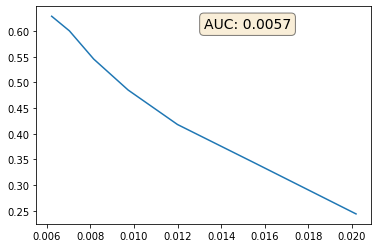

In [16]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(pur[2:], eff[2:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(pur[2:], eff[2:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

Loss 1: 0.03238826245069504 Loss 2: 0.998380184173584
EDGES: True positive: 29786 True: 29820 Positive 30880
CLUSTER: True positive: 7157.0 True: 29820 Positive: 4418414
Loss 1: 0.03371492400765419 Loss 2: 0.9987834095954895
EDGES: True positive: 39653 True: 39720 Positive 40917
CLUSTER: True positive: 6968.0 True: 39720 Positive: 5727722
Loss 1: 0.03964247554540634 Loss 2: 0.9985302686691284
EDGES: True positive: 33020 True: 33098 Positive 34415
CLUSTER: True positive: 7125.0 True: 33098 Positive: 4847843
Loss 1: 0.0368376150727272 Loss 2: 0.9986147880554199
EDGES: True positive: 34819 True: 34914 Positive 35968
CLUSTER: True positive: 7069.0 True: 34914 Positive: 5103098
Loss 1: 0.034479089081287384 Loss 2: 0.9987242817878723
EDGES: True positive: 37968 True: 38032 Positive 39321
CLUSTER: True positive: 6924.0 True: 38032 Positive: 5427422
Loss 1: 0.033777471631765366 Loss 2: 0.9988492727279663
EDGES: True positive: 41022 True: 41080 Positive 42427
CLUSTER: True positive: 6832.0 True

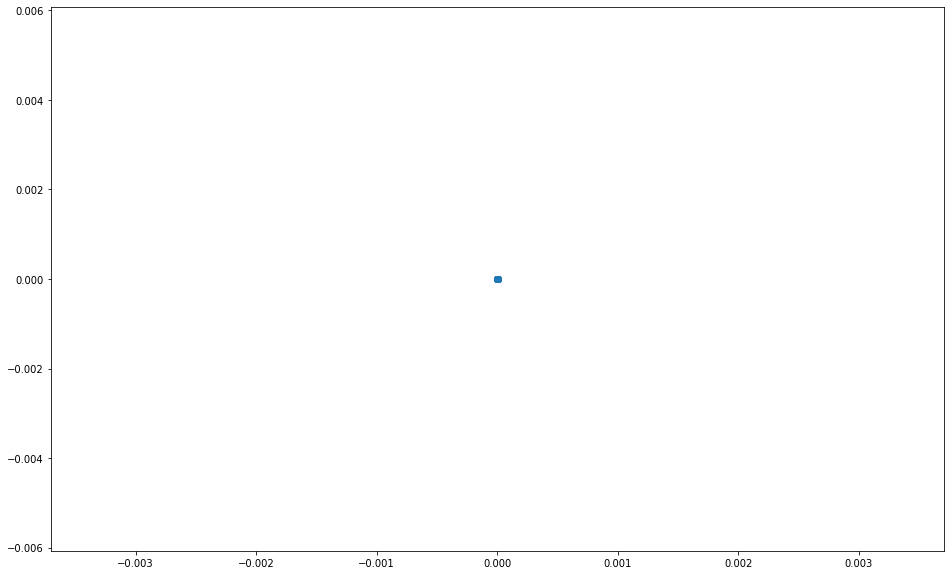

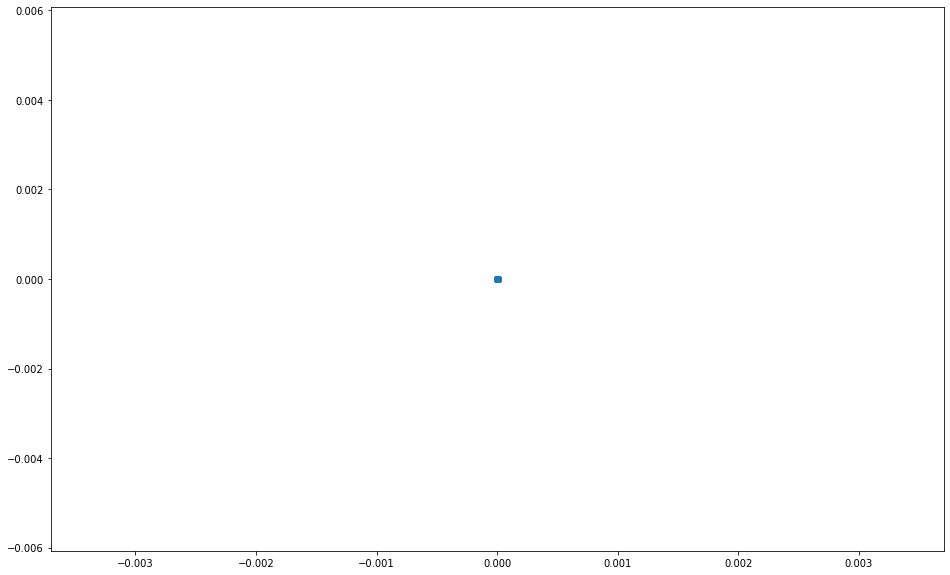

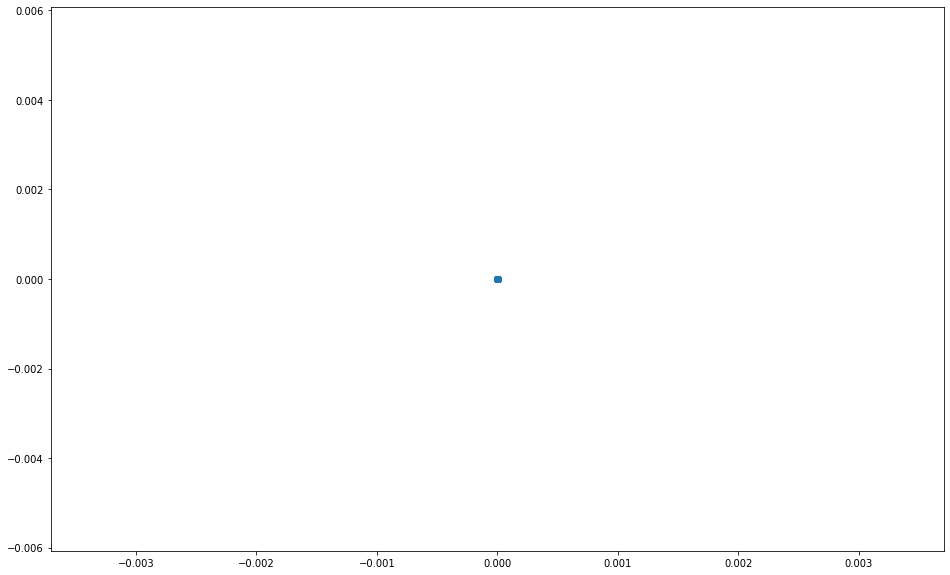

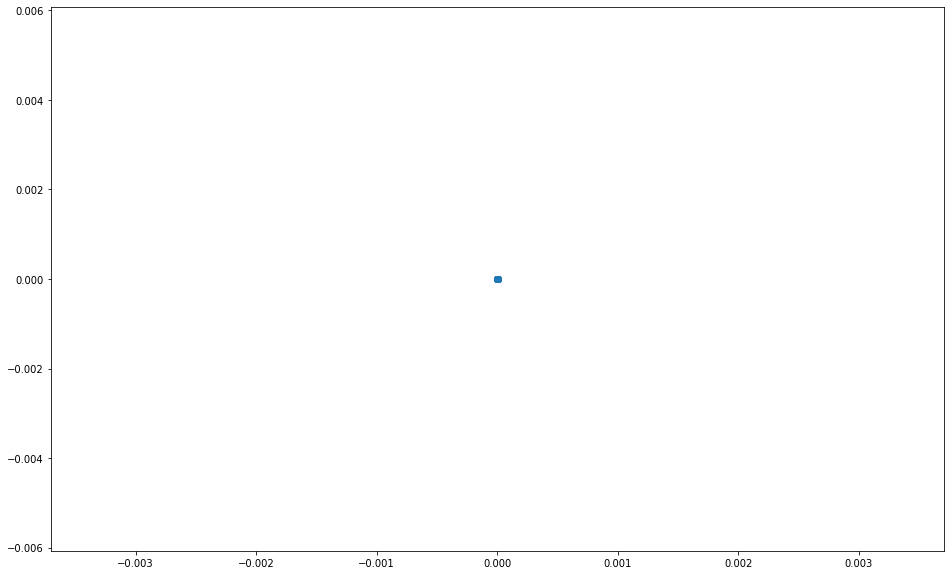

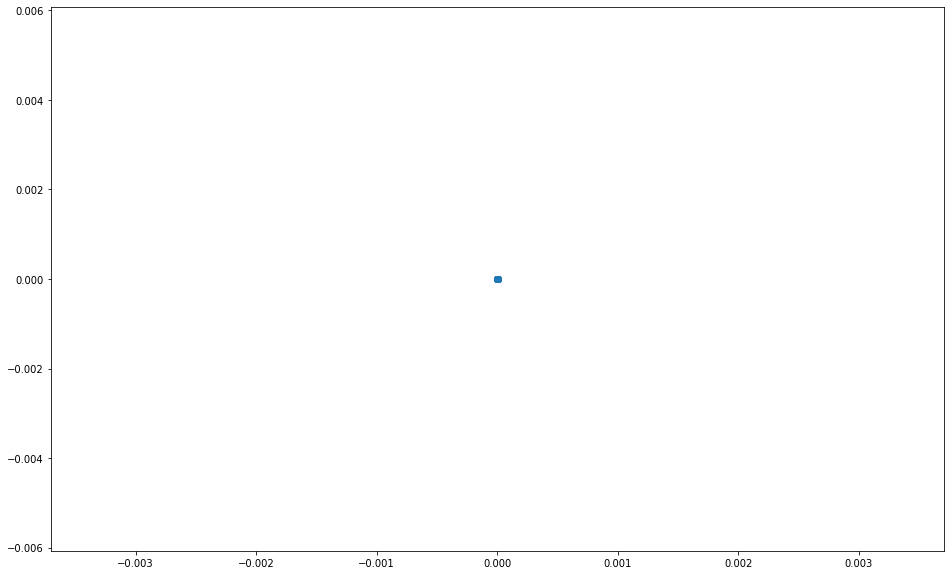

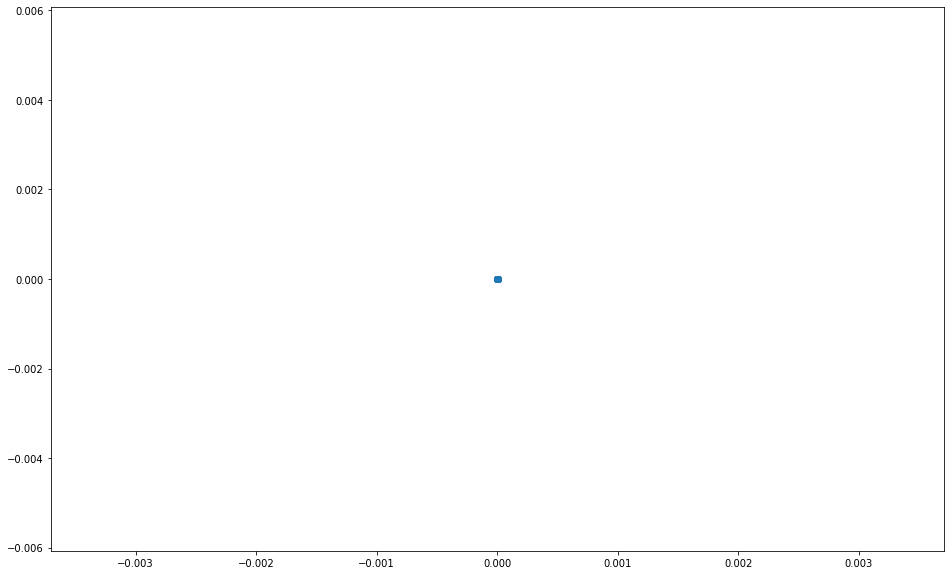

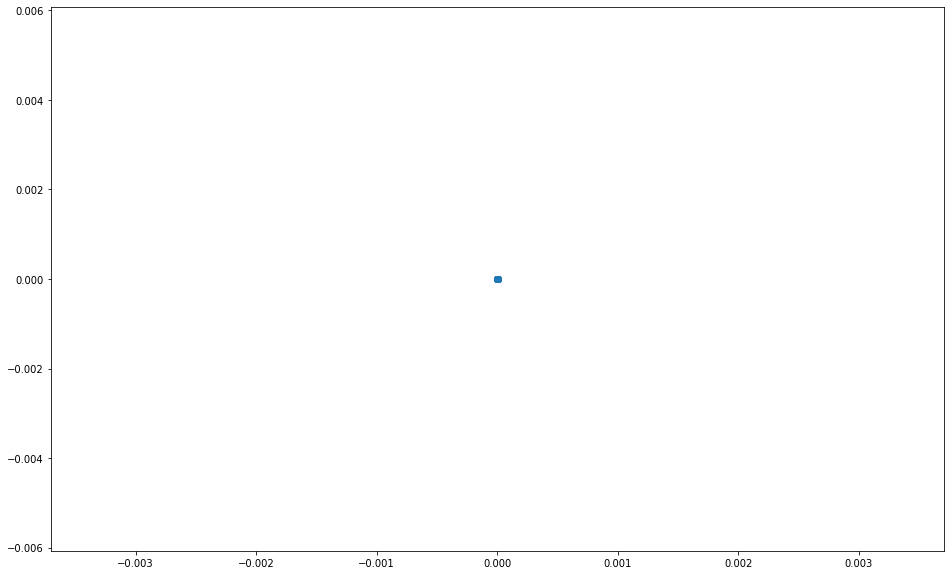

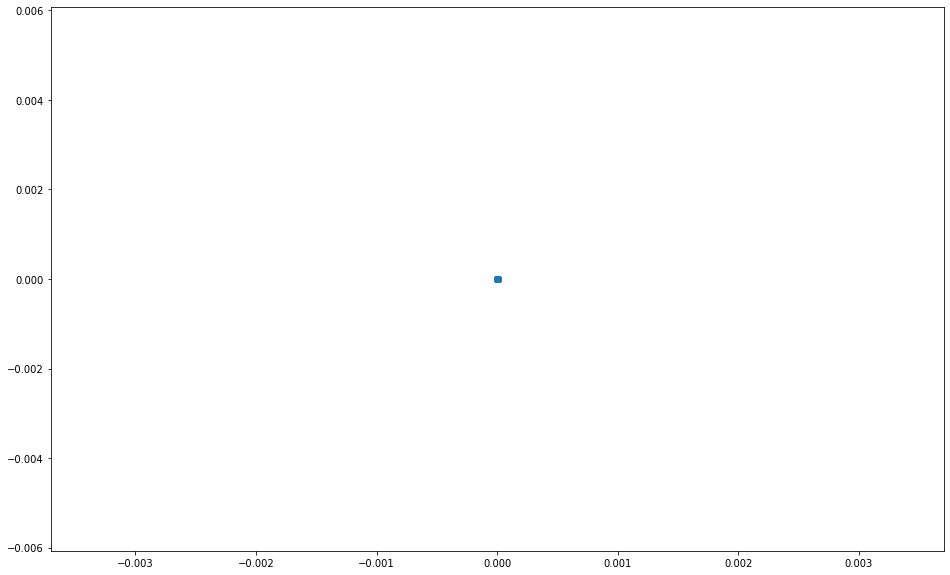

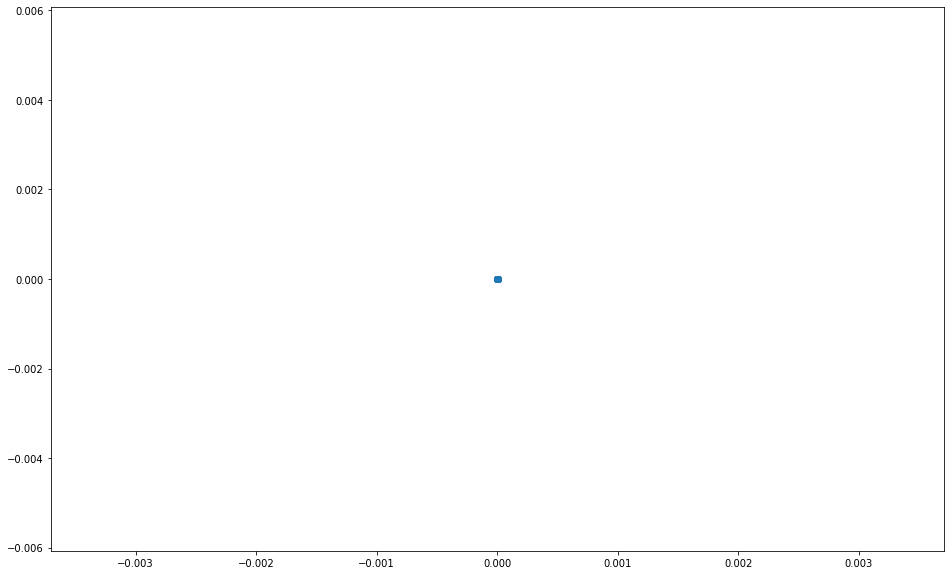

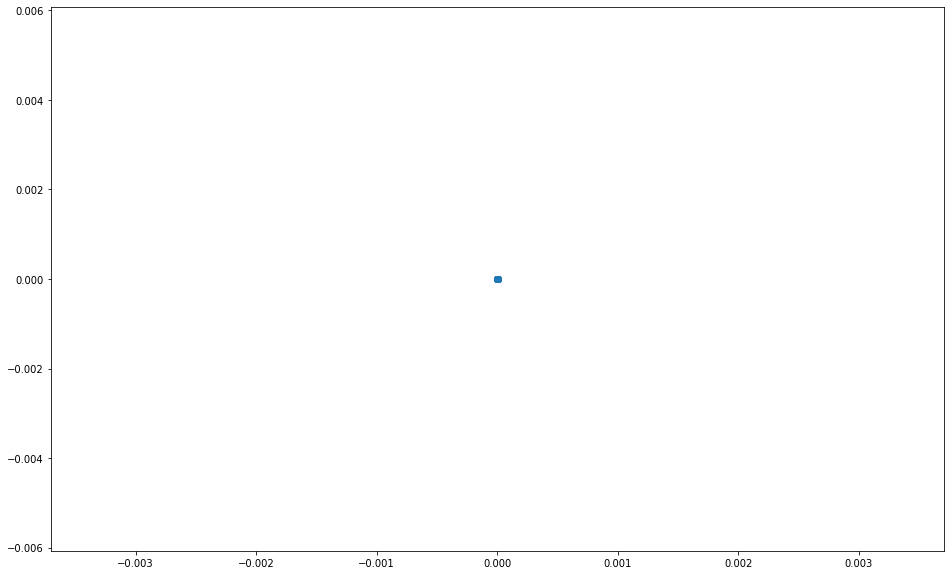

In [58]:
model.eval()
edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

for batch in test_loader:
    data = batch.to(device)
    pred, spatial, e = model(data)

    e_spatial = radius_graph(spatial, r=1, batch=batch.batch, loop=False, max_num_neighbors=1000)

    reference = spatial.index_select(0, e_spatial[1])
    neighbors = spatial.index_select(0, e_spatial[0])

    d = torch.sum((reference - neighbors)**2, dim=-1)

    y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
    y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
    
    
    hinge = y_cluster.float()
    hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  
    
    loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
    loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
    print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
    
    embedded = spatial.cpu().detach().numpy()    
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(embedded)
    #         print("PCA", pca_result)
    plt.figure(figsize=(16,10))
    plt.scatter(pca_result[:,0], pca_result[:,1])

    #Cluster performance
    batch_cpu = batch.pid.cpu()
    pids, counts = np.unique(batch_cpu, return_counts=True)
    cluster_true = (counts * (counts - 1)).sum()

    cluster_true_positive = (y_cluster.float()).sum().item()
    cluster_total_true_positive += cluster_true_positive
    
    cluster_positive = len(e_spatial[0])
    cluster_total_positive += max(cluster_positive, 1)

    cluster_total_true += cluster_true
    
    #Edge performance
    edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
    edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

    edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

    edge_true_positive += (edge_true & edge_positive).sum().item()
    edge_total_true += edge_true.sum().item()
    edge_total_positive += edge_positive.sum().item()

    print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
    print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)
    
    total += len(pred)

edge_acc = edge_correct/total
edge_eff = (edge_true_positive / edge_total_true)
edge_pur = (edge_true_positive / edge_total_positive)

cluster_eff = (cluster_total_true_positive / cluster_total_true)
cluster_pur = (cluster_total_true_positive / cluster_total_positive)

print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))

## GravNet+AGNN

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class GravNet(MessagePassing):

    def __init__(self, in_channels, out_channels, space_dimensions,
                 propagate_dimensions, k=None, r=None, **kwargs):
        super(GravNet, self).__init__(**kwargs)

        if knn_graph is None:
            raise ImportError('`GravNetConv` requires `torch-cluster`.')

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.k = k
        self.r = r

#         self.mlp = make_mlp(out_channels, [out_channels]*3,
#                                 hidden_activation=torch.nn.Tanh,
#                                 output_activation=torch.nn.Tanh,
#                                 layer_norm=True)
        
        self.lin_s = Linear(in_channels, space_dimensions)
        self.lin_flr = Linear(in_channels, propagate_dimensions)
        self.lin_fout = Linear(in_channels + 2*propagate_dimensions,
                               out_channels)

        self.reset_parameters()

    def reset_parameters(self):
        self.lin_s.reset_parameters()
        self.lin_flr.reset_parameters()
        self.lin_fout.reset_parameters()


    def forward(self, x, batch=None):
        """"""
        spatial = self.lin_s(x)
        to_propagate = self.lin_flr(x)

        edge_index = knn_graph(spatial, self.k, batch, loop=False, 
                               flow=self.flow) if self.k is not None else radius_graph(spatial,
                            self.r, batch, loop=False, flow=self.flow)
        
        reference = spatial.index_select(0, edge_index[1])
        neighbors = spatial.index_select(0, edge_index[0])

        distancessq = torch.sum((reference - neighbors)**2, dim=-1)
        
        # Factor 10 gives a better initial spread
        distance_weight = torch.exp(-10. * distancessq)

        prop_feat = self.propagate(edge_index, x=to_propagate,
                                   edge_weight=distance_weight)
        
        combine_linout = self.lin_fout(torch.cat([prop_feat, x], dim=-1))
        
        return combine_linout, spatial, edge_index


    def message(self, x_j, edge_weight):
        return x_j * edge_weight.unsqueeze(1)

    def update(self, aggr_out):
        # aggr_out has shape [N, out_channels]        
        # Step 6: Return new node embeddings.
        return aggr_out
    
    def aggregate(self, inputs, index, ptr=None, dim_size=None):
        if ptr is not None:
            for _ in range(self.node_dim):
                ptr = ptr.unsqueeze(0)
            aggr_mean = segment_csr(inputs, ptr, reduce='mean')
            aggr_max = segment_csr(inputs, ptr, reduce='max')
        else:
            aggr_mean = scatter(inputs, index, dim=self.node_dim,
                                dim_size=dim_size, reduce='mean')
            aggr_max = scatter(inputs, index, dim=self.node_dim,
                               dim_size=dim_size, reduce='max')
        return torch.cat([aggr_mean, aggr_max], dim=-1)

    def __repr__(self):
        if self.k is not None:
            return '{}({}, {}, k={})'.format(self.__class__.__name__,
                                         self.in_channels, self.out_channels,
                                         self.k)
        elif self.r is not None:
            return '{}({}, {}, r={})'.format(self.__class__.__name__,
                                         self.in_channels, self.out_channels,
                                         self.r)

In [9]:
class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation='Tanh',
                 layer_norm=True):
        super(EdgeNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim, hidden_dim, hidden_dim, 1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)

class NodeNetwork(nn.Module):
    """
    A module which computes new node features on the graph.
    For each node, it aggregates the neighbor node features
    (separately on the input and output side), and combines
    them with the node's previous features in a fully-connected
    network to compute the new features.
    """
    def __init__(self, input_dim, output_dim, hidden_activation='Tanh',
                 layer_norm=True):
        super(NodeNetwork, self).__init__()
        self.network = make_mlp(input_dim*3, [output_dim]*4,
                                hidden_activation=hidden_activation,
                                output_activation=hidden_activation,
                                layer_norm=layer_norm)

    def forward(self, x, e, edge_index):
        start, end = edge_index
        # Aggregate edge-weighted incoming/outgoing features
        mi = scatter_add(e[:, None] * x[start], end, dim=0, dim_size=x.shape[0])
        mo = scatter_add(e[:, None] * x[end], start, dim=0, dim_size=x.shape[0])
        node_inputs = torch.cat([mi, mo, x], dim=1)
        return self.network(node_inputs)

class GravAGNN_A(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, k=10, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravAGNN_A, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.grav_network = GravNet(hidden_dim, hidden_dim, space_dimensions,
                 propagate_dimensions, k)
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        self.mid_network = make_mlp(hidden_dim, [hidden_dim]*2,
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(in_channels+hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(in_channels+hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)

    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Apply GravNet layer
        x, _, _ = self.grav_network(x)
        x = self.mid_network(x)
        x, _, _ = self.grav_network(x)
        x = self.mid_network(x)
        x, spatial, edge_index = self.grav_network(x)
       
        distancessq = torch.sum((spatial.index_select(0, edge_index[1]) - spatial.index_select(0, edge_index[0]))**2,  dim=-1)
        
#         print(x.shape, spatial.shape, edge_index.shape)
        # Apply input network to get hidden representation
#         print(x.shape)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
            # Apply node network
            x = self.node_network(x, e, edge_index)
#             print(x.shape)
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
        # Apply final edge network
        return self.edge_network(x, edge_index), spatial,  edge_index, distancessq

class GravAGNN_K(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, k=20, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravAGNN_K, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.grav_network = GravNet(in_channels + hidden_dim, hidden_dim, space_dimensions,
                 propagate_dimensions, k=k)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        x, spatial, edge_index = self.grav_network(x)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
  
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
          
            # Apply GravNet layer
            x, spatial, edge_index = self.grav_network(x)
        
        return self.edge_network(x, edge_index), spatial,  edge_index
    
class GravAGNN_R(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, r=0.2, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravAGNN_R, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.grav_network = GravNet(in_channels + hidden_dim, hidden_dim, space_dimensions,
                 propagate_dimensions, r=r)
        
        self.feat_norm = torch.nn.LayerNorm(hidden_dim)
        self.space_norm = torch.nn.LayerNorm(space_dimensions)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        x, spatial, edge_index = self.grav_network(x)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
  
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
          
            # Apply GravNet layer
            x, spatial, edge_index = self.grav_network(x)
            x = self.feat_norm(x)
            spatial = self.space_norm(spatial)
        
        return self.edge_network(x, edge_index), spatial,  edge_index
    
class GravResGNN_R(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, r=0.2, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravResGNN_R, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(in_channels + hidden_dim, in_channels + hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(in_channels + hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.grav_network = GravNet(in_channels + hidden_dim, in_channels + hidden_dim, space_dimensions,
                 propagate_dimensions, r=r)
        
        self.feat_norm = torch.nn.LayerNorm(in_channels + hidden_dim)
        self.space_norm = torch.nn.LayerNorm(space_dimensions)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        x, spatial, edge_index = self.grav_network(x)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            x_inital = x
            
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
                        
            # Apply GravNet layer
            x, spatial, edge_index = self.grav_network(x)
            x = self.feat_norm(x)
            spatial = self.space_norm(spatial)   
            
            x = x_inital + x
        
        return self.edge_network(x, edge_index), spatial,  edge_index

In [10]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        reference = spatial.index_select(0, e[1])
        neighbors = spatial.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1
        
#         pur = true_positive / total_positive
#         weight = min(1/pur, m_configs["k"]) if pur != 0 else m_configs["k"]
        
        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
        loss = loss_1 + loss_2
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total += len(pred)
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)

        reference = spatial.index_select(0, e[1])
        neighbors = spatial.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1  
#         pur = true_positive / total_positive
#         weight = min(1/pur, m_configs["k"]) if pur != 0 else m_configs["k"]
        
        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        print("Hinge sum:", hinge.sum().item())
        print("Hinge len:", len(hinge))
        loss = loss_1 + loss_2
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        true_positive += (true & positive).sum().item()
        total_positive += max(positive.sum().item(), 1)
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total_true += max(true.sum().item(), 1)
        
        print("True positive:", (true & positive).sum().item(), "True:", true.sum().item(), "Positive", positive.sum().item())
        
        total += len(pred)

    acc = correct/total
    eff = (true_positive / total_true)
    pur = (true_positive / total_positive)
        
    return acc, eff, pur, total_loss

In [11]:
m_configs = {"in_channels": 3, "out_channels": 32, "space_dimensions": 8, "propagate_dimensions": 20, "r": 0.8, "hidden_dim": 64, "n_graph_iters": 6}
model = GravResGNN_R(**m_configs).to(device)
wandb.init(project="GravNet", group="GravResAGNN", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)
ep = 0
best_loss = None

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [60]:
torch.cuda.empty_cache()

In [13]:
weight = 5
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    acc, train_loss = train(model, train_loader, optimizer)
    print("Training loss:", train_loss)

    model.eval()
    acc, eff, pur, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "val_acc": acc, "val_pur": pur, "val_eff": eff, "lr": scheduler._last_lr[0]})
    
    if (best_loss is None) or val_loss < best_loss: 
        best_loss = val_loss
        save_model(epoch, model, optimizer, scheduler, val_loss, 'gravResAGNN.tar')

    print('Epoch: {}, Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, acc, pur, eff, val_loss, scheduler._last_lr[0], tt()-tic))

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Training loss: 12.428456539288163
Loss 1: 0.021412964910268784 Loss 2: 0.0031347444746643305
Hinge sum: -196094.0
Hinge len: 196382
True positive: 0 True: 144 Positive 0
Loss 1: 0.02585815079510212 Loss 2: 0.004631735850125551
Hinge sum: -133640.0
Hinge len: 133980
True positive: 0 True: 170 Positive 0
Loss 1: 0.028481662273406982 Loss 2: 0.010393734090030193
Hinge sum: -193306.0
Hinge len: 193938
True positive: 0 True: 316 Positive 0
Loss 1: 0.02373003400862217 Loss 2: 0.002507518045604229
Hinge sum: -170756.0
Hinge len: 171138
True positive: 0 True: 191 Positive 0
Loss 1: 0.024024905636906624 Loss 2: 0.0038086276035755873
Hinge sum: -188991.0
Hinge len: 189585
True positive: 0 True: 297 Positive 0
Loss 1: 0.02960861101746559 Loss 2: 0.005373883061110973
Hinge sum: -176221.0
Hinge len: 176843
True positive: 0 True: 311 Positive 0
Loss 1: 0.022431321442127228 Loss 2: 0.0030876710079610348
Hinge sum: -198627.0
Hinge len: 199019
True positive: 0 True: 196 Positive 0
Loss 1: 0.02517049014

Loss 1: 0.010060720145702362 Loss 2: 0.0018801976693794131
Hinge sum: -196107.0
Hinge len: 196383
True positive: 117 True: 138 Positive 1027
Loss 1: 0.011660443618893623 Loss 2: 0.003874785965308547
Hinge sum: -176287.0
Hinge len: 176847
True positive: 280 True: 280 Positive 1061
Loss 1: 0.010243785567581654 Loss 2: 0.0019613411277532578
Hinge sum: -198659.0
Hinge len: 199023
True positive: 130 True: 182 Positive 560
Epoch: 6, Accuracy: 0.9962, Purity: 0.2242, Efficiency: 0.8842, Loss: 0.1316, LR: 0.001 in time 27.38136887550354
Training loss: 1.5139261381700635
Loss 1: 0.010963632725179195 Loss 2: 0.0015898550627753139
Hinge sum: -199177.0
Hinge len: 199681
True positive: 245 True: 252 Positive 1072
Loss 1: 0.010590624064207077 Loss 2: 0.001985994866117835
Hinge sum: -198641.0
Hinge len: 199021
True positive: 167 True: 190 Positive 1037
Loss 1: 0.011744698509573936 Loss 2: 0.003460342762991786
Hinge sum: -176295.0
Hinge len: 176847
True positive: 276 True: 276 Positive 1056
Loss 1: 0.

Training loss: 2.8494340386241674
Loss 1: 0.01531168445944786 Loss 2: 0.0031554203014820814
Hinge sum: -193632.0
Hinge len: 194208
True positive: 160 True: 288 Positive 906
Loss 1: 0.019389597699046135 Loss 2: 0.0034023355692625046
Hinge sum: -133529.0
Hinge len: 133971
True positive: 164 True: 221 Positive 879
Loss 1: 0.016029497608542442 Loss 2: 0.0023312594275921583
Hinge sum: -186865.0
Hinge len: 187523
True positive: 212 True: 329 Positive 790
Loss 1: 0.015613707713782787 Loss 2: 0.0037048044614493847
Hinge sum: -193203.0
Hinge len: 193917
True positive: 275 True: 357 Positive 1131
Loss 1: 0.01576610654592514 Loss 2: 0.004282934591174126
Hinge sum: -198507.0
Hinge len: 199001
True positive: 138 True: 247 Positive 853
Loss 1: 0.017322339117527008 Loss 2: 0.003993935417383909
Hinge sum: -198885.0
Hinge len: 199663
True positive: 219 True: 389 Positive 856
Loss 1: 0.020760593935847282 Loss 2: 0.005613177549093962
Hinge sum: -170337.0
Hinge len: 171105
True positive: 248 True: 384 Pos

Loss 1: 0.008587950840592384 Loss 2: 0.003042346565052867
Hinge sum: -170728.0
Hinge len: 171134
True positive: 162 True: 203 Positive 345
Loss 1: 0.010988831520080566 Loss 2: 0.0020551197230815887
Hinge sum: -133582.0
Hinge len: 133974
True positive: 166 True: 196 Positive 274
Loss 1: 0.007100420538336039 Loss 2: 0.002037312602624297
Hinge sum: -193878.0
Hinge len: 194234
True positive: 152 True: 178 Positive 321
Loss 1: 0.00872178003191948 Loss 2: 0.0014570798957720399
Hinge sum: -186973.0
Hinge len: 187535
True positive: 239 True: 281 Positive 355
Loss 1: 0.01672140136361122 Loss 2: 0.0060101645067334175
Hinge sum: -176175.0
Hinge len: 176839
True positive: 276 True: 332 Positive 999
Epoch: 17, Accuracy: 0.9979, Purity: 0.3748, Efficiency: 0.8157, Loss: 0.1398, LR: 0.0003 in time 27.25644850730896
Training loss: 1.465150548145175
Loss 1: 0.019530558958649635 Loss 2: 0.005412985570728779
Hinge sum: -188862.0
Hinge len: 189574
True positive: 184 True: 356 Positive 642
Loss 1: 0.021019

Epoch: 22, Accuracy: 0.9980, Purity: 0.3874, Efficiency: 0.8825, Loss: 0.1312, LR: 0.0003 in time 27.24595284461975
Training loss: 1.2230174574069679
Loss 1: 0.005197393707931042 Loss 2: 0.0015564291970804334
Hinge sum: -193894.0
Hinge len: 194234
True positive: 169 True: 170 Positive 337
Loss 1: 0.017813609912991524 Loss 2: 0.0057518635876476765
Hinge sum: -188851.0
Hinge len: 189577
True positive: 277 True: 363 Positive 738
Loss 1: 0.006965980865061283 Loss 2: 0.0020046907011419535
Hinge sum: -198655.0
Hinge len: 199023
True positive: 182 True: 184 Positive 484
Loss 1: 0.011633881367743015 Loss 2: 0.0035505725536495447
Hinge sum: -193343.0
Hinge len: 193939
True positive: 274 True: 298 Positive 749
Loss 1: 0.005728623829782009 Loss 2: 0.0013251624768599868
Hinge sum: -186997.0
Hinge len: 187537
True positive: 258 True: 270 Positive 268
Loss 1: 0.008763980120420456 Loss 2: 0.002813150407746434
Hinge sum: -170715.0
Hinge len: 171135
True positive: 184 True: 210 Positive 463
Loss 1: 0.0

Loss 1: 0.005280263256281614 Loss 2: 0.0014832528540864587
Hinge sum: -176295.0
Hinge len: 176847
True positive: 272 True: 276 Positive 492
Loss 1: 0.006214809138327837 Loss 2: 0.0014041051035746932
Hinge sum: -198659.0
Hinge len: 199023
True positive: 165 True: 182 Positive 457
Loss 1: 0.00739726796746254 Loss 2: 0.001671590725891292
Hinge sum: -188991.0
Hinge len: 189585
True positive: 276 True: 297 Positive 484
Loss 1: 0.0033880346454679966 Loss 2: 0.000977722811512649
Hinge sum: -133627.0
Hinge len: 133979
True positive: 173 True: 176 Positive 192
Loss 1: 0.0064384713768959045 Loss 2: 0.0011267345398664474
Hinge sum: -193379.0
Hinge len: 193941
True positive: 269 True: 281 Positive 554
Loss 1: 0.006696724332869053 Loss 2: 0.0013179845409467816
Hinge sum: -170737.0
Hinge len: 171137
True positive: 167 True: 200 Positive 297
Loss 1: 0.0026468553114682436 Loss 2: 0.0010719617130234838
Hinge sum: -187023.0
Hinge len: 187539
True positive: 257 True: 258 Positive 268
Epoch: 28, Accuracy:

Hinge sum: -193347.0
Hinge len: 193939
True positive: 263 True: 296 Positive 461
Loss 1: 0.0030175389256328344 Loss 2: 0.0012116169091314077
Hinge sum: -133624.0
Hinge len: 133976
True positive: 176 True: 176 Positive 198
Loss 1: 0.005472216289490461 Loss 2: 0.0016295105451717973
Hinge sum: -198659.0
Hinge len: 199023
True positive: 162 True: 182 Positive 440
Loss 1: 0.007951710373163223 Loss 2: 0.0012287289137020707
Hinge sum: -188936.0
Hinge len: 189580
True positive: 296 True: 322 Positive 523
Epoch: 33, Accuracy: 0.9992, Purity: 0.6074, Efficiency: 0.9108, Loss: 0.0671, LR: 0.0003 in time 27.435049533843994
Training loss: 0.781277344096452
Loss 1: 0.002966688247397542 Loss 2: 0.0009243431268259883
Hinge sum: -133639.0
Hinge len: 133979
True positive: 169 True: 170 Positive 187
Loss 1: 0.007543620653450489 Loss 2: 0.0022416634019464254
Hinge sum: -193379.0
Hinge len: 193941
True positive: 238 True: 281 Positive 468
Loss 1: 0.004615339450538158 Loss 2: 0.001254579983651638
Hinge sum:

Training loss: 0.6210241802036762
Loss 1: 0.0034374019596725702 Loss 2: 0.0008328120457008481
Hinge sum: -199191.0
Hinge len: 199683
True positive: 245 True: 246 Positive 365
Loss 1: 0.004807918332517147 Loss 2: 0.0010104913963004947
Hinge sum: -196046.0
Hinge len: 196382
True positive: 141 True: 168 Positive 259
Loss 1: 0.007042333483695984 Loss 2: 0.000663863611407578
Hinge sum: -188991.0
Hinge len: 189585
True positive: 276 True: 297 Positive 454
Loss 1: 0.00518130324780941 Loss 2: 0.0016184997512027621
Hinge sum: -198659.0
Hinge len: 199023
True positive: 182 True: 182 Positive 471
Loss 1: 0.003275673370808363 Loss 2: 0.0010096273617818952
Hinge sum: -193916.0
Hinge len: 194238
True positive: 155 True: 161 Positive 250
Loss 1: 0.007164185866713524 Loss 2: 0.0021931363735347986
Hinge sum: -170730.0
Hinge len: 171136
True positive: 164 True: 203 Positive 295
Loss 1: 0.006584171671420336 Loss 2: 0.001066525117494166
Hinge sum: -193361.0
Hinge len: 193939
True positive: 265 True: 289 P

Loss 1: 0.007147576659917831 Loss 2: 0.0009174101869575679
Hinge sum: -188976.0
Hinge len: 189584
True positive: 283 True: 304 Positive 458
Loss 1: 0.003871249733492732 Loss 2: 0.0007157871150411665
Hinge sum: -199193.0
Hinge len: 199683
True positive: 233 True: 245 Positive 337
Loss 1: 0.0022819326259195805 Loss 2: 0.0004005769151262939
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 260
Loss 1: 0.004689859692007303 Loss 2: 0.0009232263546437025
Hinge sum: -176291.0
Hinge len: 176847
True positive: 269 True: 278 Positive 402
Loss 1: 0.003350792918354273 Loss 2: 0.007361465133726597
Hinge sum: -193916.0
Hinge len: 194238
True positive: 161 True: 161 Positive 257
Loss 1: 0.003736071288585663 Loss 2: 0.001018834300339222
Hinge sum: -133613.0
Hinge len: 133977
True positive: 176 True: 182 Positive 224
Loss 1: 0.00447283498942852 Loss 2: 0.0010892745340242982
Hinge sum: -196028.0
Hinge len: 196378
True positive: 150 True: 175 Positive 262
Epoch: 44, Accuracy: 0

Loss 1: 0.002364550717175007 Loss 2: 0.0007497624028474092
Hinge sum: -133640.0
Hinge len: 133980
True positive: 170 True: 170 Positive 198
Loss 1: 0.0019048041431233287 Loss 2: 0.0003810872440226376
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 258
Loss 1: 0.003772224998101592 Loss 2: 0.001025649718940258
Hinge sum: -199193.0
Hinge len: 199683
True positive: 245 True: 245 Positive 412
Epoch: 49, Accuracy: 0.9991, Purity: 0.5797, Efficiency: 0.9636, Loss: 0.0529, LR: 0.0003 in time 27.339425086975098
Training loss: 0.5109775902237743
Loss 1: 0.002393418224528432 Loss 2: 0.0005555474781431258
Hinge sum: -133640.0
Hinge len: 133980
True positive: 170 True: 170 Positive 203
Loss 1: 0.004575028084218502 Loss 2: 0.0011308010434731841
Hinge sum: -176280.0
Hinge len: 176844
True positive: 272 True: 282 Positive 396
Loss 1: 0.0024510708171874285 Loss 2: 0.0008514621877111495
Hinge sum: -196111.0
Hinge len: 196383
True positive: 136 True: 136 Positive 207
Loss 1: 

Training loss: 0.4857113768812269
Loss 1: 0.0030242870561778545 Loss 2: 0.000973448739387095
Hinge sum: -196109.0
Hinge len: 196383
True positive: 137 True: 137 Positive 265
Loss 1: 0.006373513489961624 Loss 2: 0.0010240966221317649
Hinge sum: -170756.0
Hinge len: 171138
True positive: 158 True: 191 Positive 247
Loss 1: 0.005630007013678551 Loss 2: 0.001219170051626861
Hinge sum: -193379.0
Hinge len: 193941
True positive: 264 True: 281 Positive 476
Loss 1: 0.0030381781980395317 Loss 2: 0.0006435681716538966
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 278
Loss 1: 0.005167051218450069 Loss 2: 0.0014690307434648275
Hinge sum: -198657.0
Hinge len: 199023
True positive: 182 True: 183 Positive 470
Loss 1: 0.00411561131477356 Loss 2: 0.0008307913667522371
Hinge sum: -176291.0
Hinge len: 176847
True positive: 274 True: 278 Positive 419
Loss 1: 0.00757128931581974 Loss 2: 0.0008915009093470871
Hinge sum: -188957.0
Hinge len: 189583
True positive: 292 True: 313 P

Loss 1: 0.004407188389450312 Loss 2: 0.000928912777453661
Hinge sum: -176295.0
Hinge len: 176847
True positive: 274 True: 276 Positive 441
Loss 1: 0.002672889968380332 Loss 2: 0.0004681068239733577
Hinge sum: -133631.0
Hinge len: 133979
True positive: 170 True: 174 Positive 211
Loss 1: 0.001984443049877882 Loss 2: 0.0002732428256422281
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 268
Loss 1: 0.005422689951956272 Loss 2: 0.0011869913432747126
Hinge sum: -193379.0
Hinge len: 193941
True positive: 274 True: 281 Positive 511
Loss 1: 0.00298644439317286 Loss 2: 0.0007460173219442368
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 278
Loss 1: 0.0028911633417010307 Loss 2: 0.000813663995359093
Hinge sum: -196111.0
Hinge len: 196383
True positive: 132 True: 136 Positive 237
Loss 1: 0.0074175018817186356 Loss 2: 0.001172102172859013
Hinge sum: -188991.0
Hinge len: 189585
True positive: 276 True: 297 Positive 478
Epoch: 60, Accuracy: 0

Loss 1: 0.003079676767811179 Loss 2: 0.0008061174885369837
Hinge sum: -199193.0
Hinge len: 199683
True positive: 237 True: 245 Positive 330
Loss 1: 0.005055003799498081 Loss 2: 0.00113062490709126
Hinge sum: -198644.0
Hinge len: 199022
True positive: 159 True: 189 Positive 342
Loss 1: 0.002558834617957473 Loss 2: 0.000729684135876596
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 245
Epoch: 65, Accuracy: 0.9994, Purity: 0.6637, Efficiency: 0.9412, Loss: 0.0491, LR: 0.0003 in time 27.47239923477173
Training loss: 0.43688970198854804
Loss 1: 0.006035021040588617 Loss 2: 0.0010886969976127148
Hinge sum: -193379.0
Hinge len: 193941
True positive: 250 True: 281 Positive 475
Loss 1: 0.001802716520614922 Loss 2: 0.00030909874476492405
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 264
Loss 1: 0.0030597562436014414 Loss 2: 0.0008434887859039009
Hinge sum: -199193.0
Hinge len: 199683
True positive: 245 True: 245 Positive 367
Loss 1: 0.

Training loss: 0.46120688947848976
Loss 1: 0.0028222904074937105 Loss 2: 0.0005581466248258948
Hinge sum: -199193.0
Hinge len: 199683
True positive: 240 True: 245 Positive 316
Loss 1: 0.0025712240021675825 Loss 2: 0.0006156858871690929
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 239
Loss 1: 0.004398066084831953 Loss 2: 0.0011979590635746717
Hinge sum: -176274.0
Hinge len: 176846
True positive: 276 True: 286 Positive 402
Loss 1: 0.007312871050089598 Loss 2: 0.0012294865446165204
Hinge sum: -188991.0
Hinge len: 189585
True positive: 265 True: 297 Positive 403
Loss 1: 0.0062754773534834385 Loss 2: 0.0010156475473195314
Hinge sum: -170756.0
Hinge len: 171138
True positive: 159 True: 191 Positive 273
Loss 1: 0.0019505067029967904 Loss 2: 0.00040722411358729005
Hinge sum: -133640.0
Hinge len: 133980
True positive: 170 True: 170 Positive 182
Loss 1: 0.005822303704917431 Loss 2: 0.0011338741751387715
Hinge sum: -193379.0
Hinge len: 193941
True positive: 242 Tru

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3331, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-13-6da537d19ab8>", line 6, in <module>
    acc, train_loss = train(model, train_loader, optimizer)
  File "<ipython-input-10-4179edee6b6c>", line 27, in train
    loss.backward()
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/torch/tensor.py", line 198, in backward
    torch.autograd.backward(self, gradient, retain_graph, create_graph)
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/torch/autograd/__init__.py", line 100, in backward
    allow_unreachable=True)  # allow_unreachable flag
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line

KeyboardInterrupt: 

## GravAGNN

Define GravNet model

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class GravNet(MessagePassing):

    def __init__(self, in_channels, out_channels, space_dimensions,
                 propagate_dimensions, k=None, r=None, **kwargs):
        super(GravNet, self).__init__(**kwargs)

        if knn_graph is None:
            raise ImportError('`GravNetConv` requires `torch-cluster`.')

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.k = k
        self.r = r

#         self.mlp = make_mlp(out_channels, [out_channels]*3,
#                                 hidden_activation=torch.nn.Tanh,
#                                 output_activation=torch.nn.Tanh,
#                                 layer_norm=True)
        
        self.lin_s = Linear(in_channels, space_dimensions)
        self.lin_flr = Linear(in_channels, propagate_dimensions)
        self.lin_fout = Linear(in_channels + 2*propagate_dimensions,
                               out_channels)

        self.reset_parameters()

    def reset_parameters(self):
        self.lin_s.reset_parameters()
        self.lin_flr.reset_parameters()
        self.lin_fout.reset_parameters()


    def forward(self, x, batch=None):
        """"""
        spatial = self.lin_s(x)
        to_propagate = self.lin_flr(x)

        edge_index = knn_graph(spatial, self.k, batch, loop=False, 
                               flow=self.flow) if self.k is not None else radius_graph(spatial,
                            self.r, batch, loop=False, flow=self.flow)
        
        reference = spatial.index_select(0, edge_index[1])
        neighbors = spatial.index_select(0, edge_index[0])

        distancessq = torch.sum((reference - neighbors)**2, dim=-1)
        
        # Factor 10 gives a better initial spread
        distance_weight = torch.exp(-10. * distancessq)

        prop_feat = self.propagate(edge_index, x=to_propagate,
                                   edge_weight=distance_weight)
        
        combine_linout = self.lin_fout(torch.cat([prop_feat, x], dim=-1))
        
        return combine_linout, spatial, edge_index


    def message(self, x_j, edge_weight):
        return x_j * edge_weight.unsqueeze(1)

    def update(self, aggr_out):
        # aggr_out has shape [N, out_channels]        
        # Step 6: Return new node embeddings.
        return aggr_out
    
    def aggregate(self, inputs, index, ptr=None, dim_size=None):
        if ptr is not None:
            for _ in range(self.node_dim):
                ptr = ptr.unsqueeze(0)
            aggr_mean = segment_csr(inputs, ptr, reduce='mean')
            aggr_max = segment_csr(inputs, ptr, reduce='max')
        else:
            aggr_mean = scatter(inputs, index, dim=self.node_dim,
                                dim_size=dim_size, reduce='mean')
            aggr_max = scatter(inputs, index, dim=self.node_dim,
                               dim_size=dim_size, reduce='max')
        return torch.cat([aggr_mean, aggr_max], dim=-1)

    def __repr__(self):
        if self.k is not None:
            return '{}({}, {}, k={})'.format(self.__class__.__name__,
                                         self.in_channels, self.out_channels,
                                         self.k)
        elif self.r is not None:
            return '{}({}, {}, r={})'.format(self.__class__.__name__,
                                         self.in_channels, self.out_channels,
                                         self.r)

In [9]:
class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation='Tanh',
                 layer_norm=True):
        super(EdgeNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim, hidden_dim, hidden_dim, 1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)

class NodeNetwork(nn.Module):
    """
    A module which computes new node features on the graph.
    For each node, it aggregates the neighbor node features
    (separately on the input and output side), and combines
    them with the node's previous features in a fully-connected
    network to compute the new features.
    """
    def __init__(self, input_dim, output_dim, hidden_activation='Tanh',
                 layer_norm=True):
        super(NodeNetwork, self).__init__()
        self.network = make_mlp(input_dim*3, [output_dim]*4,
                                hidden_activation=hidden_activation,
                                output_activation=hidden_activation,
                                layer_norm=layer_norm)

    def forward(self, x, e, edge_index):
        start, end = edge_index
        # Aggregate edge-weighted incoming/outgoing features
        mi = scatter_add(e[:, None] * x[start], end, dim=0, dim_size=x.shape[0])
        mo = scatter_add(e[:, None] * x[end], start, dim=0, dim_size=x.shape[0])
        node_inputs = torch.cat([mi, mo, x], dim=1)
        return self.network(node_inputs)

class GravAGNN_A(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, k=10, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravAGNN_A, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.grav_network = GravNet(hidden_dim, hidden_dim, space_dimensions,
                 propagate_dimensions, k)
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        self.mid_network = make_mlp(hidden_dim, [hidden_dim]*2,
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(in_channels+hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(in_channels+hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)

    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Apply GravNet layer
        x, _, _ = self.grav_network(x)
        x = self.mid_network(x)
        x, _, _ = self.grav_network(x)
        x = self.mid_network(x)
        x, spatial, edge_index = self.grav_network(x)
       
        distancessq = torch.sum((spatial.index_select(0, edge_index[1]) - spatial.index_select(0, edge_index[0]))**2,  dim=-1)
        
#         print(x.shape, spatial.shape, edge_index.shape)
        # Apply input network to get hidden representation
#         print(x.shape)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
            # Apply node network
            x = self.node_network(x, e, edge_index)
#             print(x.shape)
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
        # Apply final edge network
        return self.edge_network(x, edge_index), spatial,  edge_index, distancessq

class GravAGNN_K(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, k=20, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravAGNN_K, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.grav_network = GravNet(in_channels + hidden_dim, hidden_dim, space_dimensions,
                 propagate_dimensions, k=k)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        x, spatial, edge_index = self.grav_network(x)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
  
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
          
            # Apply GravNet layer
            x, spatial, edge_index = self.grav_network(x)
        
        return self.edge_network(x, edge_index), spatial,  edge_index
    
class GravAGNN_R(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, r=0.2, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravAGNN_R, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.grav_network = GravNet(in_channels + hidden_dim, hidden_dim, space_dimensions,
                 propagate_dimensions, r=r)
        
        self.feat_norm = torch.nn.LayerNorm(hidden_dim)
        self.space_norm = torch.nn.LayerNorm(space_dimensions)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        x, spatial, edge_index = self.grav_network(x)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
  
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
          
            # Apply GravNet layer
            x, spatial, edge_index = self.grav_network(x)
            x = self.feat_norm(x)
            spatial = self.space_norm(spatial)
        
        return self.edge_network(x, edge_index), spatial,  edge_index
    
class GravResGNN_R(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, in_channels=3, out_channels=16, space_dimensions=4, 
                 propagate_dimensions=10, r=0.2, hidden_dim=8, n_graph_iters=3,
                 hidden_activation=torch.nn.Tanh, layer_norm=True):
        super(GravResGNN_R, self).__init__()
        self.n_graph_iters = n_graph_iters
        # Setup the input network
        self.input_network = make_mlp(in_channels, [hidden_dim],
                                      output_activation=hidden_activation,
                                      layer_norm=layer_norm)
        # Setup the edge network
        self.edge_network = EdgeNetwork(in_channels + hidden_dim, in_channels + hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup the node layers
        self.node_network = NodeNetwork(in_channels + hidden_dim, hidden_dim,
                                        hidden_activation, layer_norm=layer_norm)
        # Setup gravnet
        self.grav_network = GravNet(in_channels + hidden_dim, in_channels + hidden_dim, space_dimensions,
                 propagate_dimensions, r=r)
        
        self.feat_norm = torch.nn.LayerNorm(in_channels + hidden_dim)
        self.space_norm = torch.nn.LayerNorm(space_dimensions)
        
    def forward(self, inputs):
        """Apply forward pass of the model"""
        x = inputs.x
#         print(x.shape)
        x = self.input_network(x)
        # Shortcut connect the inputs onto the hidden representation
        x = torch.cat([x, inputs.x], dim=-1)
#         print(x.shape)
        x, spatial, edge_index = self.grav_network(x)
        
        # Loop over iterations of edge and node networks
        for i in range(self.n_graph_iters):
            x_inital = x
            
            # Apply edge network
            e = torch.sigmoid(self.edge_network(x, edge_index))
        
            # Apply node network
            x = self.node_network(x, e, edge_index)
            
            # Shortcut connect the inputs onto the hidden representation
            x = torch.cat([x, inputs.x], dim=-1)
                        
            # Apply GravNet layer
            x, spatial, edge_index = self.grav_network(x)
            x = self.feat_norm(x)
            spatial = self.space_norm(spatial)   
            
            x = x_inital + x
        
        return self.edge_network(x, edge_index), spatial,  edge_index

In [10]:
sig = torch.nn.Sigmoid()

def train(model, train_loader, optimizer):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred, spatial, e = model(data)
        
        reference = spatial.index_select(0, e[1])
        neighbors = spatial.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1
        
#         pur = true_positive / total_positive
#         weight = min(1/pur, m_configs["k"]) if pur != 0 else m_configs["k"]
        
        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
        loss = loss_1 + loss_2
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total += len(pred)
    acc = correct/total
    return acc, total_loss

def evaluate(model, test_loader):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)

        reference = spatial.index_select(0, e[1])
        neighbors = spatial.index_select(0, e[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        y = batch.pid[e[0]] == batch.pid[e[1]]
        hinge = y.float()
        hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1  
#         pur = true_positive / total_positive
#         weight = min(1/pur, m_configs["k"]) if pur != 0 else m_configs["k"]
        
        loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(weight))
        loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
        print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
        print("Hinge sum:", hinge.sum().item())
        print("Hinge len:", len(hinge))
        loss = loss_1 + loss_2
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        true_positive += (true & positive).sum().item()
        total_positive += max(positive.sum().item(), 1)
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total_true += max(true.sum().item(), 1)
        
        print("True positive:", (true & positive).sum().item(), "True:", true.sum().item(), "Positive", positive.sum().item())
        
        total += len(pred)

    acc = correct/total
    eff = (true_positive / total_true)
    pur = (true_positive / total_positive)
        
    return acc, eff, pur, total_loss

In [11]:
m_configs = {"in_channels": 3, "out_channels": 32, "space_dimensions": 8, "propagate_dimensions": 20, "r": 0.8, "hidden_dim": 64, "n_graph_iters": 6}
model = GravResGNN_R(**m_configs).to(device)
wandb.init(project="GravNet", group="GravResAGNN", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)
ep = 0
best_loss = None

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


In [60]:
torch.cuda.empty_cache()

In [13]:
weight = 5
for epoch in range(100):
    tic = tt()
    ep += 1  
    model.train()
    acc, train_loss = train(model, train_loader, optimizer)
    print("Training loss:", train_loss)

    model.eval()
    acc, eff, pur, val_loss = evaluate(model, test_loader)
    scheduler.step(val_loss)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "val_acc": acc, "val_pur": pur, "val_eff": eff, "lr": scheduler._last_lr[0]})
    
    if (best_loss is None) or val_loss < best_loss: 
        best_loss = val_loss
        save_model(epoch, model, optimizer, scheduler, val_loss, 'gravResAGNN.tar')

    print('Epoch: {}, Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(ep, acc, pur, eff, val_loss, scheduler._last_lr[0], tt()-tic))

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable


Training loss: 12.428456539288163
Loss 1: 0.021412964910268784 Loss 2: 0.0031347444746643305
Hinge sum: -196094.0
Hinge len: 196382
True positive: 0 True: 144 Positive 0
Loss 1: 0.02585815079510212 Loss 2: 0.004631735850125551
Hinge sum: -133640.0
Hinge len: 133980
True positive: 0 True: 170 Positive 0
Loss 1: 0.028481662273406982 Loss 2: 0.010393734090030193
Hinge sum: -193306.0
Hinge len: 193938
True positive: 0 True: 316 Positive 0
Loss 1: 0.02373003400862217 Loss 2: 0.002507518045604229
Hinge sum: -170756.0
Hinge len: 171138
True positive: 0 True: 191 Positive 0
Loss 1: 0.024024905636906624 Loss 2: 0.0038086276035755873
Hinge sum: -188991.0
Hinge len: 189585
True positive: 0 True: 297 Positive 0
Loss 1: 0.02960861101746559 Loss 2: 0.005373883061110973
Hinge sum: -176221.0
Hinge len: 176843
True positive: 0 True: 311 Positive 0
Loss 1: 0.022431321442127228 Loss 2: 0.0030876710079610348
Hinge sum: -198627.0
Hinge len: 199019
True positive: 0 True: 196 Positive 0
Loss 1: 0.02517049014

Loss 1: 0.010060720145702362 Loss 2: 0.0018801976693794131
Hinge sum: -196107.0
Hinge len: 196383
True positive: 117 True: 138 Positive 1027
Loss 1: 0.011660443618893623 Loss 2: 0.003874785965308547
Hinge sum: -176287.0
Hinge len: 176847
True positive: 280 True: 280 Positive 1061
Loss 1: 0.010243785567581654 Loss 2: 0.0019613411277532578
Hinge sum: -198659.0
Hinge len: 199023
True positive: 130 True: 182 Positive 560
Epoch: 6, Accuracy: 0.9962, Purity: 0.2242, Efficiency: 0.8842, Loss: 0.1316, LR: 0.001 in time 27.38136887550354
Training loss: 1.5139261381700635
Loss 1: 0.010963632725179195 Loss 2: 0.0015898550627753139
Hinge sum: -199177.0
Hinge len: 199681
True positive: 245 True: 252 Positive 1072
Loss 1: 0.010590624064207077 Loss 2: 0.001985994866117835
Hinge sum: -198641.0
Hinge len: 199021
True positive: 167 True: 190 Positive 1037
Loss 1: 0.011744698509573936 Loss 2: 0.003460342762991786
Hinge sum: -176295.0
Hinge len: 176847
True positive: 276 True: 276 Positive 1056
Loss 1: 0.

Training loss: 2.8494340386241674
Loss 1: 0.01531168445944786 Loss 2: 0.0031554203014820814
Hinge sum: -193632.0
Hinge len: 194208
True positive: 160 True: 288 Positive 906
Loss 1: 0.019389597699046135 Loss 2: 0.0034023355692625046
Hinge sum: -133529.0
Hinge len: 133971
True positive: 164 True: 221 Positive 879
Loss 1: 0.016029497608542442 Loss 2: 0.0023312594275921583
Hinge sum: -186865.0
Hinge len: 187523
True positive: 212 True: 329 Positive 790
Loss 1: 0.015613707713782787 Loss 2: 0.0037048044614493847
Hinge sum: -193203.0
Hinge len: 193917
True positive: 275 True: 357 Positive 1131
Loss 1: 0.01576610654592514 Loss 2: 0.004282934591174126
Hinge sum: -198507.0
Hinge len: 199001
True positive: 138 True: 247 Positive 853
Loss 1: 0.017322339117527008 Loss 2: 0.003993935417383909
Hinge sum: -198885.0
Hinge len: 199663
True positive: 219 True: 389 Positive 856
Loss 1: 0.020760593935847282 Loss 2: 0.005613177549093962
Hinge sum: -170337.0
Hinge len: 171105
True positive: 248 True: 384 Pos

Loss 1: 0.008587950840592384 Loss 2: 0.003042346565052867
Hinge sum: -170728.0
Hinge len: 171134
True positive: 162 True: 203 Positive 345
Loss 1: 0.010988831520080566 Loss 2: 0.0020551197230815887
Hinge sum: -133582.0
Hinge len: 133974
True positive: 166 True: 196 Positive 274
Loss 1: 0.007100420538336039 Loss 2: 0.002037312602624297
Hinge sum: -193878.0
Hinge len: 194234
True positive: 152 True: 178 Positive 321
Loss 1: 0.00872178003191948 Loss 2: 0.0014570798957720399
Hinge sum: -186973.0
Hinge len: 187535
True positive: 239 True: 281 Positive 355
Loss 1: 0.01672140136361122 Loss 2: 0.0060101645067334175
Hinge sum: -176175.0
Hinge len: 176839
True positive: 276 True: 332 Positive 999
Epoch: 17, Accuracy: 0.9979, Purity: 0.3748, Efficiency: 0.8157, Loss: 0.1398, LR: 0.0003 in time 27.25644850730896
Training loss: 1.465150548145175
Loss 1: 0.019530558958649635 Loss 2: 0.005412985570728779
Hinge sum: -188862.0
Hinge len: 189574
True positive: 184 True: 356 Positive 642
Loss 1: 0.021019

Epoch: 22, Accuracy: 0.9980, Purity: 0.3874, Efficiency: 0.8825, Loss: 0.1312, LR: 0.0003 in time 27.24595284461975
Training loss: 1.2230174574069679
Loss 1: 0.005197393707931042 Loss 2: 0.0015564291970804334
Hinge sum: -193894.0
Hinge len: 194234
True positive: 169 True: 170 Positive 337
Loss 1: 0.017813609912991524 Loss 2: 0.0057518635876476765
Hinge sum: -188851.0
Hinge len: 189577
True positive: 277 True: 363 Positive 738
Loss 1: 0.006965980865061283 Loss 2: 0.0020046907011419535
Hinge sum: -198655.0
Hinge len: 199023
True positive: 182 True: 184 Positive 484
Loss 1: 0.011633881367743015 Loss 2: 0.0035505725536495447
Hinge sum: -193343.0
Hinge len: 193939
True positive: 274 True: 298 Positive 749
Loss 1: 0.005728623829782009 Loss 2: 0.0013251624768599868
Hinge sum: -186997.0
Hinge len: 187537
True positive: 258 True: 270 Positive 268
Loss 1: 0.008763980120420456 Loss 2: 0.002813150407746434
Hinge sum: -170715.0
Hinge len: 171135
True positive: 184 True: 210 Positive 463
Loss 1: 0.0

Loss 1: 0.005280263256281614 Loss 2: 0.0014832528540864587
Hinge sum: -176295.0
Hinge len: 176847
True positive: 272 True: 276 Positive 492
Loss 1: 0.006214809138327837 Loss 2: 0.0014041051035746932
Hinge sum: -198659.0
Hinge len: 199023
True positive: 165 True: 182 Positive 457
Loss 1: 0.00739726796746254 Loss 2: 0.001671590725891292
Hinge sum: -188991.0
Hinge len: 189585
True positive: 276 True: 297 Positive 484
Loss 1: 0.0033880346454679966 Loss 2: 0.000977722811512649
Hinge sum: -133627.0
Hinge len: 133979
True positive: 173 True: 176 Positive 192
Loss 1: 0.0064384713768959045 Loss 2: 0.0011267345398664474
Hinge sum: -193379.0
Hinge len: 193941
True positive: 269 True: 281 Positive 554
Loss 1: 0.006696724332869053 Loss 2: 0.0013179845409467816
Hinge sum: -170737.0
Hinge len: 171137
True positive: 167 True: 200 Positive 297
Loss 1: 0.0026468553114682436 Loss 2: 0.0010719617130234838
Hinge sum: -187023.0
Hinge len: 187539
True positive: 257 True: 258 Positive 268
Epoch: 28, Accuracy:

Hinge sum: -193347.0
Hinge len: 193939
True positive: 263 True: 296 Positive 461
Loss 1: 0.0030175389256328344 Loss 2: 0.0012116169091314077
Hinge sum: -133624.0
Hinge len: 133976
True positive: 176 True: 176 Positive 198
Loss 1: 0.005472216289490461 Loss 2: 0.0016295105451717973
Hinge sum: -198659.0
Hinge len: 199023
True positive: 162 True: 182 Positive 440
Loss 1: 0.007951710373163223 Loss 2: 0.0012287289137020707
Hinge sum: -188936.0
Hinge len: 189580
True positive: 296 True: 322 Positive 523
Epoch: 33, Accuracy: 0.9992, Purity: 0.6074, Efficiency: 0.9108, Loss: 0.0671, LR: 0.0003 in time 27.435049533843994
Training loss: 0.781277344096452
Loss 1: 0.002966688247397542 Loss 2: 0.0009243431268259883
Hinge sum: -133639.0
Hinge len: 133979
True positive: 169 True: 170 Positive 187
Loss 1: 0.007543620653450489 Loss 2: 0.0022416634019464254
Hinge sum: -193379.0
Hinge len: 193941
True positive: 238 True: 281 Positive 468
Loss 1: 0.004615339450538158 Loss 2: 0.001254579983651638
Hinge sum:

Training loss: 0.6210241802036762
Loss 1: 0.0034374019596725702 Loss 2: 0.0008328120457008481
Hinge sum: -199191.0
Hinge len: 199683
True positive: 245 True: 246 Positive 365
Loss 1: 0.004807918332517147 Loss 2: 0.0010104913963004947
Hinge sum: -196046.0
Hinge len: 196382
True positive: 141 True: 168 Positive 259
Loss 1: 0.007042333483695984 Loss 2: 0.000663863611407578
Hinge sum: -188991.0
Hinge len: 189585
True positive: 276 True: 297 Positive 454
Loss 1: 0.00518130324780941 Loss 2: 0.0016184997512027621
Hinge sum: -198659.0
Hinge len: 199023
True positive: 182 True: 182 Positive 471
Loss 1: 0.003275673370808363 Loss 2: 0.0010096273617818952
Hinge sum: -193916.0
Hinge len: 194238
True positive: 155 True: 161 Positive 250
Loss 1: 0.007164185866713524 Loss 2: 0.0021931363735347986
Hinge sum: -170730.0
Hinge len: 171136
True positive: 164 True: 203 Positive 295
Loss 1: 0.006584171671420336 Loss 2: 0.001066525117494166
Hinge sum: -193361.0
Hinge len: 193939
True positive: 265 True: 289 P

Loss 1: 0.007147576659917831 Loss 2: 0.0009174101869575679
Hinge sum: -188976.0
Hinge len: 189584
True positive: 283 True: 304 Positive 458
Loss 1: 0.003871249733492732 Loss 2: 0.0007157871150411665
Hinge sum: -199193.0
Hinge len: 199683
True positive: 233 True: 245 Positive 337
Loss 1: 0.0022819326259195805 Loss 2: 0.0004005769151262939
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 260
Loss 1: 0.004689859692007303 Loss 2: 0.0009232263546437025
Hinge sum: -176291.0
Hinge len: 176847
True positive: 269 True: 278 Positive 402
Loss 1: 0.003350792918354273 Loss 2: 0.007361465133726597
Hinge sum: -193916.0
Hinge len: 194238
True positive: 161 True: 161 Positive 257
Loss 1: 0.003736071288585663 Loss 2: 0.001018834300339222
Hinge sum: -133613.0
Hinge len: 133977
True positive: 176 True: 182 Positive 224
Loss 1: 0.00447283498942852 Loss 2: 0.0010892745340242982
Hinge sum: -196028.0
Hinge len: 196378
True positive: 150 True: 175 Positive 262
Epoch: 44, Accuracy: 0

Loss 1: 0.002364550717175007 Loss 2: 0.0007497624028474092
Hinge sum: -133640.0
Hinge len: 133980
True positive: 170 True: 170 Positive 198
Loss 1: 0.0019048041431233287 Loss 2: 0.0003810872440226376
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 258
Loss 1: 0.003772224998101592 Loss 2: 0.001025649718940258
Hinge sum: -199193.0
Hinge len: 199683
True positive: 245 True: 245 Positive 412
Epoch: 49, Accuracy: 0.9991, Purity: 0.5797, Efficiency: 0.9636, Loss: 0.0529, LR: 0.0003 in time 27.339425086975098
Training loss: 0.5109775902237743
Loss 1: 0.002393418224528432 Loss 2: 0.0005555474781431258
Hinge sum: -133640.0
Hinge len: 133980
True positive: 170 True: 170 Positive 203
Loss 1: 0.004575028084218502 Loss 2: 0.0011308010434731841
Hinge sum: -176280.0
Hinge len: 176844
True positive: 272 True: 282 Positive 396
Loss 1: 0.0024510708171874285 Loss 2: 0.0008514621877111495
Hinge sum: -196111.0
Hinge len: 196383
True positive: 136 True: 136 Positive 207
Loss 1: 

Training loss: 0.4857113768812269
Loss 1: 0.0030242870561778545 Loss 2: 0.000973448739387095
Hinge sum: -196109.0
Hinge len: 196383
True positive: 137 True: 137 Positive 265
Loss 1: 0.006373513489961624 Loss 2: 0.0010240966221317649
Hinge sum: -170756.0
Hinge len: 171138
True positive: 158 True: 191 Positive 247
Loss 1: 0.005630007013678551 Loss 2: 0.001219170051626861
Hinge sum: -193379.0
Hinge len: 193941
True positive: 264 True: 281 Positive 476
Loss 1: 0.0030381781980395317 Loss 2: 0.0006435681716538966
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 278
Loss 1: 0.005167051218450069 Loss 2: 0.0014690307434648275
Hinge sum: -198657.0
Hinge len: 199023
True positive: 182 True: 183 Positive 470
Loss 1: 0.00411561131477356 Loss 2: 0.0008307913667522371
Hinge sum: -176291.0
Hinge len: 176847
True positive: 274 True: 278 Positive 419
Loss 1: 0.00757128931581974 Loss 2: 0.0008915009093470871
Hinge sum: -188957.0
Hinge len: 189583
True positive: 292 True: 313 P

Loss 1: 0.004407188389450312 Loss 2: 0.000928912777453661
Hinge sum: -176295.0
Hinge len: 176847
True positive: 274 True: 276 Positive 441
Loss 1: 0.002672889968380332 Loss 2: 0.0004681068239733577
Hinge sum: -133631.0
Hinge len: 133979
True positive: 170 True: 174 Positive 211
Loss 1: 0.001984443049877882 Loss 2: 0.0002732428256422281
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 268
Loss 1: 0.005422689951956272 Loss 2: 0.0011869913432747126
Hinge sum: -193379.0
Hinge len: 193941
True positive: 274 True: 281 Positive 511
Loss 1: 0.00298644439317286 Loss 2: 0.0007460173219442368
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 278
Loss 1: 0.0028911633417010307 Loss 2: 0.000813663995359093
Hinge sum: -196111.0
Hinge len: 196383
True positive: 132 True: 136 Positive 237
Loss 1: 0.0074175018817186356 Loss 2: 0.001172102172859013
Hinge sum: -188991.0
Hinge len: 189585
True positive: 276 True: 297 Positive 478
Epoch: 60, Accuracy: 0

Loss 1: 0.003079676767811179 Loss 2: 0.0008061174885369837
Hinge sum: -199193.0
Hinge len: 199683
True positive: 237 True: 245 Positive 330
Loss 1: 0.005055003799498081 Loss 2: 0.00113062490709126
Hinge sum: -198644.0
Hinge len: 199022
True positive: 159 True: 189 Positive 342
Loss 1: 0.002558834617957473 Loss 2: 0.000729684135876596
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 245
Epoch: 65, Accuracy: 0.9994, Purity: 0.6637, Efficiency: 0.9412, Loss: 0.0491, LR: 0.0003 in time 27.47239923477173
Training loss: 0.43688970198854804
Loss 1: 0.006035021040588617 Loss 2: 0.0010886969976127148
Hinge sum: -193379.0
Hinge len: 193941
True positive: 250 True: 281 Positive 475
Loss 1: 0.001802716520614922 Loss 2: 0.00030909874476492405
Hinge sum: -187023.0
Hinge len: 187539
True positive: 258 True: 258 Positive 264
Loss 1: 0.0030597562436014414 Loss 2: 0.0008434887859039009
Hinge sum: -199193.0
Hinge len: 199683
True positive: 245 True: 245 Positive 367
Loss 1: 0.

Training loss: 0.46120688947848976
Loss 1: 0.0028222904074937105 Loss 2: 0.0005581466248258948
Hinge sum: -199193.0
Hinge len: 199683
True positive: 240 True: 245 Positive 316
Loss 1: 0.0025712240021675825 Loss 2: 0.0006156858871690929
Hinge sum: -193918.0
Hinge len: 194238
True positive: 160 True: 160 Positive 239
Loss 1: 0.004398066084831953 Loss 2: 0.0011979590635746717
Hinge sum: -176274.0
Hinge len: 176846
True positive: 276 True: 286 Positive 402
Loss 1: 0.007312871050089598 Loss 2: 0.0012294865446165204
Hinge sum: -188991.0
Hinge len: 189585
True positive: 265 True: 297 Positive 403
Loss 1: 0.0062754773534834385 Loss 2: 0.0010156475473195314
Hinge sum: -170756.0
Hinge len: 171138
True positive: 159 True: 191 Positive 273
Loss 1: 0.0019505067029967904 Loss 2: 0.00040722411358729005
Hinge sum: -133640.0
Hinge len: 133980
True positive: 170 True: 170 Positive 182
Loss 1: 0.005822303704917431 Loss 2: 0.0011338741751387715
Hinge sum: -193379.0
Hinge len: 193941
True positive: 242 Tru

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3331, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-13-6da537d19ab8>", line 6, in <module>
    acc, train_loss = train(model, train_loader, optimizer)
  File "<ipython-input-10-4179edee6b6c>", line 27, in train
    loss.backward()
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/torch/tensor.py", line 198, in backward
    torch.autograd.backward(self, gradient, retain_graph, create_graph)
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/torch/autograd/__init__.py", line 100, in backward
    allow_unreachable=True)  # allow_unreachable flag
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/global/homes/d/danieltm/.local/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line

KeyboardInterrupt: 

In [12]:
m_configs = {"in_channels": 3, "out_channels": 32, "space_dimensions": 8, "propagate_dimensions": 20, "r": 0.2, "hidden_dim": 64, "n_graph_iters": 6}
model = GravResGNN_R(**m_configs).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)

checkpoint = torch.load('model_comparisons/gravResAGNN.tar')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

### Results

In [14]:
model.eval()
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

pur, eff = [], []
r_min, r_max, r_step = 0.1, 1, 0.1


for r in np.arange(r_min, r_max, r_step):
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    for batch in test_loader:
        data = batch.to(device)
        pred, spatial, e = model(data)

        e_spatial = radius_graph(spatial, r=r, batch=batch.batch, loop=False, max_num_neighbors=1000)

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)

        y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
        print("r", r, "e len", len(e_spatial[0]))

        #Cluster performance
        batch_cpu = batch.pid.cpu()
        pids, counts = np.unique(batch_cpu, return_counts=True)
        cluster_true = (counts * (counts - 1)).sum()

        cluster_true_positive = (y_cluster.float()).sum().item()
        cluster_total_true_positive += cluster_true_positive

        cluster_positive = len(e_spatial[0])
        cluster_total_positive += max(cluster_positive, 1)

        cluster_total_true += cluster_true

    eff.append(cluster_total_true_positive / cluster_total_true)
    pur.append(cluster_total_true_positive / cluster_total_positive)
    
pur, eff = np.array(pur), np.array(eff)

r 0.1 e len 40642
r 0.1 e len 41948
r 0.1 e len 40780
r 0.1 e len 37382
r 0.1 e len 43624
r 0.1 e len 38442
r 0.1 e len 30972
r 0.1 e len 18204
r 0.1 e len 39448
r 0.1 e len 33024
r 0.2 e len 165878
r 0.2 e len 165290
r 0.2 e len 193562
r 0.2 e len 211956
r 0.2 e len 212452
r 0.2 e len 224848
r 0.2 e len 208902
r 0.2 e len 203168
r 0.2 e len 188948
r 0.2 e len 91736
r 0.30000000000000004 e len 521502
r 0.30000000000000004 e len 396890
r 0.30000000000000004 e len 226602
r 0.30000000000000004 e len 513222
r 0.30000000000000004 e len 413360
r 0.30000000000000004 e len 497994
r 0.30000000000000004 e len 514682
r 0.30000000000000004 e len 477138
r 0.30000000000000004 e len 551664
r 0.30000000000000004 e len 460548
r 0.4 e len 768486
r 0.4 e len 837312
r 0.4 e len 956844
r 0.4 e len 876332
r 0.4 e len 1009708
r 0.4 e len 924516
r 0.4 e len 417740
r 0.4 e len 946050
r 0.4 e len 717312
r 0.4 e len 936506
r 0.5 e len 1217050
r 0.5 e len 1579904
r 0.5 e len 1114560
r 0.5 e len 659440
r 0.5 e len

In [90]:
pur, eff = np.array(pur), np.array(eff)

In [15]:
pur, eff

(array([0.04886588, 0.02879242, 0.02019021, 0.01550792, 0.01199519,
        0.00972997, 0.00815024, 0.00703596, 0.00622132]),
 array([0.04706411, 0.14203266, 0.24401987, 0.34386132, 0.41815972,
        0.48530205, 0.54561598, 0.60048095, 0.62897046]))

Text(0.5, 0.95, 'AUC: 0.0057')

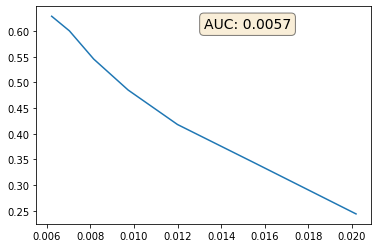

In [16]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(pur[2:], eff[2:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(pur[2:], eff[2:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

Loss 1: 0.14336581528186798 Loss 2: 0.3064906895160675
EDGES: True positive: 25201 True: 26857 Positive 30730
CLUSTER: True positive: 33176.0 True: 36058 Positive: 61648
Loss 1: 0.14070658385753632 Loss 2: 0.3249930441379547
EDGES: True positive: 27735 True: 29581 Positive 35110
CLUSTER: True positive: 41900.0 True: 46360 Positive: 93290
Loss 1: 0.14094644784927368 Loss 2: 0.33543920516967773
EDGES: True positive: 27280 True: 28939 Positive 34610
CLUSTER: True positive: 41778.0 True: 45206 Positive: 100642
Loss 1: 0.14366789162158966 Loss 2: 0.3064197301864624
EDGES: True positive: 25222 True: 26782 Positive 30157
CLUSTER: True positive: 32600.0 True: 35970 Positive: 64178
Loss 1: 0.1434793919324875 Loss 2: 0.32687410712242126
EDGES: True positive: 26305 True: 28382 Positive 33215
CLUSTER: True positive: 40084.0 True: 44324 Positive: 92570
Loss 1: 0.1373339146375656 Loss 2: 0.3147062361240387
EDGES: True positive: 26290 True: 28063 Positive 32315
CLUSTER: True positive: 36684.0 True: 4

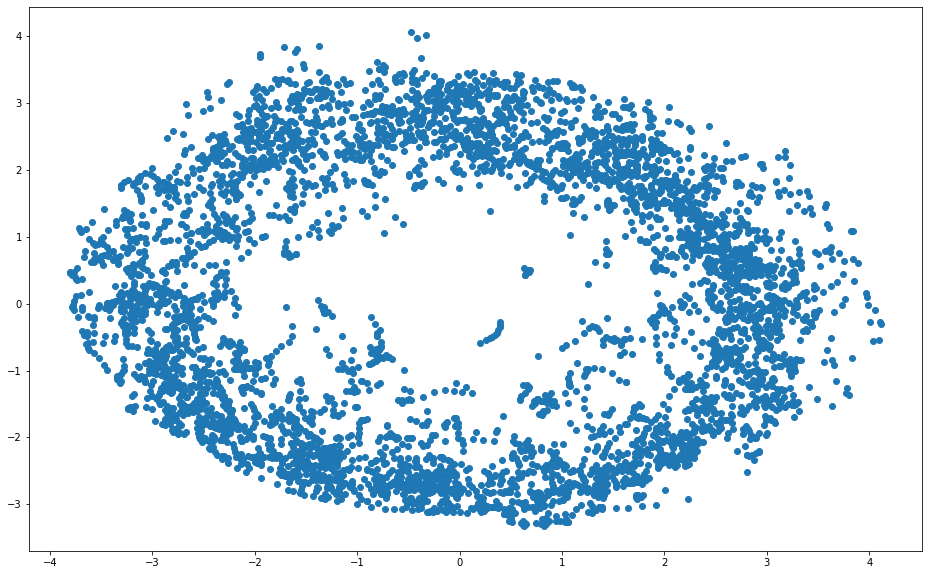

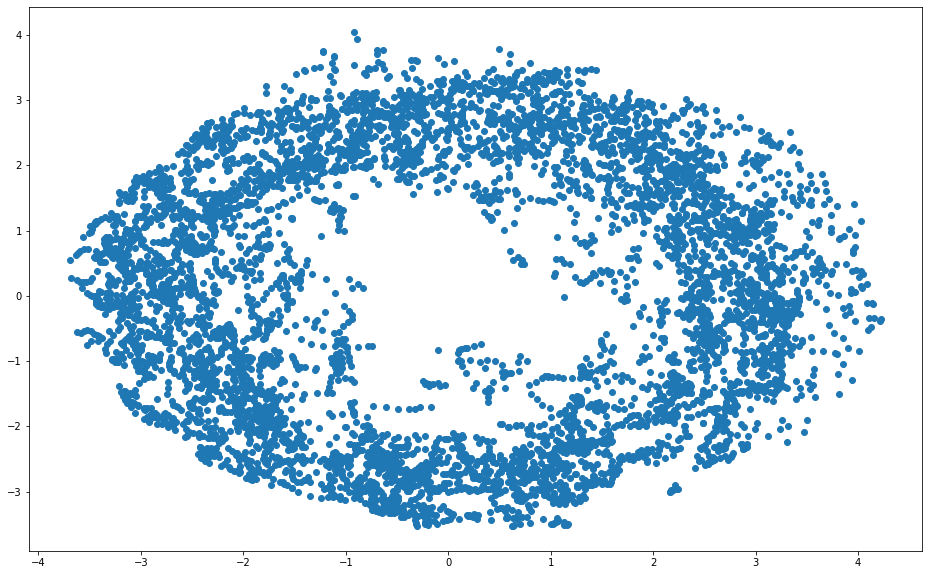

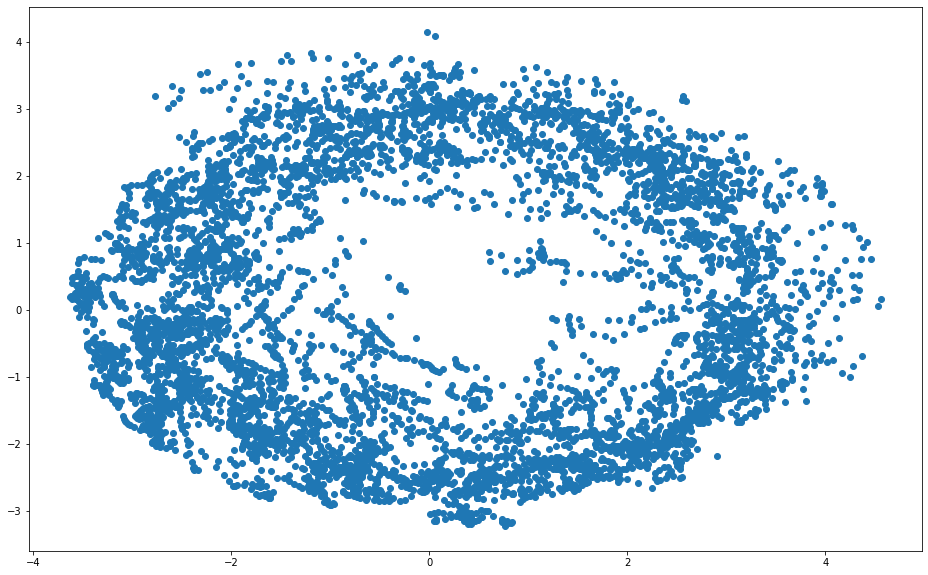

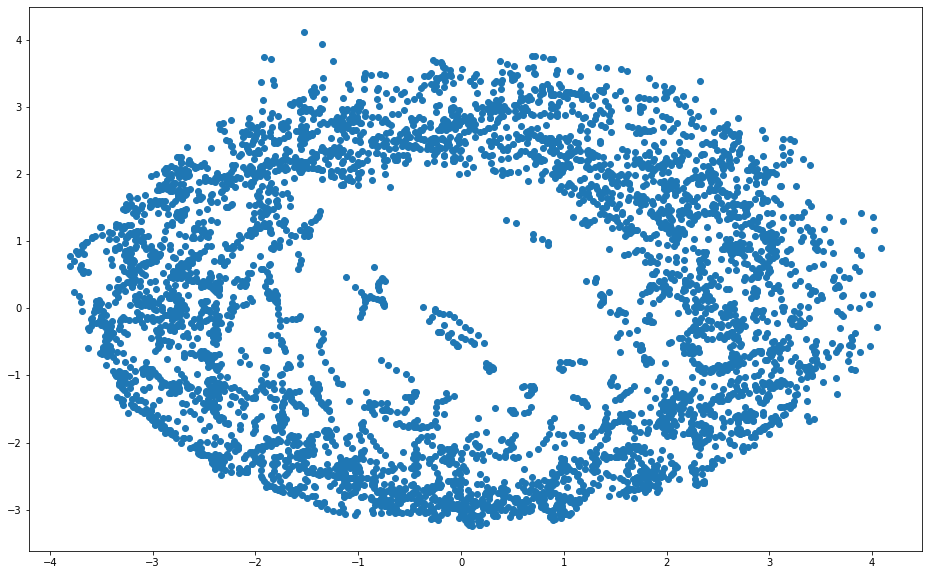

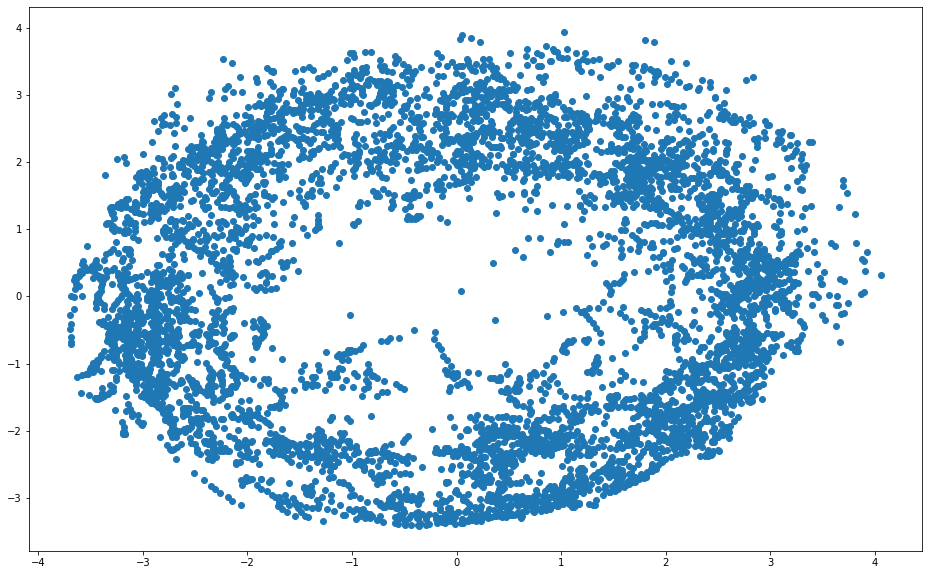

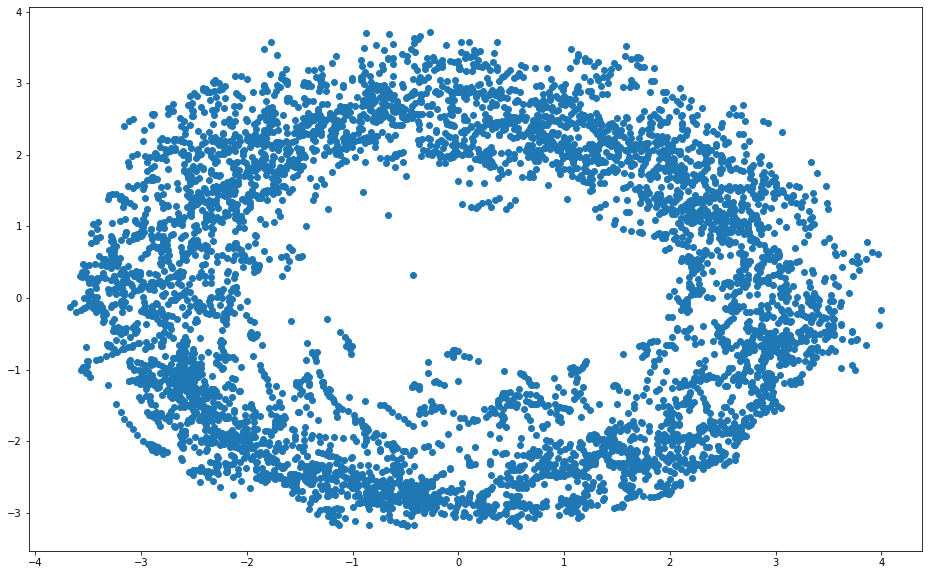

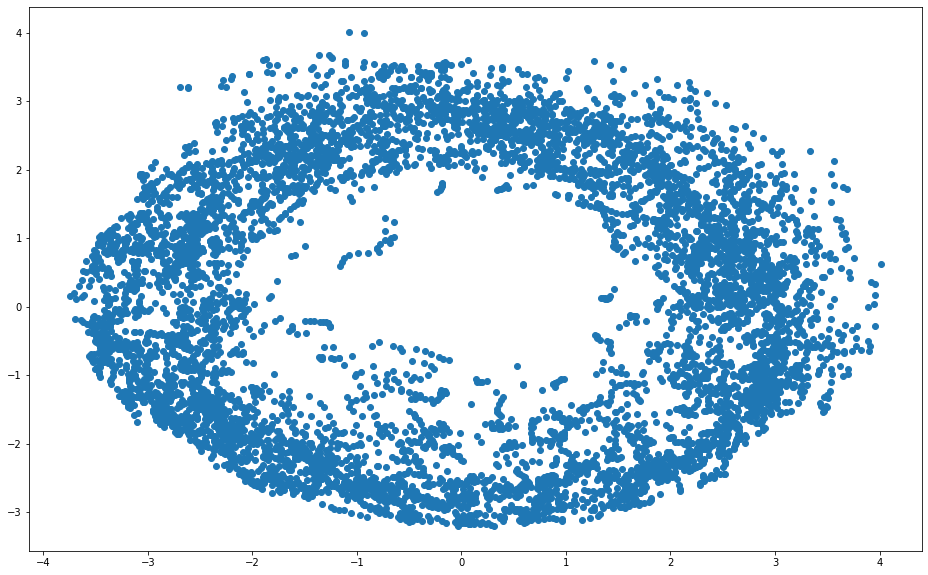

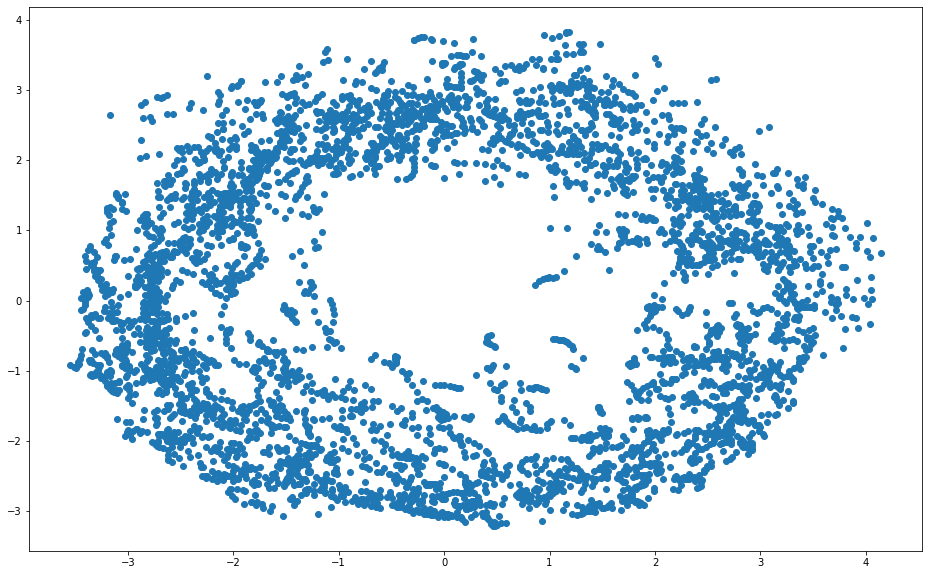

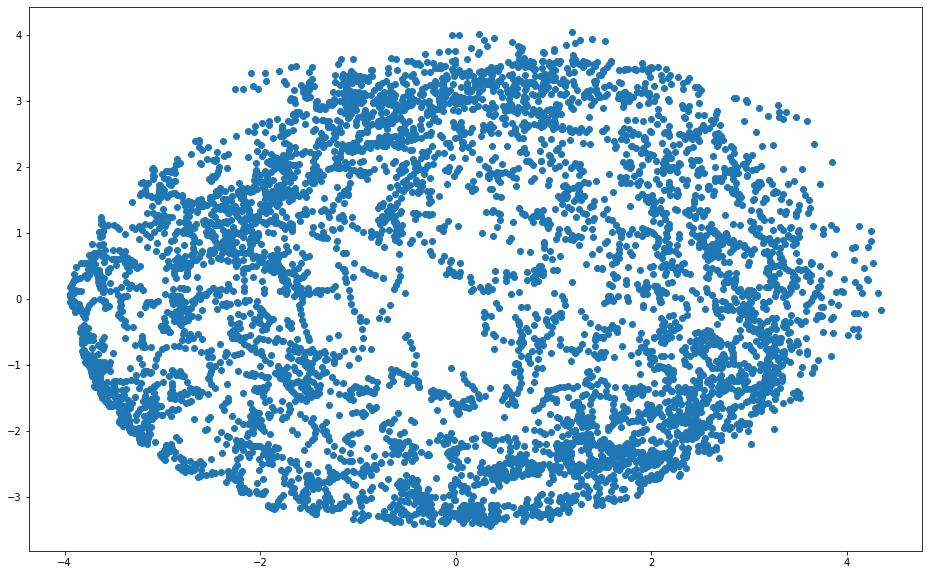

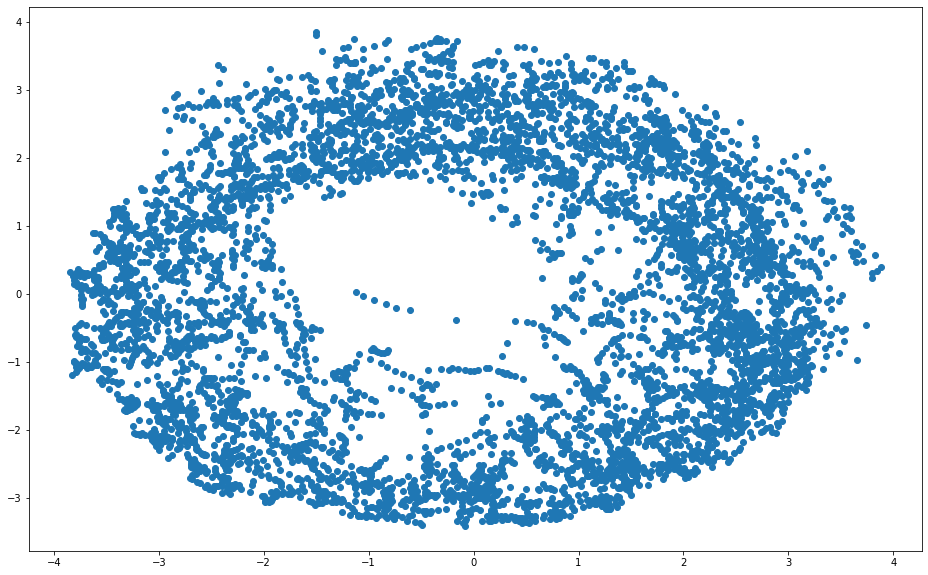

In [33]:
model.eval()
edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0

for batch in test_loader:
    data = batch.to(device)
    pred, spatial, e = model(data)

    e_spatial = radius_graph(spatial, r=1, batch=batch.batch, loop=False, max_num_neighbors=1000)

    reference = spatial.index_select(0, e_spatial[1])
    neighbors = spatial.index_select(0, e_spatial[0])

    d = torch.sum((reference - neighbors)**2, dim=-1)

    y_edge = batch.pid[e[0]] == batch.pid[e[1]]    
    y_cluster = batch.pid[e_spatial[0]] == batch.pid[e_spatial[1]]    
    
    
    hinge = y_cluster.float()
    hinge[batch.pid[e_spatial[0]] != batch.pid[e_spatial[1]]] = -1  
    
    loss_1 = F.binary_cross_entropy_with_logits(pred.float(), y_edge.float(), pos_weight=torch.tensor(weight))
    loss_2 = torch.nn.functional.hinge_embedding_loss(d, hinge)#, margin=m_configs["r"])
    print("Loss 1:", loss_1.item(), "Loss 2:", loss_2.item())
    
    embedded = spatial.cpu().detach().numpy()    
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(embedded)
    #         print("PCA", pca_result)
    plt.figure(figsize=(16,10))
    plt.scatter(pca_result[:,0], pca_result[:,1])

    #Cluster performance
    batch_cpu = batch.pid.cpu()
    pids, counts = np.unique(batch_cpu, return_counts=True)
    cluster_true = (counts * (counts - 1)).sum()

    cluster_true_positive = (y_cluster.float()).sum().item()
    cluster_total_true_positive += cluster_true_positive
    
    cluster_positive = len(e_spatial[0])
    cluster_total_positive += max(cluster_positive, 1)

    cluster_total_true += cluster_true
    
    #Edge performance
    edge_true, edge_false = y_edge.float() > 0.5, y_edge.float() < 0.5
    edge_positive, edge_negative = sig(pred) > 0.5, sig(pred) < 0.5

    edge_correct += ((sig(pred) > 0.5) == (y_edge.float() > 0.5)).sum().item()

    edge_true_positive += (edge_true & edge_positive).sum().item()
    edge_total_true += edge_true.sum().item()
    edge_total_positive += edge_positive.sum().item()

    print("EDGES:", "True positive:", (edge_true & edge_positive).sum().item(), "True:", edge_true.sum().item(), "Positive", edge_positive.sum().item())
    print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive)
    
    total += len(pred)

edge_acc = edge_correct/total
edge_eff = (edge_true_positive / edge_total_true)
edge_pur = (edge_true_positive / edge_total_positive)

cluster_eff = (cluster_total_true_positive / cluster_total_true)
cluster_pur = (cluster_total_true_positive / cluster_total_positive)

print('EDGE Accuracy: {:.4f}, Purity: {:.4f}, Efficiency: {:.4f}'.format(edge_acc, edge_pur, edge_eff))
print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))

### Ideal Output

Need to understand what a perfect run would be:

In [168]:
hits, particles, truth = trackml.dataset.load_event("/global/cscratch1/sd/danieltm/ExaTrkX/trackml/train_all/event000009995", parts=['hits', 'particles', 'truth'])
hits = select_hits(hits, truth, particles, pt_min=1)
hits = hits.reset_index(drop=True)
X = hits[['r', 'phi', 'z']].to_numpy()

KeyboardInterrupt: 

In [37]:
hits_by_pid = hits.groupby('particle_id')

In [43]:
hits.iloc[0].particle_id

4503668346847232.0

In [47]:
hits_by_pid.get_group(hits.iloc[4].particle_id)

,index,hit_id,z,layer,r,phi,particle_id
4,755,20759,55.767399,0,31.478579,0.386283,4503737066323968
5,1932,28706,134.386002,1,71.588509,0.398886,4503737066323968
6,2918,35818,222.261002,2,116.433121,0.412133,4503737066323968
7,3677,41744,331.197998,3,172.121506,0.428472,4503737066323968
8,4463,71425,506.399994,4,261.433929,0.454398,4503737066323968
9,5230,78077,694.799988,5,357.375916,0.482422,4503737066323968
10,5872,84384,972.799988,6,498.434296,0.522718,4503737066323968


In [54]:
hits_by_layer = hits.groupby('layer')

In [ ]:
def build_graph(hits):
    

In [85]:
e = np.empty((0,2), dtype=int)
for hit in hits.itertuples():
    next_layer_hits = hits[(hits.layer == (hit.layer+1)) & (hits.particle_id == hit.particle_id)]
    for match in next_layer_hits.itertuples():
        e = np.vstack([e, np.array([hit.Index, match.Index])])
e = e.T

In [91]:
e

array([[   0,    1,    2, ..., 5848, 5850, 5851],
       [   1,    2,    3, ..., 5849, 5851, 5852]])

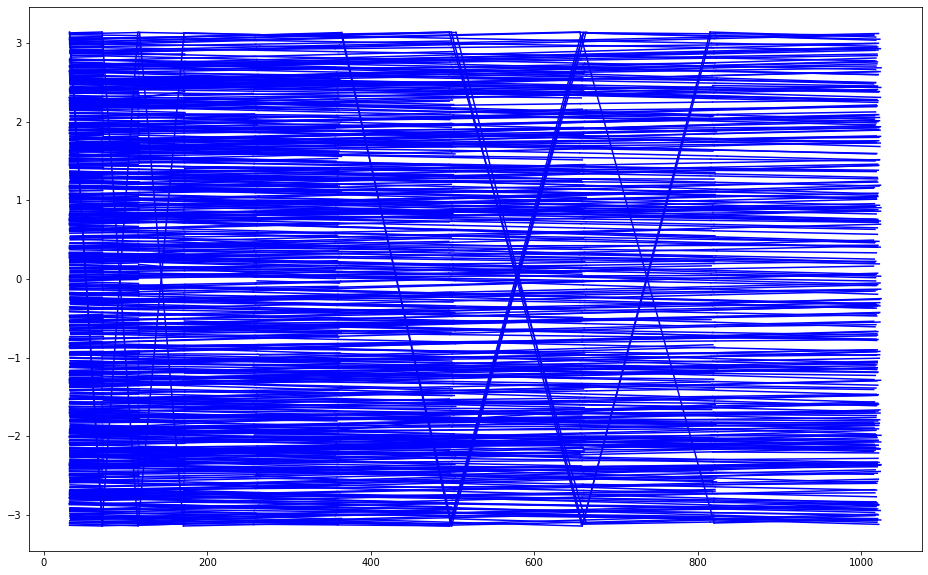

In [89]:
plt.figure(figsize=(16,10))
fig = plt.plot([X[e[0], 0], X[e[1], 0]], [X[e[0], 1], X[e[1], 1]], color='b')

In [25]:
hits

,hit_id,z,layer,r,phi,particle_id
759,20780,18.067400,0,32.115242,0.130827,4503668346847232
1789,27805,47.447601,1,71.451866,0.131796,4503668346847232
2775,34875,81.603401,2,117.187088,0.132817,4503668346847232
3507,40469,122.500000,3,171.948273,0.133906,4503668346847232
755,20759,55.767399,0,31.478579,0.386283,4503737066323968
...,...,...,...,...,...,...
6967,106845,-189.800003,9,1022.799622,1.517001,986295740097626112
174,17221,-117.371002,0,31.722075,-0.189952,995297304355274752
1308,24753,-259.042999,1,71.115891,-0.198223,995297304355274752
2205,30807,-423.179993,2,116.720917,-0.207422,995297304355274752


### Exploration of Output

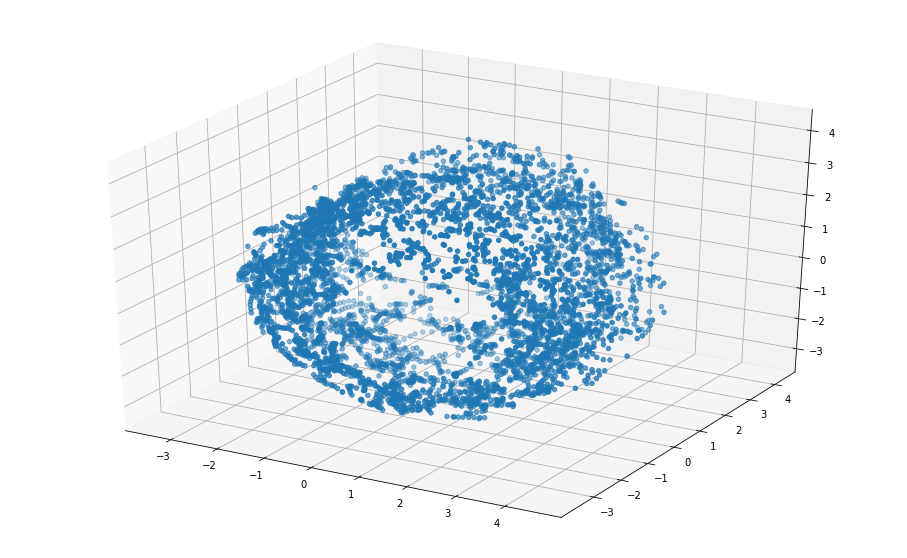

In [34]:
from mpl_toolkits.mplot3d import Axes3D
embedded = spatial.cpu().detach().numpy()
#         print("Embedded", embedded)
pca = PCA(n_components=3)
px = pca.fit_transform(embedded)
#         print("PCA", pca_result)
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(px[:,0], px[:,2], px[:,1])

In [35]:
P = batch.pid.unique()[0]
Pmask = (batch.pid == P).cpu()
x = batch.x.cpu()

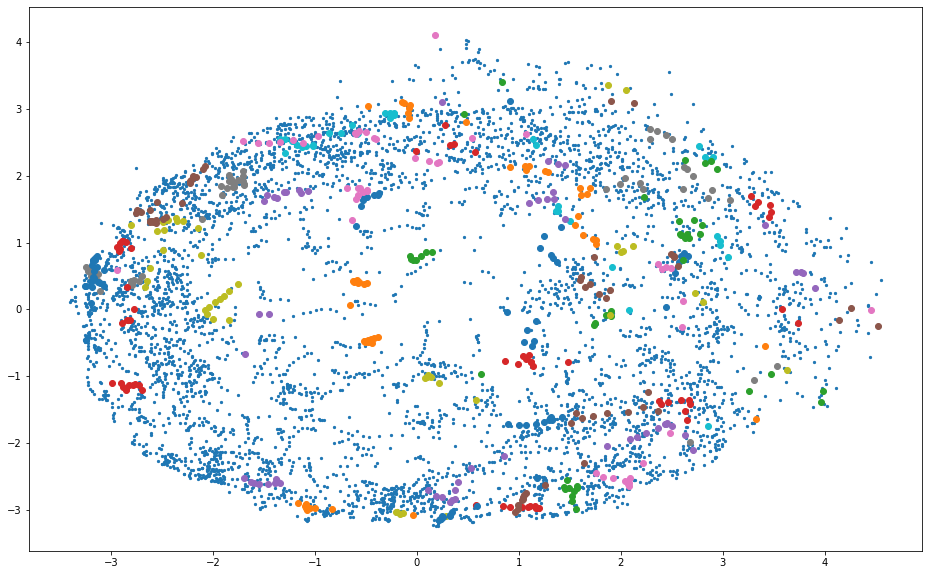

In [38]:
plt.figure(figsize=(16,10))
plt.scatter(px[:,0], px[:,1], s=5)
for P in batch.pid.unique()[::10]:
    Pmask = (batch.pid == P).cpu()
    plt.scatter(px[Pmask,0], px[Pmask,1])

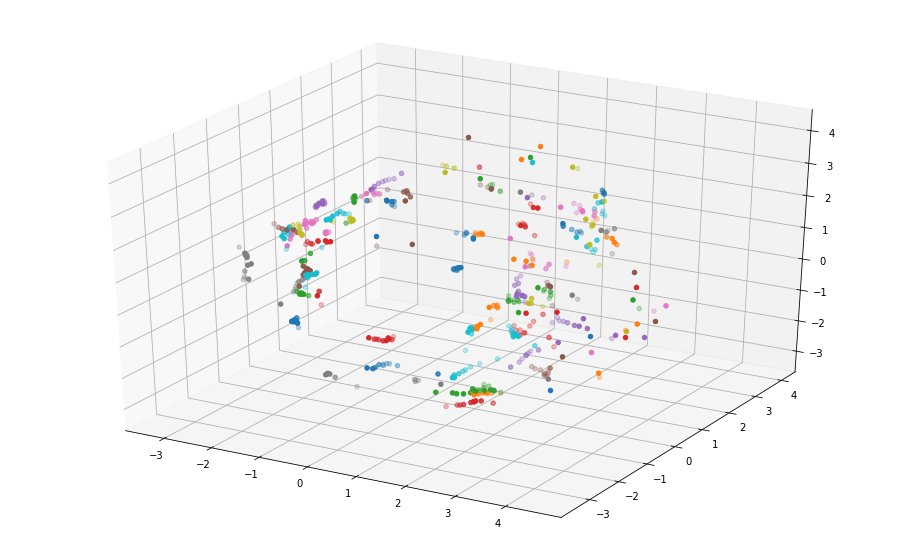

In [39]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
# ax.scatter(px[:,0], px[:,2], px[:,1])
for P in batch.pid.unique()[::10]:
    Pmask = (batch.pid == P).cpu()
    ax.scatter(px[Pmask,0], px[Pmask,2], px[Pmask,1])

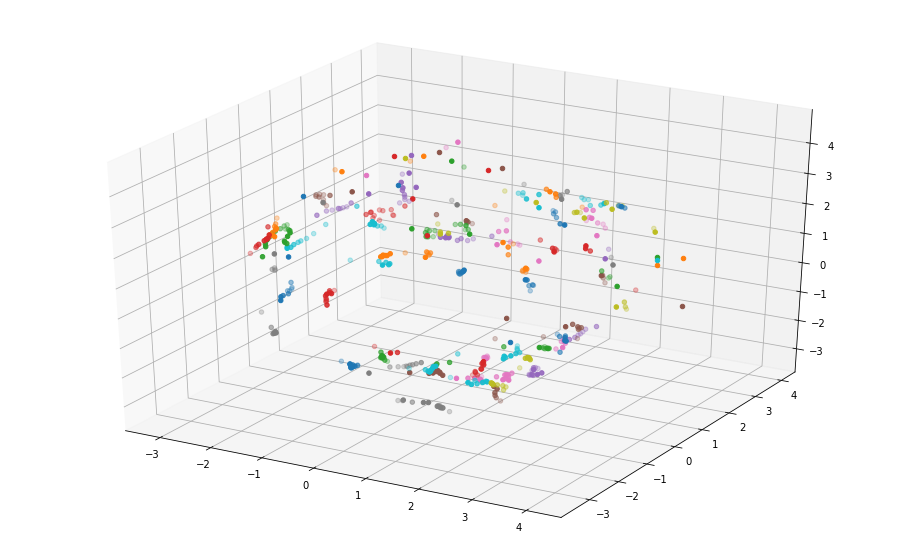

In [40]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
# ax.scatter(px[:,0], px[:,2], px[:,1])
for P in batch.pid.unique()[::10]:
    Pmask = (batch.pid == P).cpu()
    ax.scatter(px[Pmask,1], px[Pmask,2], px[Pmask,0])

In [41]:
pca = PCA(n_components=2)
pcax_result = pca.fit_transform(x)

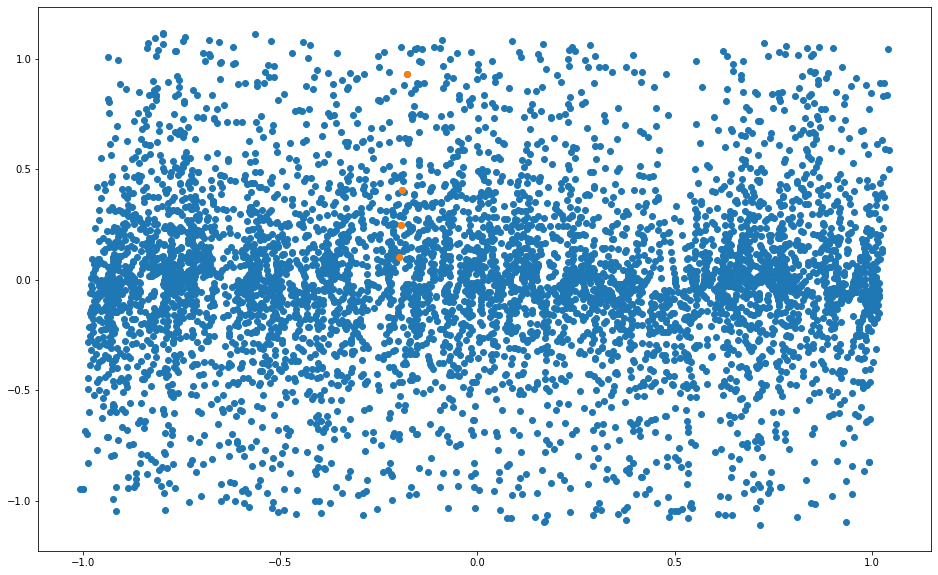

In [42]:
plt.figure(figsize=(16,10))
plt.scatter(pcax_result[:,0], pcax_result[:,1])
plt.scatter(pcax_result[Pmask,0], pcax_result[Pmask,1])

In [43]:
x = x.numpy()
e = e.cpu().numpy()
y = y.cpu().numpy()

NameError: name 'y' is not defined

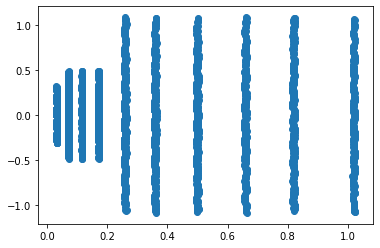

In [44]:
plt.scatter(x[:,0], x[:,2])

In [45]:
true, false, positive, negative = true.cpu().numpy(), false.cpu().numpy(), positive.cpu().numpy(), negative.cpu().numpy()

NameError: name 'true' is not defined

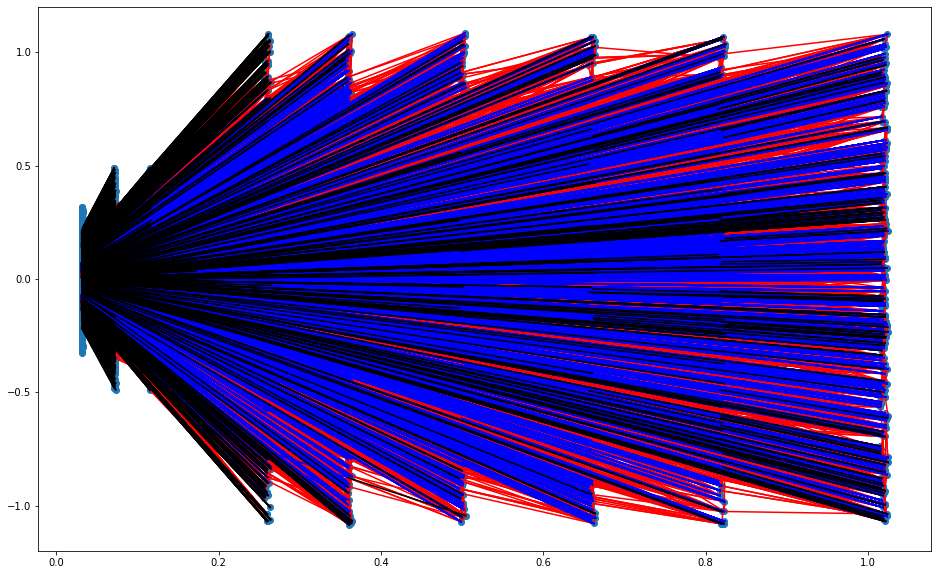

In [166]:
plt.figure(figsize=(16,10))
plt.scatter(x[:,0], x[:,2])
# fig = plt.plot([x[e[0, 0:5000],0], x[e[1, 0:5000],0]],[x[e[0, 0:5000],2], x[e[1, 0:5000],2]], color='r')
# fig = plt.plot([x[e[0, y],0], x[e[1, y],0]],[x[e[0, y],2], x[e[1, y],2]], color='b')
fig = plt.plot([x[e[0, false & positive],0], x[e[1, false & positive],0]],[x[e[0, false & positive],2], x[e[1, false & positive],2]], color='r')
fig = plt.plot([x[e[0, true & positive],0], x[e[1, true & positive],0]],[x[e[0, true & positive],2], x[e[1, true & positive],2]], color='b')
fig = plt.plot([x[e[0, true & negative],0], x[e[1, true & negative],0]],[x[e[0, true & negative],2], x[e[1, true & negative],2]], color='k')

In [167]:
plt.figure(figsize=(16,10))
plt.scatter(x[:,0], x[:,2])
# fig = plt.plot([x[e[0, 0:5000],0], x[e[1, 0:5000],0]],[x[e[0, 0:5000],2], x[e[1, 0:5000],2]], color='r')
# fig = plt.plot([x[e[0, y],0], x[e[1, y],0]],[x[e[0, y],2], x[e[1, y],2]], color='b')
fig = plt.plot([px[e[0, false & positive],0], px[e[1, false & positive],0]],[px[e[0, false & positive],2], px[e[1, false & positive],2]], color='r')
fig = plt.plot([px[e[0, true & positive],0], px[e[1, true & positive],0]],[px[e[0, true & positive],2], px[e[1, true & positive],2]], color='b')
fig = plt.plot([px[e[0, true & negative],0], px[e[1, true & negative],0]],[px[e[0, true & negative],2], px[e[1, true & negative],2]], color='k')

Error in callback <function flush_figures at 0x2aaaad519710> (for post_execute):


KeyboardInterrupt: 

In [168]:
Pindex = np.where(Pmask)

In [169]:
Pe = e[:,np.isin(e[0], Pindex) | np.isin(e[1], Pindex)]

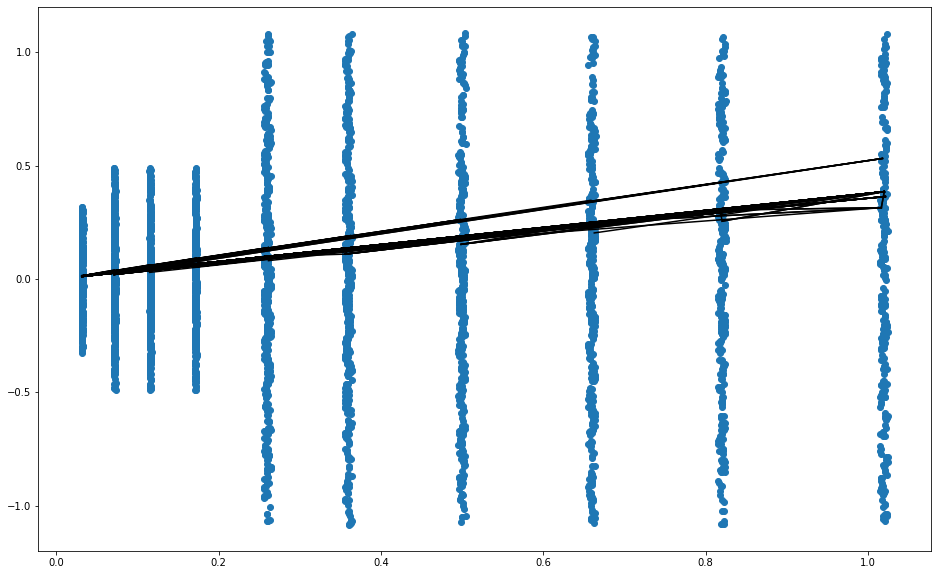

In [170]:
plt.figure(figsize=(16,10))
plt.scatter(x[:,0], x[:,2])
# fig = plt.plot([x[e[0, 0:5000],0], x[e[1, 0:5000],0]],[x[e[0, 0:5000],2], x[e[1, 0:5000],2]], color='r')
# fig = plt.plot([x[e[0, y],0], x[e[1, y],0]],[x[e[0, y],2], x[e[1, y],2]], color='b')
fig = plt.plot([x[Pe[0],0], x[Pe[1],0]],[x[Pe[0],2], x[Pe[1],2]], color='k')